<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# DSI7 Capstone Project - Model Selection and Implementation


---

## Model Selection - Network Analysis

The model used for this project is a Network Analysis, which uses a weighted directioned network. This specific type of network is needed because:
- Directioned: Directions are needed when proposing driving routes because it will impact which edges can be used for each route.
- Weighted: Weights are needed to prioritize one edge over another when calculating routes. Moreover, changing the weight of each edge is how the model will take into consideration additional factors other than length of an edge when calculating the routes.

### Network Development

Once the final crime subset and the LA network dataset are ready, the next step is to integrate the crime data with the network to take it into consideration when calculating routes.

In order to achieve this, a new column is added to the crime DataFrame that will have the nearest node to each of the crime's locations. The nearest node is added to the column by using a list comprehension with the get_nearest_node function from the OSMnx module. This function uses each of the locations in latitude and longitude and the LA network as inputs and returns a tuple with the node in the network that is closest to the crime and the distance from the node to the crime.

In [318]:
crime['nearest_node'] = [ox.get_nearest_node(LA, literal_eval(loc), return_dist=True) for loc in tqdm(crime['location'])]











  0%|          | 0/319066 [00:00<?, ?it/s]









  0%|          | 1/319066 [00:00<22:14:37,  3.98it/s]









  0%|          | 2/319066 [00:00<18:52:10,  4.70it/s]









  0%|          | 3/319066 [00:00<15:56:31,  5.56it/s]









  0%|          | 4/319066 [00:00<13:51:27,  6.40it/s]









  0%|          | 6/319066 [00:00<12:07:15,  7.31it/s]









  0%|          | 7/319066 [00:00<11:14:06,  7.89it/s]









  0%|          | 8/319066 [00:00<10:44:47,  8.25it/s]









  0%|          | 9/319066 [00:01<10:13:23,  8.67it/s]









  0%|          | 11/319066 [00:01<9:28:41,  9.35it/s]









  0%|          | 12/319066 [00:03<62:29:00,  1.42it/s]









  0%|          | 13/319066 [00:03<46:43:39,  1.90it/s]









  0%|          | 15/319066 [00:03<35:07:41,  2.52it/s]









  0%|          | 17/319066 [00:03<26:53:57,  3.29it/s]









  0%|          | 19/319066 [00:03<21:00:58,  4.22it/s]









  0%|          | 21/319066 [00:05<28:16:23,  3.13it

  0%|          | 271/319066 [00:53<16:16:10,  5.44it/s]









  0%|          | 273/319066 [00:53<13:49:29,  6.41it/s]









  0%|          | 275/319066 [00:53<12:13:28,  7.24it/s]









  0%|          | 276/319066 [00:54<32:03:05,  2.76it/s]









  0%|          | 277/319066 [00:54<25:36:37,  3.46it/s]









  0%|          | 279/319066 [00:55<20:10:43,  4.39it/s]









  0%|          | 281/319066 [00:55<16:22:00,  5.41it/s]









  0%|          | 283/319066 [00:55<13:48:33,  6.41it/s]









  0%|          | 285/319066 [00:56<23:45:19,  3.73it/s]









  0%|          | 287/319066 [00:56<18:49:26,  4.70it/s]









  0%|          | 289/319066 [00:56<15:34:24,  5.69it/s]









  0%|          | 291/319066 [00:57<13:20:16,  6.64it/s]









  0%|          | 293/319066 [00:57<21:50:23,  4.05it/s]









  0%|          | 295/319066 [00:58<17:44:54,  4.99it/s]









  0%|          | 297/319066 [00:58<14:56:30,  5.93it/s]









  0%|          | 299/3190

  0%|          | 508/319066 [01:40<22:30:08,  3.93it/s]









  0%|          | 509/319066 [01:40<19:00:12,  4.66it/s]









  0%|          | 510/319066 [01:40<16:23:00,  5.40it/s]









  0%|          | 511/319066 [01:41<14:41:31,  6.02it/s]









  0%|          | 512/319066 [01:41<13:27:14,  6.58it/s]









  0%|          | 513/319066 [01:41<12:27:52,  7.10it/s]









  0%|          | 514/319066 [01:42<34:56:00,  2.53it/s]









  0%|          | 515/319066 [01:42<27:47:33,  3.18it/s]









  0%|          | 516/319066 [01:42<22:13:27,  3.98it/s]









  0%|          | 517/319066 [01:42<18:37:58,  4.75it/s]









  0%|          | 518/319066 [01:42<16:14:46,  5.45it/s]









  0%|          | 519/319066 [01:42<14:46:20,  5.99it/s]









  0%|          | 520/319066 [01:43<13:39:06,  6.48it/s]









  0%|          | 521/319066 [01:43<12:44:23,  6.95it/s]









  0%|          | 522/319066 [01:44<36:28:03,  2.43it/s]









  0%|          | 523/3190

  0%|          | 698/319066 [02:20<19:23:59,  4.56it/s]









  0%|          | 699/319066 [02:21<17:08:00,  5.16it/s]









  0%|          | 700/319066 [02:21<14:48:30,  5.97it/s]









  0%|          | 701/319066 [02:21<13:01:44,  6.79it/s]









  0%|          | 702/319066 [02:21<11:51:32,  7.46it/s]









  0%|          | 703/319066 [02:21<11:00:28,  8.03it/s]









  0%|          | 704/319066 [02:22<28:15:56,  3.13it/s]









  0%|          | 705/319066 [02:22<22:26:20,  3.94it/s]









  0%|          | 706/319066 [02:22<18:31:03,  4.78it/s]









  0%|          | 707/319066 [02:22<15:47:40,  5.60it/s]









  0%|          | 709/319066 [02:22<13:20:05,  6.63it/s]









  0%|          | 711/319066 [02:22<11:29:32,  7.69it/s]









  0%|          | 713/319066 [02:23<20:55:02,  4.23it/s]









  0%|          | 715/319066 [02:24<16:55:36,  5.22it/s]









  0%|          | 717/319066 [02:24<14:05:49,  6.27it/s]









  0%|          | 719/3190

  0%|          | 991/319066 [03:15<12:08:13,  7.28it/s]









  0%|          | 993/319066 [03:16<21:30:41,  4.11it/s]









  0%|          | 994/319066 [03:17<17:43:04,  4.99it/s]









  0%|          | 996/319066 [03:17<14:56:10,  5.92it/s]









  0%|          | 998/319066 [03:17<12:56:45,  6.82it/s]









  0%|          | 999/319066 [03:17<11:42:54,  7.54it/s]









  0%|          | 1000/319066 [03:18<32:16:03,  2.74it/s]









  0%|          | 1002/319066 [03:18<25:05:06,  3.52it/s]









  0%|          | 1004/319066 [03:18<20:03:35,  4.40it/s]









  0%|          | 1006/319066 [03:18<16:32:44,  5.34it/s]









  0%|          | 1008/319066 [03:19<24:44:17,  3.57it/s]









  0%|          | 1010/319066 [03:20<19:48:24,  4.46it/s]









  0%|          | 1012/319066 [03:20<16:23:18,  5.39it/s]









  0%|          | 1014/319066 [03:20<13:57:51,  6.33it/s]









  0%|          | 1015/319066 [03:20<12:31:38,  7.05it/s]









  0%|          |

  0%|          | 1300/319066 [04:14<16:08:01,  5.47it/s]









  0%|          | 1302/319066 [04:14<13:47:28,  6.40it/s]









  0%|          | 1304/319066 [04:15<22:50:45,  3.86it/s]









  0%|          | 1306/319066 [04:15<18:29:24,  4.77it/s]









  0%|          | 1308/319066 [04:15<15:25:58,  5.72it/s]









  0%|          | 1310/319066 [04:16<13:24:27,  6.58it/s]









  0%|          | 1312/319066 [04:16<11:54:01,  7.42it/s]









  0%|          | 1313/319066 [04:17<32:20:04,  2.73it/s]









  0%|          | 1315/319066 [04:17<25:06:37,  3.52it/s]









  0%|          | 1317/319066 [04:17<20:04:07,  4.40it/s]









  0%|          | 1319/319066 [04:17<16:32:25,  5.34it/s]









  0%|          | 1321/319066 [04:18<24:39:16,  3.58it/s]









  0%|          | 1323/319066 [04:18<19:44:24,  4.47it/s]









  0%|          | 1325/319066 [04:19<16:18:05,  5.41it/s]









  0%|          | 1326/319066 [04:19<14:04:20,  6.27it/s]









  0%|     

  1%|          | 1605/319066 [05:11<14:49:33,  5.95it/s]









  1%|          | 1607/319066 [05:12<12:49:50,  6.87it/s]









  1%|          | 1609/319066 [05:13<22:02:22,  4.00it/s]









  1%|          | 1611/319066 [05:13<17:55:03,  4.92it/s]









  1%|          | 1613/319066 [05:13<15:02:47,  5.86it/s]









  1%|          | 1615/319066 [05:13<13:01:05,  6.77it/s]









  1%|          | 1617/319066 [05:14<22:16:23,  3.96it/s]









  1%|          | 1618/319066 [05:14<18:15:30,  4.83it/s]









  1%|          | 1620/319066 [05:14<15:15:10,  5.78it/s]









  1%|          | 1622/319066 [05:15<13:06:01,  6.73it/s]









  1%|          | 1623/319066 [05:15<11:49:09,  7.46it/s]









  1%|          | 1625/319066 [05:16<21:31:33,  4.10it/s]









  1%|          | 1627/319066 [05:16<17:33:02,  5.02it/s]









  1%|          | 1629/319066 [05:16<14:45:04,  5.98it/s]









  1%|          | 1631/319066 [05:16<12:48:02,  6.89it/s]









  1%|     

  1%|          | 1870/319066 [06:02<13:36:18,  6.48it/s]









  1%|          | 1871/319066 [06:03<12:32:06,  7.03it/s]









  1%|          | 1872/319066 [06:04<32:59:53,  2.67it/s]









  1%|          | 1874/319066 [06:04<25:18:57,  3.48it/s]









  1%|          | 1876/319066 [06:04<20:12:17,  4.36it/s]









  1%|          | 1877/319066 [06:04<17:08:10,  5.14it/s]









  1%|          | 1878/319066 [06:04<14:49:47,  5.94it/s]









  1%|          | 1879/319066 [06:04<13:23:04,  6.58it/s]









  1%|          | 1880/319066 [06:04<12:10:20,  7.24it/s]









  1%|          | 1881/319066 [06:05<34:51:36,  2.53it/s]









  1%|          | 1882/319066 [06:05<27:26:26,  3.21it/s]









  1%|          | 1883/319066 [06:06<22:12:15,  3.97it/s]









  1%|          | 1884/319066 [06:06<18:33:56,  4.75it/s]









  1%|          | 1885/319066 [06:06<15:51:50,  5.55it/s]









  1%|          | 1886/319066 [06:06<14:11:09,  6.21it/s]









  1%|     

  1%|          | 2063/319066 [06:43<26:28:59,  3.32it/s]









  1%|          | 2065/319066 [06:43<21:09:53,  4.16it/s]









  1%|          | 2067/319066 [06:43<17:06:00,  5.15it/s]









  1%|          | 2069/319066 [06:43<14:12:06,  6.20it/s]









  1%|          | 2070/319066 [06:44<33:39:18,  2.62it/s]









  1%|          | 2071/319066 [06:44<26:27:18,  3.33it/s]









  1%|          | 2072/319066 [06:44<21:23:54,  4.11it/s]









  1%|          | 2073/319066 [06:44<18:02:58,  4.88it/s]









  1%|          | 2074/319066 [06:44<15:34:42,  5.65it/s]









  1%|          | 2075/319066 [06:45<13:50:31,  6.36it/s]









  1%|          | 2076/319066 [06:45<12:34:06,  7.01it/s]









  1%|          | 2077/319066 [06:45<11:48:21,  7.46it/s]









  1%|          | 2078/319066 [06:46<33:45:02,  2.61it/s]









  1%|          | 2079/319066 [06:46<26:29:08,  3.32it/s]









  1%|          | 2080/319066 [06:46<21:33:44,  4.08it/s]









  1%|     

  1%|          | 2258/319066 [07:22<13:53:53,  6.33it/s]









  1%|          | 2260/319066 [07:23<23:15:34,  3.78it/s]









  1%|          | 2261/319066 [07:23<19:20:03,  4.55it/s]









  1%|          | 2262/319066 [07:23<16:31:16,  5.33it/s]









  1%|          | 2263/319066 [07:23<14:33:47,  6.04it/s]









  1%|          | 2264/319066 [07:23<13:09:08,  6.69it/s]









  1%|          | 2265/319066 [07:23<12:10:00,  7.23it/s]









  1%|          | 2266/319066 [07:23<11:30:57,  7.64it/s]









  1%|          | 2267/319066 [07:24<34:07:37,  2.58it/s]









  1%|          | 2268/319066 [07:24<26:46:43,  3.29it/s]









  1%|          | 2269/319066 [07:24<21:25:05,  4.11it/s]









  1%|          | 2271/319066 [07:25<17:15:33,  5.10it/s]









  1%|          | 2273/319066 [07:25<14:19:20,  6.14it/s]









  1%|          | 2275/319066 [07:25<12:21:39,  7.12it/s]









  1%|          | 2277/319066 [07:26<22:47:37,  3.86it/s]









  1%|     

  1%|          | 2462/319066 [08:04<13:30:08,  6.51it/s]









  1%|          | 2463/319066 [08:04<12:11:26,  7.21it/s]









  1%|          | 2464/319066 [08:04<11:32:49,  7.62it/s]









  1%|          | 2465/319066 [08:05<32:40:59,  2.69it/s]









  1%|          | 2466/319066 [08:05<26:03:16,  3.38it/s]









  1%|          | 2467/319066 [08:06<21:15:08,  4.14it/s]









  1%|          | 2468/319066 [08:06<17:42:13,  4.97it/s]









  1%|          | 2469/319066 [08:06<15:32:30,  5.66it/s]









  1%|          | 2470/319066 [08:06<13:52:58,  6.33it/s]









  1%|          | 2471/319066 [08:06<12:45:24,  6.89it/s]









  1%|          | 2472/319066 [08:06<11:50:02,  7.43it/s]









  1%|          | 2473/319066 [08:07<34:11:55,  2.57it/s]









  1%|          | 2474/319066 [08:07<26:52:41,  3.27it/s]









  1%|          | 2475/319066 [08:07<21:30:05,  4.09it/s]









  1%|          | 2477/319066 [08:08<17:27:25,  5.04it/s]









  1%|     

  1%|          | 2666/319066 [08:46<15:28:17,  5.68it/s]









  1%|          | 2667/319066 [08:46<13:31:22,  6.50it/s]









  1%|          | 2668/319066 [08:47<12:20:38,  7.12it/s]









  1%|          | 2669/319066 [08:47<11:34:41,  7.59it/s]









  1%|          | 2670/319066 [08:48<31:39:47,  2.78it/s]









  1%|          | 2672/319066 [08:48<24:19:25,  3.61it/s]









  1%|          | 2674/319066 [08:48<19:27:55,  4.52it/s]









  1%|          | 2675/319066 [08:48<16:34:41,  5.30it/s]









  1%|          | 2676/319066 [08:48<14:26:38,  6.08it/s]









  1%|          | 2677/319066 [08:48<13:03:22,  6.73it/s]









  1%|          | 2678/319066 [08:48<12:06:25,  7.26it/s]









  1%|          | 2679/319066 [08:49<33:50:31,  2.60it/s]









  1%|          | 2680/319066 [08:49<26:25:18,  3.33it/s]









  1%|          | 2681/319066 [08:50<21:26:29,  4.10it/s]









  1%|          | 2682/319066 [08:50<17:51:24,  4.92it/s]









  1%|     

  1%|          | 2865/319066 [09:26<12:53:59,  6.81it/s]









  1%|          | 2866/319066 [09:26<11:54:45,  7.37it/s]









  1%|          | 2867/319066 [09:27<11:17:04,  7.78it/s]









  1%|          | 2868/319066 [09:28<32:59:08,  2.66it/s]









  1%|          | 2869/319066 [09:28<25:56:57,  3.38it/s]









  1%|          | 2870/319066 [09:28<21:10:35,  4.15it/s]









  1%|          | 2871/319066 [09:28<17:33:57,  5.00it/s]









  1%|          | 2872/319066 [09:28<15:19:05,  5.73it/s]









  1%|          | 2873/319066 [09:28<13:49:08,  6.36it/s]









  1%|          | 2874/319066 [09:28<12:28:20,  7.04it/s]









  1%|          | 2875/319066 [09:28<11:32:40,  7.61it/s]









  1%|          | 2876/319066 [09:29<30:29:31,  2.88it/s]









  1%|          | 2878/319066 [09:29<23:33:01,  3.73it/s]









  1%|          | 2880/319066 [09:30<19:01:18,  4.62it/s]









  1%|          | 2881/319066 [09:30<16:13:20,  5.41it/s]









  1%|     

  1%|          | 3063/319066 [10:07<14:21:30,  6.11it/s]









  1%|          | 3064/319066 [10:07<13:05:40,  6.70it/s]









  1%|          | 3065/319066 [10:07<12:05:43,  7.26it/s]









  1%|          | 3066/319066 [10:08<31:17:34,  2.81it/s]









  1%|          | 3068/319066 [10:08<24:07:02,  3.64it/s]









  1%|          | 3070/319066 [10:08<19:19:01,  4.54it/s]









  1%|          | 3071/319066 [10:08<16:22:36,  5.36it/s]









  1%|          | 3072/319066 [10:08<14:21:29,  6.11it/s]









  1%|          | 3073/319066 [10:08<13:10:33,  6.66it/s]









  1%|          | 3074/319066 [10:09<35:16:17,  2.49it/s]









  1%|          | 3075/319066 [10:10<27:39:53,  3.17it/s]









  1%|          | 3076/319066 [10:10<22:12:37,  3.95it/s]









  1%|          | 3077/319066 [10:10<18:36:40,  4.72it/s]









  1%|          | 3078/319066 [10:10<16:05:10,  5.46it/s]









  1%|          | 3079/319066 [10:10<14:03:39,  6.24it/s]









  1%|     

  1%|          | 3272/319066 [10:49<21:14:47,  4.13it/s]









  1%|          | 3274/319066 [10:49<17:22:11,  5.05it/s]









  1%|          | 3275/319066 [10:49<14:49:39,  5.92it/s]









  1%|          | 3277/319066 [10:50<12:50:43,  6.83it/s]









  1%|          | 3279/319066 [10:50<11:28:41,  7.64it/s]









  1%|          | 3280/319066 [10:51<31:41:27,  2.77it/s]









  1%|          | 3282/319066 [10:51<24:39:36,  3.56it/s]









  1%|          | 3284/319066 [10:51<19:45:07,  4.44it/s]









  1%|          | 3286/319066 [10:51<16:18:40,  5.38it/s]









  1%|          | 3288/319066 [10:52<24:22:15,  3.60it/s]









  1%|          | 3289/319066 [10:52<19:42:59,  4.45it/s]









  1%|          | 3291/319066 [10:53<16:14:49,  5.40it/s]









  1%|          | 3293/319066 [10:53<13:49:52,  6.34it/s]









  1%|          | 3294/319066 [10:53<12:19:02,  7.12it/s]









  1%|          | 3296/319066 [10:54<21:38:00,  4.05it/s]









  1%|     

  1%|          | 3578/319066 [11:47<16:53:52,  5.19it/s]









  1%|          | 3580/319066 [11:48<14:01:04,  6.25it/s]









  1%|          | 3582/319066 [11:48<12:18:07,  7.12it/s]









  1%|          | 3583/319066 [11:48<11:25:27,  7.67it/s]









  1%|          | 3584/319066 [11:49<30:09:59,  2.91it/s]









  1%|          | 3585/319066 [11:49<23:44:53,  3.69it/s]









  1%|          | 3587/319066 [11:49<19:03:35,  4.60it/s]









  1%|          | 3589/319066 [11:49<15:50:31,  5.53it/s]









  1%|          | 3591/319066 [11:49<13:37:53,  6.43it/s]









  1%|          | 3592/319066 [11:50<12:12:24,  7.18it/s]









  1%|          | 3593/319066 [11:50<32:22:05,  2.71it/s]









  1%|          | 3595/319066 [11:51<25:07:45,  3.49it/s]









  1%|          | 3596/319066 [11:51<20:15:00,  4.33it/s]









  1%|          | 3598/319066 [11:51<16:39:55,  5.26it/s]









  1%|          | 3600/319066 [11:51<14:07:42,  6.20it/s]









  1%|     

  1%|          | 3876/319066 [12:44<20:11:39,  4.34it/s]









  1%|          | 3878/319066 [12:45<16:37:48,  5.26it/s]









  1%|          | 3880/319066 [12:45<14:08:06,  6.19it/s]









  1%|          | 3881/319066 [12:46<33:12:07,  2.64it/s]









  1%|          | 3883/319066 [12:46<25:45:58,  3.40it/s]









  1%|          | 3885/319066 [12:46<20:32:28,  4.26it/s]









  1%|          | 3887/319066 [12:46<16:35:58,  5.27it/s]









  1%|          | 3889/319066 [12:47<24:41:42,  3.55it/s]









  1%|          | 3891/319066 [12:47<19:45:49,  4.43it/s]









  1%|          | 3893/319066 [12:48<16:19:09,  5.36it/s]









  1%|          | 3895/319066 [12:48<13:53:45,  6.30it/s]









  1%|          | 3897/319066 [12:49<22:43:52,  3.85it/s]









  1%|          | 3899/319066 [12:49<18:21:22,  4.77it/s]









  1%|          | 3901/319066 [12:49<15:17:26,  5.73it/s]









  1%|          | 3902/319066 [12:49<13:20:18,  6.56it/s]









  1%|     

  1%|▏         | 4169/319066 [13:40<18:02:41,  4.85it/s]









  1%|▏         | 4171/319066 [13:40<14:56:23,  5.85it/s]









  1%|▏         | 4173/319066 [13:41<12:47:51,  6.83it/s]









  1%|▏         | 4175/319066 [13:41<11:17:20,  7.75it/s]









  1%|▏         | 4177/319066 [13:42<20:15:52,  4.32it/s]









  1%|▏         | 4179/319066 [13:42<16:31:24,  5.29it/s]









  1%|▏         | 4181/319066 [13:42<13:56:06,  6.28it/s]









  1%|▏         | 4183/319066 [13:42<12:06:56,  7.22it/s]









  1%|▏         | 4185/319066 [13:43<20:49:50,  4.20it/s]









  1%|▏         | 4187/319066 [13:43<16:56:33,  5.16it/s]









  1%|▏         | 4189/319066 [13:44<14:10:55,  6.17it/s]









  1%|▏         | 4191/319066 [13:44<12:23:22,  7.06it/s]









  1%|▏         | 4192/319066 [13:44<11:21:06,  7.70it/s]









  1%|▏         | 4193/319066 [13:45<30:56:53,  2.83it/s]









  1%|▏         | 4195/319066 [13:45<23:51:18,  3.67it/s]









  1%|▏    

  1%|▏         | 4505/319066 [14:40<12:02:41,  7.25it/s]









  1%|▏         | 4506/319066 [14:41<30:51:48,  2.83it/s]









  1%|▏         | 4508/319066 [14:41<24:00:05,  3.64it/s]









  1%|▏         | 4510/319066 [14:42<19:11:40,  4.55it/s]









  1%|▏         | 4512/319066 [14:42<15:47:40,  5.53it/s]









  1%|▏         | 4514/319066 [14:43<23:35:23,  3.70it/s]









  1%|▏         | 4516/319066 [14:43<18:55:31,  4.62it/s]









  1%|▏         | 4518/319066 [14:43<15:35:53,  5.60it/s]









  1%|▏         | 4520/319066 [14:43<13:14:43,  6.60it/s]









  1%|▏         | 4522/319066 [14:43<11:38:46,  7.50it/s]









  1%|▏         | 4524/319066 [14:44<20:30:18,  4.26it/s]









  1%|▏         | 4526/319066 [14:45<16:43:19,  5.22it/s]









  1%|▏         | 4528/319066 [14:45<14:02:42,  6.22it/s]









  1%|▏         | 4530/319066 [14:45<12:11:42,  7.16it/s]









  1%|▏         | 4531/319066 [14:46<30:53:49,  2.83it/s]









  1%|▏    

  2%|▏         | 4833/319066 [15:40<15:41:29,  5.56it/s]









  2%|▏         | 4835/319066 [15:41<23:33:06,  3.71it/s]









  2%|▏         | 4837/319066 [15:42<18:52:57,  4.62it/s]









  2%|▏         | 4839/319066 [15:42<15:34:07,  5.61it/s]









  2%|▏         | 4841/319066 [15:42<13:14:06,  6.59it/s]









  2%|▏         | 4843/319066 [15:42<11:37:10,  7.51it/s]









  2%|▏         | 4845/319066 [15:43<20:32:17,  4.25it/s]









  2%|▏         | 4847/319066 [15:43<16:42:36,  5.22it/s]









  2%|▏         | 4849/319066 [15:43<14:03:08,  6.21it/s]









  2%|▏         | 4851/319066 [15:44<12:10:11,  7.17it/s]









  2%|▏         | 4853/319066 [15:45<20:47:49,  4.20it/s]









  2%|▏         | 4855/319066 [15:45<16:54:17,  5.16it/s]









  2%|▏         | 4857/319066 [15:45<14:09:59,  6.16it/s]









  2%|▏         | 4859/319066 [15:45<12:14:57,  7.13it/s]









  2%|▏         | 4860/319066 [15:46<31:01:21,  2.81it/s]









  2%|▏    

  2%|▏         | 5151/319066 [16:39<16:49:01,  5.19it/s]









  2%|▏         | 5153/319066 [16:39<14:06:00,  6.18it/s]









  2%|▏         | 5155/319066 [16:39<12:11:25,  7.15it/s]









  2%|▏         | 5157/319066 [16:40<21:01:24,  4.15it/s]









  2%|▏         | 5159/319066 [16:40<17:02:30,  5.12it/s]









  2%|▏         | 5161/319066 [16:40<14:17:19,  6.10it/s]









  2%|▏         | 5163/319066 [16:41<12:20:16,  7.07it/s]









  2%|▏         | 5165/319066 [16:42<20:54:28,  4.17it/s]









  2%|▏         | 5167/319066 [16:42<16:57:52,  5.14it/s]









  2%|▏         | 5169/319066 [16:42<14:12:53,  6.13it/s]









  2%|▏         | 5171/319066 [16:42<12:16:56,  7.10it/s]









  2%|▏         | 5173/319066 [16:43<20:56:20,  4.16it/s]









  2%|▏         | 5175/319066 [16:43<17:07:15,  5.09it/s]









  2%|▏         | 5177/319066 [16:43<14:19:22,  6.09it/s]









  2%|▏         | 5179/319066 [16:44<12:24:40,  7.03it/s]









  2%|▏    

  2%|▏         | 5481/319066 [17:39<15:10:12,  5.74it/s]









  2%|▏         | 5483/319066 [17:39<12:58:35,  6.71it/s]









  2%|▏         | 5485/319066 [17:40<11:28:19,  7.59it/s]









  2%|▏         | 5487/319066 [17:40<20:20:18,  4.28it/s]









  2%|▏         | 5489/319066 [17:41<16:33:41,  5.26it/s]









  2%|▏         | 5491/319066 [17:41<13:53:56,  6.27it/s]









  2%|▏         | 5493/319066 [17:41<12:07:45,  7.18it/s]









  2%|▏         | 5495/319066 [17:42<20:55:25,  4.16it/s]









  2%|▏         | 5497/319066 [17:42<16:57:28,  5.14it/s]









  2%|▏         | 5499/319066 [17:42<14:14:10,  6.12it/s]









  2%|▏         | 5500/319066 [17:42<12:38:18,  6.89it/s]









  2%|▏         | 5501/319066 [17:43<11:33:43,  7.53it/s]









  2%|▏         | 5502/319066 [17:43<27:28:50,  3.17it/s]









  2%|▏         | 5504/319066 [17:43<21:19:49,  4.08it/s]









  2%|▏         | 5506/319066 [17:44<17:01:13,  5.12it/s]









  2%|▏    

  2%|▏         | 5810/319066 [18:39<16:33:16,  5.26it/s]









  2%|▏         | 5812/319066 [18:39<13:55:24,  6.25it/s]









  2%|▏         | 5814/319066 [18:39<12:01:25,  7.24it/s]









  2%|▏         | 5816/319066 [18:40<20:31:19,  4.24it/s]









  2%|▏         | 5818/319066 [18:41<16:41:04,  5.22it/s]









  2%|▏         | 5820/319066 [18:41<14:03:43,  6.19it/s]









  2%|▏         | 5822/319066 [18:41<12:14:13,  7.11it/s]









  2%|▏         | 5823/319066 [18:42<30:59:46,  2.81it/s]









  2%|▏         | 5825/319066 [18:42<24:03:24,  3.62it/s]









  2%|▏         | 5827/319066 [18:42<19:12:05,  4.53it/s]









  2%|▏         | 5829/319066 [18:42<15:48:13,  5.51it/s]









  2%|▏         | 5831/319066 [18:43<21:14:34,  4.10it/s]









  2%|▏         | 5833/319066 [18:43<17:00:02,  5.12it/s]









  2%|▏         | 5835/319066 [18:43<13:59:00,  6.22it/s]









  2%|▏         | 5837/319066 [18:44<11:53:08,  7.32it/s]









  2%|▏    

  2%|▏         | 6139/319066 [19:39<16:58:04,  5.12it/s]









  2%|▏         | 6141/319066 [19:39<14:14:00,  6.11it/s]









  2%|▏         | 6143/319066 [19:39<12:20:02,  7.05it/s]









  2%|▏         | 6144/319066 [19:40<31:05:22,  2.80it/s]









  2%|▏         | 6146/319066 [19:40<24:06:23,  3.61it/s]









  2%|▏         | 6148/319066 [19:41<19:17:17,  4.51it/s]









  2%|▏         | 6150/319066 [19:41<15:55:56,  5.46it/s]









  2%|▏         | 6152/319066 [19:42<23:30:06,  3.70it/s]









  2%|▏         | 6154/319066 [19:42<18:48:07,  4.62it/s]









  2%|▏         | 6156/319066 [19:42<15:29:06,  5.61it/s]









  2%|▏         | 6158/319066 [19:42<13:08:33,  6.61it/s]









  2%|▏         | 6160/319066 [19:42<11:31:28,  7.54it/s]









  2%|▏         | 6162/319066 [19:43<20:18:21,  4.28it/s]









  2%|▏         | 6164/319066 [19:44<16:33:15,  5.25it/s]









  2%|▏         | 6166/319066 [19:44<13:56:04,  6.24it/s]









  2%|▏    

  2%|▏         | 6464/319066 [20:38<12:10:40,  7.13it/s]









  2%|▏         | 6466/319066 [20:39<20:50:24,  4.17it/s]









  2%|▏         | 6468/319066 [20:39<16:54:19,  5.14it/s]









  2%|▏         | 6470/319066 [20:39<14:13:39,  6.10it/s]









  2%|▏         | 6472/319066 [20:39<12:21:28,  7.03it/s]









  2%|▏         | 6473/319066 [20:40<31:11:08,  2.78it/s]









  2%|▏         | 6475/319066 [20:41<24:09:37,  3.59it/s]









  2%|▏         | 6477/319066 [20:41<19:16:29,  4.50it/s]









  2%|▏         | 6479/319066 [20:41<15:51:05,  5.48it/s]









  2%|▏         | 6481/319066 [20:41<13:33:45,  6.40it/s]









  2%|▏         | 6482/319066 [20:42<31:44:27,  2.74it/s]









  2%|▏         | 6484/319066 [20:42<24:34:23,  3.53it/s]









  2%|▏         | 6486/319066 [20:42<19:32:29,  4.44it/s]









  2%|▏         | 6488/319066 [20:42<16:02:13,  5.41it/s]









  2%|▏         | 6490/319066 [20:43<23:29:36,  3.70it/s]









  2%|▏    

  2%|▏         | 6797/319066 [21:39<16:54:59,  5.13it/s]









  2%|▏         | 6799/319066 [21:39<14:08:21,  6.13it/s]









  2%|▏         | 6801/319066 [21:40<12:14:59,  7.08it/s]









  2%|▏         | 6803/319066 [21:41<20:47:22,  4.17it/s]









  2%|▏         | 6805/319066 [21:41<16:51:25,  5.15it/s]









  2%|▏         | 6807/319066 [21:41<14:05:13,  6.16it/s]









  2%|▏         | 6809/319066 [21:41<12:14:37,  7.08it/s]









  2%|▏         | 6811/319066 [21:42<20:49:07,  4.17it/s]









  2%|▏         | 6813/319066 [21:42<16:54:40,  5.13it/s]









  2%|▏         | 6815/319066 [21:42<14:10:14,  6.12it/s]









  2%|▏         | 6817/319066 [21:43<12:16:14,  7.07it/s]









  2%|▏         | 6819/319066 [21:43<20:54:24,  4.15it/s]









  2%|▏         | 6821/319066 [21:44<17:00:00,  5.10it/s]









  2%|▏         | 6823/319066 [21:44<14:14:36,  6.09it/s]









  2%|▏         | 6825/319066 [21:44<12:20:14,  7.03it/s]









  2%|▏    

  2%|▏         | 7087/319066 [22:33<14:12:47,  6.10it/s]









  2%|▏         | 7089/319066 [22:34<12:13:28,  7.09it/s]









  2%|▏         | 7091/319066 [22:35<20:55:53,  4.14it/s]









  2%|▏         | 7093/319066 [22:35<17:04:00,  5.08it/s]









  2%|▏         | 7095/319066 [22:35<14:19:00,  6.05it/s]









  2%|▏         | 7097/319066 [22:35<12:24:51,  6.98it/s]









  2%|▏         | 7099/319066 [22:36<20:57:51,  4.13it/s]









  2%|▏         | 7101/319066 [22:36<17:01:09,  5.09it/s]









  2%|▏         | 7103/319066 [22:36<14:14:55,  6.08it/s]









  2%|▏         | 7105/319066 [22:37<12:18:42,  7.04it/s]









  2%|▏         | 7107/319066 [22:38<21:00:55,  4.12it/s]









  2%|▏         | 7109/319066 [22:38<17:07:06,  5.06it/s]









  2%|▏         | 7111/319066 [22:38<14:20:21,  6.04it/s]









  2%|▏         | 7113/319066 [22:38<12:21:42,  7.01it/s]









  2%|▏         | 7115/319066 [22:39<21:08:41,  4.10it/s]









  2%|▏    

  2%|▏         | 7419/319066 [23:34<12:28:29,  6.94it/s]









  2%|▏         | 7421/319066 [23:35<21:41:31,  3.99it/s]









  2%|▏         | 7422/319066 [23:35<17:48:56,  4.86it/s]









  2%|▏         | 7424/319066 [23:35<14:57:01,  5.79it/s]









  2%|▏         | 7425/319066 [23:35<13:04:13,  6.62it/s]









  2%|▏         | 7427/319066 [23:35<11:37:46,  7.44it/s]









  2%|▏         | 7428/319066 [23:36<30:50:41,  2.81it/s]









  2%|▏         | 7430/319066 [23:36<23:56:32,  3.62it/s]









  2%|▏         | 7432/319066 [23:37<19:12:32,  4.51it/s]









  2%|▏         | 7434/319066 [23:37<15:54:47,  5.44it/s]









  2%|▏         | 7436/319066 [23:38<23:57:44,  3.61it/s]









  2%|▏         | 7438/319066 [23:38<19:14:31,  4.50it/s]









  2%|▏         | 7440/319066 [23:38<15:50:46,  5.46it/s]









  2%|▏         | 7442/319066 [23:38<13:29:48,  6.41it/s]









  2%|▏         | 7444/319066 [23:39<11:51:32,  7.30it/s]









  2%|▏    

  2%|▏         | 7747/319066 [24:34<12:12:45,  7.08it/s]









  2%|▏         | 7749/319066 [24:35<20:43:39,  4.17it/s]









  2%|▏         | 7751/319066 [24:35<16:47:59,  5.15it/s]









  2%|▏         | 7753/319066 [24:35<14:06:20,  6.13it/s]









  2%|▏         | 7755/319066 [24:35<12:11:05,  7.10it/s]









  2%|▏         | 7757/319066 [24:36<20:51:45,  4.14it/s]









  2%|▏         | 7759/319066 [24:36<16:55:46,  5.11it/s]









  2%|▏         | 7761/319066 [24:36<14:15:22,  6.07it/s]









  2%|▏         | 7763/319066 [24:37<12:15:23,  7.06it/s]









  2%|▏         | 7765/319066 [24:37<10:52:47,  7.95it/s]









  2%|▏         | 7767/319066 [24:38<19:47:32,  4.37it/s]









  2%|▏         | 7769/319066 [24:38<16:12:05,  5.34it/s]









  2%|▏         | 7771/319066 [24:38<13:37:23,  6.35it/s]









  2%|▏         | 7773/319066 [24:38<11:54:57,  7.26it/s]









  2%|▏         | 7774/319066 [24:39<30:23:45,  2.84it/s]









  2%|▏    

  3%|▎         | 8080/319066 [25:35<15:58:35,  5.41it/s]









  3%|▎         | 8082/319066 [25:35<13:17:33,  6.50it/s]









  3%|▎         | 8084/319066 [25:35<11:22:20,  7.60it/s]









  3%|▎         | 8086/319066 [25:35<10:00:53,  8.63it/s]









  3%|▎         | 8088/319066 [25:36<19:14:31,  4.49it/s]









  3%|▎         | 8090/319066 [25:36<15:47:39,  5.47it/s]









  3%|▎         | 8092/319066 [25:36<13:21:48,  6.46it/s]









  3%|▎         | 8094/319066 [25:36<11:39:14,  7.41it/s]









  3%|▎         | 8096/319066 [25:37<20:22:30,  4.24it/s]









  3%|▎         | 8098/319066 [25:38<16:33:37,  5.22it/s]









  3%|▎         | 8100/319066 [25:38<13:58:33,  6.18it/s]









  3%|▎         | 8102/319066 [25:38<12:08:48,  7.11it/s]









  3%|▎         | 8103/319066 [25:39<30:23:34,  2.84it/s]









  3%|▎         | 8105/319066 [25:39<23:37:32,  3.66it/s]









  3%|▎         | 8107/319066 [25:39<18:49:58,  4.59it/s]









  3%|▎    

  3%|▎         | 8411/319066 [26:35<16:02:00,  5.38it/s]









  3%|▎         | 8413/319066 [26:35<13:27:33,  6.41it/s]









  3%|▎         | 8415/319066 [26:35<11:45:50,  7.34it/s]









  3%|▎         | 8417/319066 [26:36<20:26:06,  4.22it/s]









  3%|▎         | 8419/319066 [26:36<16:40:27,  5.18it/s]









  3%|▎         | 8421/319066 [26:36<14:01:28,  6.15it/s]









  3%|▎         | 8423/319066 [26:36<12:06:13,  7.13it/s]









  3%|▎         | 8424/319066 [26:37<30:27:36,  2.83it/s]









  3%|▎         | 8426/319066 [26:37<23:36:58,  3.65it/s]









  3%|▎         | 8428/319066 [26:38<18:47:34,  4.59it/s]









  3%|▎         | 8430/319066 [26:38<15:25:12,  5.60it/s]









  3%|▎         | 8432/319066 [26:39<22:36:21,  3.82it/s]









  3%|▎         | 8434/319066 [26:39<18:10:35,  4.75it/s]









  3%|▎         | 8436/319066 [26:39<15:01:52,  5.74it/s]









  3%|▎         | 8438/319066 [26:39<12:49:23,  6.73it/s]









  3%|▎    

  3%|▎         | 8743/319066 [27:35<12:12:22,  7.06it/s]









  3%|▎         | 8745/319066 [27:36<20:38:08,  4.18it/s]









  3%|▎         | 8747/319066 [27:36<16:43:18,  5.15it/s]









  3%|▎         | 8749/319066 [27:36<14:00:10,  6.16it/s]









  3%|▎         | 8751/319066 [27:36<12:07:32,  7.11it/s]









  3%|▎         | 8753/319066 [27:37<20:43:01,  4.16it/s]









  3%|▎         | 8755/319066 [27:37<16:46:48,  5.14it/s]









  3%|▎         | 8757/319066 [27:37<14:02:37,  6.14it/s]









  3%|▎         | 8759/319066 [27:38<12:06:48,  7.12it/s]









  3%|▎         | 8761/319066 [27:39<20:47:13,  4.15it/s]









  3%|▎         | 8763/319066 [27:39<16:55:36,  5.09it/s]









  3%|▎         | 8765/319066 [27:39<14:11:55,  6.07it/s]









  3%|▎         | 8767/319066 [27:39<12:14:18,  7.04it/s]









  3%|▎         | 8769/319066 [27:40<20:56:28,  4.12it/s]









  3%|▎         | 8771/319066 [27:40<16:55:48,  5.09it/s]









  3%|▎    

  3%|▎         | 9081/319066 [28:36<12:05:01,  7.13it/s]









  3%|▎         | 9083/319066 [28:37<20:34:46,  4.18it/s]









  3%|▎         | 9085/319066 [28:37<16:43:03,  5.15it/s]









  3%|▎         | 9087/319066 [28:37<13:59:06,  6.16it/s]









  3%|▎         | 9089/319066 [28:37<12:08:38,  7.09it/s]









  3%|▎         | 9090/319066 [28:38<30:58:59,  2.78it/s]









  3%|▎         | 9092/319066 [28:39<24:00:27,  3.59it/s]









  3%|▎         | 9094/319066 [28:39<19:07:07,  4.50it/s]









  3%|▎         | 9096/319066 [28:39<15:43:06,  5.48it/s]









  3%|▎         | 9098/319066 [28:39<13:20:34,  6.45it/s]









  3%|▎         | 9100/319066 [28:40<21:29:36,  4.01it/s]









  3%|▎         | 9102/319066 [28:40<17:20:36,  4.96it/s]









  3%|▎         | 9104/319066 [28:40<14:25:35,  5.97it/s]









  3%|▎         | 9106/319066 [28:41<12:23:58,  6.94it/s]









  3%|▎         | 9108/319066 [28:42<20:52:52,  4.12it/s]









  3%|▎    

  3%|▎         | 9413/319066 [29:37<16:31:30,  5.21it/s]









  3%|▎         | 9415/319066 [29:37<13:56:58,  6.17it/s]









  3%|▎         | 9417/319066 [29:38<12:07:50,  7.09it/s]









  3%|▎         | 9419/319066 [29:38<10:47:51,  7.97it/s]









  3%|▎         | 9421/319066 [29:39<19:44:47,  4.36it/s]









  3%|▎         | 9423/319066 [29:39<16:10:07,  5.32it/s]









  3%|▎         | 9425/319066 [29:39<13:35:45,  6.33it/s]









  3%|▎         | 9427/319066 [29:39<11:49:52,  7.27it/s]









  3%|▎         | 9429/319066 [29:40<20:25:52,  4.21it/s]









  3%|▎         | 9431/319066 [29:40<16:40:11,  5.16it/s]









  3%|▎         | 9433/319066 [29:41<13:58:25,  6.16it/s]









  3%|▎         | 9435/319066 [29:41<12:06:08,  7.11it/s]









  3%|▎         | 9436/319066 [29:42<30:50:49,  2.79it/s]









  3%|▎         | 9438/319066 [29:42<23:55:32,  3.59it/s]









  3%|▎         | 9440/319066 [29:42<19:01:49,  4.52it/s]









  3%|▎    

  3%|▎         | 9746/319066 [30:37<13:47:00,  6.23it/s]









  3%|▎         | 9748/319066 [30:37<11:57:55,  7.18it/s]









  3%|▎         | 9750/319066 [30:38<20:34:38,  4.18it/s]









  3%|▎         | 9752/319066 [30:38<16:44:59,  5.13it/s]









  3%|▎         | 9754/319066 [30:39<14:06:51,  6.09it/s]









  3%|▎         | 9756/319066 [30:39<12:10:26,  7.06it/s]









  3%|▎         | 9757/319066 [30:40<30:38:19,  2.80it/s]









  3%|▎         | 9759/319066 [30:40<23:44:37,  3.62it/s]









  3%|▎         | 9761/319066 [30:40<18:56:44,  4.53it/s]









  3%|▎         | 9763/319066 [30:40<15:32:34,  5.53it/s]









  3%|▎         | 9765/319066 [30:40<13:12:14,  6.51it/s]









  3%|▎         | 9767/319066 [30:41<21:20:02,  4.03it/s]









  3%|▎         | 9769/319066 [30:41<17:14:09,  4.98it/s]









  3%|▎         | 9771/319066 [30:42<14:21:34,  5.98it/s]









  3%|▎         | 9773/319066 [30:42<12:24:58,  6.92it/s]









  3%|▎    

  3%|▎         | 10082/319066 [31:38<14:00:56,  6.12it/s]









  3%|▎         | 10084/319066 [31:38<12:12:12,  7.03it/s]









  3%|▎         | 10086/319066 [31:39<10:48:52,  7.94it/s]









  3%|▎         | 10088/319066 [31:39<19:47:23,  4.34it/s]









  3%|▎         | 10090/319066 [31:40<16:09:47,  5.31it/s]









  3%|▎         | 10092/319066 [31:40<13:36:55,  6.30it/s]









  3%|▎         | 10094/319066 [31:40<11:48:28,  7.27it/s]









  3%|▎         | 10096/319066 [31:41<20:24:12,  4.21it/s]









  3%|▎         | 10098/319066 [31:41<16:33:42,  5.18it/s]









  3%|▎         | 10100/319066 [31:41<13:55:25,  6.16it/s]









  3%|▎         | 10102/319066 [31:42<12:01:16,  7.14it/s]









  3%|▎         | 10104/319066 [31:42<20:36:51,  4.16it/s]









  3%|▎         | 10106/319066 [31:43<16:46:16,  5.12it/s]









  3%|▎         | 10108/319066 [31:43<14:08:47,  6.07it/s]









  3%|▎         | 10110/319066 [31:43<12:09:56,  7.05it/s]






  3%|▎         | 10340/319066 [32:27<10:42:35,  8.01it/s]









  3%|▎         | 10341/319066 [32:27<10:18:13,  8.32it/s]









  3%|▎         | 10342/319066 [32:28<31:41:52,  2.71it/s]









  3%|▎         | 10343/319066 [32:28<24:55:27,  3.44it/s]









  3%|▎         | 10344/319066 [32:28<20:14:58,  4.23it/s]









  3%|▎         | 10345/319066 [32:28<16:44:56,  5.12it/s]









  3%|▎         | 10346/319066 [32:28<14:34:22,  5.88it/s]









  3%|▎         | 10347/319066 [32:28<12:50:16,  6.68it/s]









  3%|▎         | 10348/319066 [32:28<11:43:40,  7.31it/s]









  3%|▎         | 10350/319066 [32:29<19:14:44,  4.46it/s]









  3%|▎         | 10352/319066 [32:29<15:46:02,  5.44it/s]









  3%|▎         | 10353/319066 [32:29<13:46:44,  6.22it/s]









  3%|▎         | 10354/319066 [32:29<12:27:32,  6.88it/s]









  3%|▎         | 10355/319066 [32:30<11:21:53,  7.55it/s]









  3%|▎         | 10356/319066 [32:30<10:48:51,  7.93it/s]






  3%|▎         | 10548/319066 [33:08<29:25:18,  2.91it/s]









  3%|▎         | 10550/319066 [33:09<22:40:34,  3.78it/s]









  3%|▎         | 10552/319066 [33:09<17:56:19,  4.78it/s]









  3%|▎         | 10553/319066 [33:09<15:24:53,  5.56it/s]









  3%|▎         | 10554/319066 [33:09<13:23:20,  6.40it/s]









  3%|▎         | 10555/319066 [33:09<12:21:31,  6.93it/s]









  3%|▎         | 10556/319066 [33:10<32:13:56,  2.66it/s]









  3%|▎         | 10557/319066 [33:10<25:20:34,  3.38it/s]









  3%|▎         | 10558/319066 [33:10<20:19:45,  4.22it/s]









  3%|▎         | 10559/319066 [33:10<16:55:31,  5.06it/s]









  3%|▎         | 10560/319066 [33:10<14:33:24,  5.89it/s]









  3%|▎         | 10561/319066 [33:10<12:54:57,  6.63it/s]









  3%|▎         | 10563/319066 [33:11<11:39:47,  7.35it/s]









  3%|▎         | 10564/319066 [33:12<32:27:17,  2.64it/s]









  3%|▎         | 10566/319066 [33:12<25:08:49,  3.41it/s]






  3%|▎         | 10766/319066 [33:52<13:26:58,  6.37it/s]









  3%|▎         | 10767/319066 [33:52<12:23:52,  6.91it/s]









  3%|▎         | 10768/319066 [33:52<11:21:21,  7.54it/s]









  3%|▎         | 10769/319066 [33:52<10:48:19,  7.93it/s]









  3%|▎         | 10770/319066 [33:53<32:44:14,  2.62it/s]









  3%|▎         | 10771/319066 [33:53<25:48:56,  3.32it/s]









  3%|▎         | 10773/319066 [33:53<20:20:22,  4.21it/s]









  3%|▎         | 10775/319066 [33:53<16:21:51,  5.23it/s]









  3%|▎         | 10777/319066 [33:53<13:31:06,  6.33it/s]









  3%|▎         | 10779/319066 [33:54<22:24:45,  3.82it/s]









  3%|▎         | 10780/319066 [33:55<18:31:56,  4.62it/s]









  3%|▎         | 10781/319066 [33:55<15:48:36,  5.42it/s]









  3%|▎         | 10782/319066 [33:55<13:56:06,  6.15it/s]









  3%|▎         | 10783/319066 [33:55<12:42:43,  6.74it/s]









  3%|▎         | 10784/319066 [33:55<11:31:26,  7.43it/s]






  3%|▎         | 10996/319066 [34:37<13:34:46,  6.30it/s]









  3%|▎         | 10997/319066 [34:37<12:18:01,  6.96it/s]









  3%|▎         | 10998/319066 [34:37<11:21:52,  7.53it/s]









  3%|▎         | 10999/319066 [34:37<10:46:20,  7.94it/s]









  3%|▎         | 11000/319066 [34:38<32:49:39,  2.61it/s]









  3%|▎         | 11001/319066 [34:39<25:59:47,  3.29it/s]









  3%|▎         | 11002/319066 [34:39<20:59:03,  4.08it/s]









  3%|▎         | 11003/319066 [34:39<17:33:33,  4.87it/s]









  3%|▎         | 11005/319066 [34:39<14:38:48,  5.84it/s]









  3%|▎         | 11007/319066 [34:39<12:31:39,  6.83it/s]









  3%|▎         | 11008/319066 [34:40<29:21:17,  2.92it/s]









  3%|▎         | 11009/319066 [34:40<23:16:04,  3.68it/s]









  3%|▎         | 11010/319066 [34:40<18:59:56,  4.50it/s]









  3%|▎         | 11011/319066 [34:40<16:07:11,  5.31it/s]









  3%|▎         | 11012/319066 [34:40<14:04:22,  6.08it/s]






  4%|▎         | 11198/319066 [35:17<27:44:42,  3.08it/s]









  4%|▎         | 11200/319066 [35:17<21:28:42,  3.98it/s]









  4%|▎         | 11202/319066 [35:17<17:20:29,  4.93it/s]









  4%|▎         | 11203/319066 [35:18<14:51:09,  5.76it/s]









  4%|▎         | 11204/319066 [35:18<13:05:31,  6.53it/s]









  4%|▎         | 11206/319066 [35:19<22:17:08,  3.84it/s]









  4%|▎         | 11207/319066 [35:19<18:31:11,  4.62it/s]









  4%|▎         | 11208/319066 [35:19<15:33:14,  5.50it/s]









  4%|▎         | 11209/319066 [35:19<13:46:28,  6.21it/s]









  4%|▎         | 11210/319066 [35:19<12:34:10,  6.80it/s]









  4%|▎         | 11211/319066 [35:19<11:24:38,  7.49it/s]









  4%|▎         | 11212/319066 [35:19<10:35:57,  8.07it/s]









  4%|▎         | 11213/319066 [35:19<10:08:24,  8.43it/s]









  4%|▎         | 11214/319066 [35:20<30:52:45,  2.77it/s]









  4%|▎         | 11216/319066 [35:21<23:53:57,  3.58it/s]






  4%|▎         | 11400/319066 [35:57<11:41:57,  7.30it/s]









  4%|▎         | 11401/319066 [35:57<10:55:00,  7.83it/s]









  4%|▎         | 11402/319066 [35:57<10:25:55,  8.19it/s]









  4%|▎         | 11403/319066 [35:57<9:59:34,  8.55it/s] 









  4%|▎         | 11404/319066 [35:58<30:18:01,  2.82it/s]









  4%|▎         | 11406/319066 [35:58<23:23:44,  3.65it/s]









  4%|▎         | 11408/319066 [35:58<18:25:49,  4.64it/s]









  4%|▎         | 11410/319066 [35:58<14:57:33,  5.71it/s]









  4%|▎         | 11412/319066 [35:59<23:15:47,  3.67it/s]









  4%|▎         | 11413/319066 [35:59<19:12:45,  4.45it/s]









  4%|▎         | 11414/319066 [36:00<16:27:12,  5.19it/s]









  4%|▎         | 11415/319066 [36:00<14:16:24,  5.99it/s]









  4%|▎         | 11416/319066 [36:00<12:34:53,  6.79it/s]









  4%|▎         | 11417/319066 [36:00<11:22:35,  7.51it/s]









  4%|▎         | 11418/319066 [36:00<10:46:48,  7.93it/s]






  4%|▎         | 11606/319066 [36:38<12:15:12,  6.97it/s]









  4%|▎         | 11607/319066 [36:38<11:27:44,  7.45it/s]









  4%|▎         | 11608/319066 [36:38<10:38:14,  8.03it/s]









  4%|▎         | 11609/319066 [36:39<32:13:58,  2.65it/s]









  4%|▎         | 11610/319066 [36:39<25:28:10,  3.35it/s]









  4%|▎         | 11611/319066 [36:39<20:33:24,  4.15it/s]









  4%|▎         | 11613/319066 [36:39<16:48:39,  5.08it/s]









  4%|▎         | 11615/319066 [36:40<13:47:41,  6.19it/s]









  4%|▎         | 11617/319066 [36:40<11:38:39,  7.33it/s]









  4%|▎         | 11619/319066 [36:41<20:33:41,  4.15it/s]









  4%|▎         | 11620/319066 [36:41<17:22:20,  4.92it/s]









  4%|▎         | 11621/319066 [36:41<14:52:36,  5.74it/s]









  4%|▎         | 11622/319066 [36:41<13:10:41,  6.48it/s]









  4%|▎         | 11623/319066 [36:41<12:04:50,  7.07it/s]









  4%|▎         | 11624/319066 [36:41<11:16:55,  7.57it/s]






  4%|▎         | 11870/319066 [37:28<13:01:01,  6.56it/s]









  4%|▎         | 11872/319066 [37:29<21:17:59,  4.01it/s]









  4%|▎         | 11874/319066 [37:29<17:12:04,  4.96it/s]









  4%|▎         | 11876/319066 [37:29<14:21:20,  5.94it/s]









  4%|▎         | 11878/319066 [37:29<12:21:54,  6.90it/s]









  4%|▎         | 11880/319066 [37:30<11:00:42,  7.75it/s]









  4%|▎         | 11882/319066 [37:30<19:41:37,  4.33it/s]









  4%|▎         | 11884/319066 [37:31<16:06:15,  5.30it/s]









  4%|▎         | 11886/319066 [37:31<13:38:04,  6.26it/s]









  4%|▎         | 11888/319066 [37:31<11:49:56,  7.21it/s]









  4%|▎         | 11889/319066 [37:32<30:22:40,  2.81it/s]









  4%|▎         | 11891/319066 [37:32<23:31:48,  3.63it/s]









  4%|▎         | 11893/319066 [37:32<18:44:18,  4.55it/s]









  4%|▎         | 11895/319066 [37:32<15:21:51,  5.55it/s]









  4%|▎         | 11897/319066 [37:33<22:58:09,  3.71it/s]






  4%|▍         | 12197/319066 [38:27<18:59:36,  4.49it/s]









  4%|▍         | 12199/319066 [38:27<15:35:25,  5.47it/s]









  4%|▍         | 12201/319066 [38:27<13:09:58,  6.47it/s]









  4%|▍         | 12203/319066 [38:28<21:15:28,  4.01it/s]









  4%|▍         | 12205/319066 [38:29<17:10:13,  4.96it/s]









  4%|▍         | 12207/319066 [38:29<14:25:35,  5.91it/s]









  4%|▍         | 12209/319066 [38:29<12:23:56,  6.87it/s]









  4%|▍         | 12210/319066 [38:30<30:42:14,  2.78it/s]









  4%|▍         | 12212/319066 [38:30<23:46:23,  3.59it/s]









  4%|▍         | 12214/319066 [38:30<18:56:31,  4.50it/s]









  4%|▍         | 12216/319066 [38:30<15:31:14,  5.49it/s]









  4%|▍         | 12218/319066 [38:31<23:21:40,  3.65it/s]









  4%|▍         | 12220/319066 [38:31<18:37:45,  4.58it/s]









  4%|▍         | 12222/319066 [38:32<15:22:50,  5.54it/s]









  4%|▍         | 12224/319066 [38:32<13:04:41,  6.52it/s]






  4%|▍         | 12528/319066 [39:27<13:29:43,  6.31it/s]









  4%|▍         | 12530/319066 [39:27<11:45:01,  7.25it/s]









  4%|▍         | 12531/319066 [39:28<30:10:54,  2.82it/s]









  4%|▍         | 12533/319066 [39:28<23:24:30,  3.64it/s]









  4%|▍         | 12535/319066 [39:28<18:42:44,  4.55it/s]









  4%|▍         | 12537/319066 [39:28<15:23:22,  5.53it/s]









  4%|▍         | 12539/319066 [39:29<22:58:09,  3.71it/s]









  4%|▍         | 12541/319066 [39:29<18:22:31,  4.63it/s]









  4%|▍         | 12543/319066 [39:30<15:12:24,  5.60it/s]









  4%|▍         | 12545/319066 [39:30<12:58:19,  6.56it/s]









  4%|▍         | 12547/319066 [39:30<11:21:23,  7.50it/s]









  4%|▍         | 12549/319066 [39:31<20:02:02,  4.25it/s]









  4%|▍         | 12551/319066 [39:31<16:20:33,  5.21it/s]









  4%|▍         | 12553/319066 [39:31<13:43:02,  6.21it/s]









  4%|▍         | 12555/319066 [39:31<11:54:52,  7.15it/s]






  4%|▍         | 12855/319066 [40:27<16:25:34,  5.18it/s]









  4%|▍         | 12857/319066 [40:27<13:49:04,  6.16it/s]









  4%|▍         | 12859/319066 [40:27<11:55:30,  7.13it/s]









  4%|▍         | 12860/319066 [40:28<30:30:04,  2.79it/s]









  4%|▍         | 12862/319066 [40:28<23:41:30,  3.59it/s]









  4%|▍         | 12864/319066 [40:29<18:53:56,  4.50it/s]









  4%|▍         | 12866/319066 [40:29<15:36:02,  5.45it/s]









  4%|▍         | 12868/319066 [40:29<13:17:13,  6.40it/s]









  4%|▍         | 12869/319066 [40:30<31:06:26,  2.73it/s]









  4%|▍         | 12871/319066 [40:30<24:02:07,  3.54it/s]









  4%|▍         | 12873/319066 [40:30<19:06:26,  4.45it/s]









  4%|▍         | 12875/319066 [40:30<15:40:01,  5.43it/s]









  4%|▍         | 12877/319066 [40:31<23:06:42,  3.68it/s]









  4%|▍         | 12879/319066 [40:32<18:28:26,  4.60it/s]









  4%|▍         | 12881/319066 [40:32<15:12:05,  5.59it/s]






  4%|▍         | 13181/319066 [41:27<22:56:11,  3.70it/s]









  4%|▍         | 13183/319066 [41:27<18:21:14,  4.63it/s]









  4%|▍         | 13185/319066 [41:27<15:05:55,  5.63it/s]









  4%|▍         | 13187/319066 [41:27<12:51:09,  6.61it/s]









  4%|▍         | 13189/319066 [41:28<11:18:44,  7.51it/s]









  4%|▍         | 13191/319066 [41:28<19:59:18,  4.25it/s]









  4%|▍         | 13193/319066 [41:29<16:19:16,  5.21it/s]









  4%|▍         | 13195/319066 [41:29<13:42:07,  6.20it/s]









  4%|▍         | 13197/319066 [41:29<11:52:47,  7.15it/s]









  4%|▍         | 13198/319066 [41:30<30:13:50,  2.81it/s]









  4%|▍         | 13200/319066 [41:30<23:26:06,  3.63it/s]









  4%|▍         | 13202/319066 [41:30<18:40:26,  4.55it/s]









  4%|▍         | 13204/319066 [41:30<15:28:42,  5.49it/s]









  4%|▍         | 13206/319066 [41:31<22:52:41,  3.71it/s]









  4%|▍         | 13208/319066 [41:32<18:17:46,  4.64it/s]






  4%|▍         | 13469/319066 [42:20<31:22:00,  2.71it/s]









  4%|▍         | 13471/319066 [42:20<24:03:13,  3.53it/s]









  4%|▍         | 13473/319066 [42:20<18:49:24,  4.51it/s]









  4%|▍         | 13475/319066 [42:20<15:25:18,  5.50it/s]









  4%|▍         | 13477/319066 [42:21<24:28:33,  3.47it/s]









  4%|▍         | 13478/319066 [42:21<20:18:07,  4.18it/s]









  4%|▍         | 13479/319066 [42:21<17:01:58,  4.98it/s]









  4%|▍         | 13480/319066 [42:22<14:35:08,  5.82it/s]









  4%|▍         | 13481/319066 [42:22<12:58:11,  6.54it/s]









  4%|▍         | 13482/319066 [42:22<11:54:49,  7.12it/s]









  4%|▍         | 13483/319066 [42:22<11:11:42,  7.58it/s]









  4%|▍         | 13484/319066 [42:22<10:37:59,  7.98it/s]









  4%|▍         | 13485/319066 [42:22<10:16:39,  8.26it/s]









  4%|▍         | 13486/319066 [42:23<30:31:39,  2.78it/s]









  4%|▍         | 13488/319066 [42:23<23:22:39,  3.63it/s]






  4%|▍         | 13683/319066 [43:11<23:26:52,  3.62it/s]









  4%|▍         | 13685/319066 [43:12<18:40:29,  4.54it/s]









  4%|▍         | 13687/319066 [43:12<15:21:08,  5.53it/s]









  4%|▍         | 13689/319066 [43:12<13:04:01,  6.49it/s]









  4%|▍         | 13691/319066 [43:13<21:25:07,  3.96it/s]









  4%|▍         | 13693/319066 [43:13<17:18:24,  4.90it/s]









  4%|▍         | 13695/319066 [43:13<14:23:47,  5.89it/s]









  4%|▍         | 13697/319066 [43:14<12:21:55,  6.86it/s]









  4%|▍         | 13699/319066 [43:14<11:01:58,  7.69it/s]









  4%|▍         | 13701/319066 [43:15<19:35:01,  4.33it/s]









  4%|▍         | 13703/319066 [43:15<15:47:13,  5.37it/s]









  4%|▍         | 13705/319066 [43:15<13:02:11,  6.51it/s]









  4%|▍         | 13707/319066 [43:15<11:08:31,  7.61it/s]









  4%|▍         | 13709/319066 [43:16<19:45:23,  4.29it/s]









  4%|▍         | 13711/319066 [43:16<16:08:40,  5.25it/s]






  4%|▍         | 14003/319066 [1:19:12<18283:59:56, 215.77s/it]









  4%|▍         | 14004/319066 [1:19:13<12828:43:01, 151.39s/it]









  4%|▍         | 14005/319066 [1:19:13<8982:56:23, 106.01s/it] 









  4%|▍         | 14006/319066 [1:19:14<6290:38:42, 74.24s/it] 









  4%|▍         | 14008/319066 [1:19:14<4405:50:06, 51.99s/it]









  4%|▍         | 14010/319066 [1:19:14<3086:26:17, 36.42s/it]









  4%|▍         | 14012/319066 [1:19:15<2172:45:52, 25.64s/it]









  4%|▍         | 14014/319066 [1:19:15<1523:21:48, 17.98s/it]









  4%|▍         | 14016/319066 [1:19:15<1068:42:28, 12.61s/it]









  4%|▍         | 14018/319066 [1:19:16<750:36:40,  8.86s/it] 









  4%|▍         | 14019/319066 [1:19:16<528:36:10,  6.24s/it]









  4%|▍         | 14020/319066 [1:19:16<372:40:40,  4.40s/it]









  4%|▍         | 14021/319066 [1:19:16<279:57:20,  3.30s/it]









  4%|▍         | 14023/319066 [1:19:17<198:05:00,  2.34s/it]









  4

  4%|▍         | 14214/319066 [1:20:03<15:46:11,  5.37it/s]









  4%|▍         | 14215/319066 [1:20:03<14:30:36,  5.84it/s]









  4%|▍         | 14216/319066 [1:20:03<13:30:08,  6.27it/s]









  4%|▍         | 14217/319066 [1:20:03<12:19:33,  6.87it/s]









  4%|▍         | 14218/319066 [1:20:04<33:18:07,  2.54it/s]









  4%|▍         | 14219/319066 [1:20:04<26:06:43,  3.24it/s]









  4%|▍         | 14220/319066 [1:20:04<21:01:19,  4.03it/s]









  4%|▍         | 14222/319066 [1:20:05<17:01:38,  4.97it/s]









  4%|▍         | 14224/319066 [1:20:05<14:17:17,  5.93it/s]









  4%|▍         | 14225/319066 [1:20:05<12:40:52,  6.68it/s]









  4%|▍         | 14226/319066 [1:20:06<32:01:29,  2.64it/s]









  4%|▍         | 14227/319066 [1:20:06<25:28:12,  3.32it/s]









  4%|▍         | 14228/319066 [1:20:06<20:49:51,  4.06it/s]









  4%|▍         | 14229/319066 [1:20:06<17:22:47,  4.87it/s]









  4%|▍         | 14230/319066 [1:2

  5%|▍         | 14386/319066 [1:20:39<18:04:16,  4.68it/s]









  5%|▍         | 14387/319066 [1:20:39<15:45:18,  5.37it/s]









  5%|▍         | 14388/319066 [1:20:40<13:54:14,  6.09it/s]









  5%|▍         | 14389/319066 [1:20:40<12:49:59,  6.59it/s]









  5%|▍         | 14390/319066 [1:20:40<11:59:55,  7.05it/s]









  5%|▍         | 14391/319066 [1:20:41<32:49:32,  2.58it/s]









  5%|▍         | 14392/319066 [1:20:41<25:36:22,  3.31it/s]









  5%|▍         | 14393/319066 [1:20:41<20:29:12,  4.13it/s]









  5%|▍         | 14394/319066 [1:20:41<17:08:43,  4.94it/s]









  5%|▍         | 14396/319066 [1:20:41<14:18:01,  5.92it/s]









  5%|▍         | 14398/319066 [1:20:41<12:20:11,  6.86it/s]









  5%|▍         | 14400/319066 [1:20:42<21:02:53,  4.02it/s]









  5%|▍         | 14401/319066 [1:20:43<17:53:20,  4.73it/s]









  5%|▍         | 14402/319066 [1:20:43<15:23:38,  5.50it/s]









  5%|▍         | 14403/319066 [1:2

  5%|▍         | 14564/319066 [1:21:17<35:03:33,  2.41it/s]









  5%|▍         | 14565/319066 [1:21:17<27:47:17,  3.04it/s]









  5%|▍         | 14566/319066 [1:21:17<22:41:27,  3.73it/s]









  5%|▍         | 14567/319066 [1:21:17<18:40:19,  4.53it/s]









  5%|▍         | 14568/319066 [1:21:18<16:16:07,  5.20it/s]









  5%|▍         | 14569/319066 [1:21:18<14:16:08,  5.93it/s]









  5%|▍         | 14570/319066 [1:21:18<13:04:33,  6.47it/s]









  5%|▍         | 14571/319066 [1:21:18<12:22:33,  6.83it/s]









  5%|▍         | 14572/319066 [1:21:19<33:26:35,  2.53it/s]









  5%|▍         | 14573/319066 [1:21:19<26:32:48,  3.19it/s]









  5%|▍         | 14574/319066 [1:21:19<21:32:56,  3.93it/s]









  5%|▍         | 14575/319066 [1:21:19<17:56:35,  4.71it/s]









  5%|▍         | 14576/319066 [1:21:19<15:31:02,  5.45it/s]









  5%|▍         | 14577/319066 [1:21:20<13:44:05,  6.16it/s]









  5%|▍         | 14578/319066 [1:2

  5%|▍         | 14737/319066 [1:21:54<32:32:03,  2.60it/s]









  5%|▍         | 14738/319066 [1:21:54<25:46:25,  3.28it/s]









  5%|▍         | 14739/319066 [1:21:54<21:03:00,  4.02it/s]









  5%|▍         | 14740/319066 [1:21:54<17:49:35,  4.74it/s]









  5%|▍         | 14741/319066 [1:21:54<15:33:02,  5.44it/s]









  5%|▍         | 14742/319066 [1:21:55<13:52:20,  6.09it/s]









  5%|▍         | 14743/319066 [1:21:55<12:30:27,  6.76it/s]









  5%|▍         | 14745/319066 [1:21:56<20:22:19,  4.15it/s]









  5%|▍         | 14746/319066 [1:21:56<17:12:41,  4.91it/s]









  5%|▍         | 14747/319066 [1:21:56<15:04:20,  5.61it/s]









  5%|▍         | 14748/319066 [1:21:56<13:42:28,  6.17it/s]









  5%|▍         | 14749/319066 [1:21:56<12:36:24,  6.71it/s]









  5%|▍         | 14750/319066 [1:21:56<11:51:28,  7.13it/s]









  5%|▍         | 14751/319066 [1:21:56<11:20:03,  7.46it/s]









  5%|▍         | 14752/319066 [1:2

  5%|▍         | 14906/319066 [1:22:30<14:09:53,  5.96it/s]









  5%|▍         | 14908/319066 [1:22:30<12:15:06,  6.90it/s]









  5%|▍         | 14910/319066 [1:22:31<21:42:19,  3.89it/s]









  5%|▍         | 14911/319066 [1:22:31<18:19:19,  4.61it/s]









  5%|▍         | 14912/319066 [1:22:31<15:39:24,  5.40it/s]









  5%|▍         | 14913/319066 [1:22:31<13:56:21,  6.06it/s]









  5%|▍         | 14914/319066 [1:22:31<12:28:44,  6.77it/s]









  5%|▍         | 14915/319066 [1:22:31<11:42:42,  7.21it/s]









  5%|▍         | 14916/319066 [1:22:32<11:06:54,  7.60it/s]









  5%|▍         | 14917/319066 [1:22:32<10:42:32,  7.89it/s]









  5%|▍         | 14918/319066 [1:22:33<32:16:16,  2.62it/s]









  5%|▍         | 14919/319066 [1:22:33<25:37:28,  3.30it/s]









  5%|▍         | 14920/319066 [1:22:33<20:39:45,  4.09it/s]









  5%|▍         | 14921/319066 [1:22:33<17:11:04,  4.92it/s]









  5%|▍         | 14923/319066 [1:2

  5%|▍         | 15080/319066 [1:23:06<12:20:53,  6.84it/s]









  5%|▍         | 15081/319066 [1:23:06<11:36:23,  7.28it/s]









  5%|▍         | 15082/319066 [1:23:07<32:09:51,  2.63it/s]









  5%|▍         | 15083/319066 [1:23:07<25:37:28,  3.30it/s]









  5%|▍         | 15084/319066 [1:23:08<20:52:35,  4.04it/s]









  5%|▍         | 15085/319066 [1:23:08<17:36:41,  4.79it/s]









  5%|▍         | 15086/319066 [1:23:08<15:17:23,  5.52it/s]









  5%|▍         | 15087/319066 [1:23:08<13:31:11,  6.25it/s]









  5%|▍         | 15089/319066 [1:23:08<11:52:08,  7.11it/s]









  5%|▍         | 15091/319066 [1:23:09<19:32:36,  4.32it/s]









  5%|▍         | 15092/319066 [1:23:09<16:33:56,  5.10it/s]









  5%|▍         | 15093/319066 [1:23:09<14:26:40,  5.85it/s]









  5%|▍         | 15094/319066 [1:23:09<13:08:38,  6.42it/s]









  5%|▍         | 15095/319066 [1:23:09<12:02:15,  7.01it/s]









  5%|▍         | 15096/319066 [1:2

  5%|▍         | 15249/319066 [1:23:42<21:06:18,  4.00it/s]









  5%|▍         | 15250/319066 [1:23:42<17:37:39,  4.79it/s]









  5%|▍         | 15251/319066 [1:23:42<15:20:50,  5.50it/s]









  5%|▍         | 15252/319066 [1:23:43<13:40:32,  6.17it/s]









  5%|▍         | 15253/319066 [1:23:43<12:27:39,  6.77it/s]









  5%|▍         | 15254/319066 [1:23:43<11:49:05,  7.14it/s]









  5%|▍         | 15255/319066 [1:23:43<11:12:01,  7.53it/s]









  5%|▍         | 15256/319066 [1:23:44<29:49:54,  2.83it/s]









  5%|▍         | 15257/319066 [1:23:44<23:36:41,  3.57it/s]









  5%|▍         | 15258/319066 [1:23:44<19:15:09,  4.38it/s]









  5%|▍         | 15259/319066 [1:23:44<16:09:02,  5.23it/s]









  5%|▍         | 15260/319066 [1:23:44<14:03:21,  6.00it/s]









  5%|▍         | 15261/319066 [1:23:44<12:37:10,  6.69it/s]









  5%|▍         | 15262/319066 [1:23:44<11:48:50,  7.14it/s]









  5%|▍         | 15263/319066 [1:2

  5%|▍         | 15420/319066 [1:24:19<22:14:38,  3.79it/s]









  5%|▍         | 15421/319066 [1:24:19<18:34:06,  4.54it/s]









  5%|▍         | 15422/319066 [1:24:19<15:50:48,  5.32it/s]









  5%|▍         | 15423/319066 [1:24:19<13:56:42,  6.05it/s]









  5%|▍         | 15424/319066 [1:24:19<12:26:41,  6.78it/s]









  5%|▍         | 15425/319066 [1:24:19<11:31:07,  7.32it/s]









  5%|▍         | 15426/319066 [1:24:19<10:47:53,  7.81it/s]









  5%|▍         | 15427/319066 [1:24:19<10:34:00,  7.98it/s]









  5%|▍         | 15428/319066 [1:24:20<32:00:39,  2.63it/s]









  5%|▍         | 15429/319066 [1:24:20<25:27:45,  3.31it/s]









  5%|▍         | 15430/319066 [1:24:21<20:50:59,  4.05it/s]









  5%|▍         | 15431/319066 [1:24:21<18:02:14,  4.68it/s]









  5%|▍         | 15432/319066 [1:24:21<15:23:30,  5.48it/s]









  5%|▍         | 15433/319066 [1:24:21<13:35:14,  6.21it/s]









  5%|▍         | 15435/319066 [1:2

  5%|▍         | 15591/319066 [1:24:54<12:52:41,  6.55it/s]









  5%|▍         | 15592/319066 [1:24:54<11:54:13,  7.08it/s]









  5%|▍         | 15593/319066 [1:24:55<33:01:50,  2.55it/s]









  5%|▍         | 15594/319066 [1:24:56<26:09:02,  3.22it/s]









  5%|▍         | 15595/319066 [1:24:56<20:58:37,  4.02it/s]









  5%|▍         | 15596/319066 [1:24:56<17:30:36,  4.81it/s]









  5%|▍         | 15598/319066 [1:24:56<14:36:27,  5.77it/s]









  5%|▍         | 15600/319066 [1:24:56<12:30:06,  6.74it/s]









  5%|▍         | 15601/319066 [1:24:57<30:54:38,  2.73it/s]









  5%|▍         | 15602/319066 [1:24:57<24:38:05,  3.42it/s]









  5%|▍         | 15603/319066 [1:24:57<20:14:05,  4.17it/s]









  5%|▍         | 15604/319066 [1:24:57<17:11:23,  4.90it/s]









  5%|▍         | 15605/319066 [1:24:57<14:55:00,  5.65it/s]









  5%|▍         | 15606/319066 [1:24:58<13:16:49,  6.35it/s]









  5%|▍         | 15607/319066 [1:2

  5%|▍         | 15761/319066 [1:25:31<17:06:45,  4.92it/s]









  5%|▍         | 15762/319066 [1:25:31<14:50:15,  5.68it/s]









  5%|▍         | 15763/319066 [1:25:31<13:19:46,  6.32it/s]









  5%|▍         | 15764/319066 [1:25:31<12:23:09,  6.80it/s]









  5%|▍         | 15765/319066 [1:25:31<11:40:49,  7.21it/s]









  5%|▍         | 15766/319066 [1:25:32<32:42:09,  2.58it/s]









  5%|▍         | 15767/319066 [1:25:32<25:50:06,  3.26it/s]









  5%|▍         | 15768/319066 [1:25:32<21:28:51,  3.92it/s]









  5%|▍         | 15769/319066 [1:25:33<17:49:20,  4.73it/s]









  5%|▍         | 15770/319066 [1:25:33<15:17:15,  5.51it/s]









  5%|▍         | 15771/319066 [1:25:33<13:38:31,  6.18it/s]









  5%|▍         | 15772/319066 [1:25:33<12:24:38,  6.79it/s]









  5%|▍         | 15773/319066 [1:25:33<11:30:44,  7.32it/s]









  5%|▍         | 15774/319066 [1:25:34<31:55:01,  2.64it/s]









  5%|▍         | 15776/319066 [1:2

  5%|▍         | 15936/319066 [1:26:08<12:33:28,  6.71it/s]









  5%|▍         | 15937/319066 [1:26:08<11:41:53,  7.20it/s]









  5%|▍         | 15938/319066 [1:26:09<30:55:13,  2.72it/s]









  5%|▍         | 15939/319066 [1:26:09<24:19:32,  3.46it/s]









  5%|▍         | 15940/319066 [1:26:09<19:40:39,  4.28it/s]









  5%|▍         | 15941/319066 [1:26:09<16:27:07,  5.12it/s]









  5%|▍         | 15942/319066 [1:26:09<14:12:43,  5.92it/s]









  5%|▍         | 15943/319066 [1:26:09<13:04:09,  6.44it/s]









  5%|▍         | 15944/319066 [1:26:09<12:12:50,  6.89it/s]









  5%|▍         | 15945/319066 [1:26:10<11:33:34,  7.28it/s]









  5%|▍         | 15946/319066 [1:26:10<11:00:12,  7.65it/s]









  5%|▍         | 15947/319066 [1:26:11<32:10:51,  2.62it/s]









  5%|▍         | 15948/319066 [1:26:11<25:40:06,  3.28it/s]









  5%|▍         | 15949/319066 [1:26:11<21:04:23,  4.00it/s]









  5%|▍         | 15950/319066 [1:2

  5%|▌         | 16110/319066 [1:26:45<11:46:54,  7.14it/s]









  5%|▌         | 16111/319066 [1:26:45<11:13:57,  7.49it/s]









  5%|▌         | 16112/319066 [1:26:46<31:40:40,  2.66it/s]









  5%|▌         | 16113/319066 [1:26:46<24:55:26,  3.38it/s]









  5%|▌         | 16114/319066 [1:26:46<20:04:06,  4.19it/s]









  5%|▌         | 16115/319066 [1:26:46<16:47:34,  5.01it/s]









  5%|▌         | 16116/319066 [1:26:46<14:36:18,  5.76it/s]









  5%|▌         | 16117/319066 [1:26:46<12:58:01,  6.49it/s]









  5%|▌         | 16118/319066 [1:26:46<11:51:48,  7.09it/s]









  5%|▌         | 16119/319066 [1:26:46<11:12:19,  7.51it/s]









  5%|▌         | 16120/319066 [1:26:47<31:40:20,  2.66it/s]









  5%|▌         | 16121/319066 [1:26:48<25:16:28,  3.33it/s]









  5%|▌         | 16122/319066 [1:26:48<20:42:02,  4.07it/s]









  5%|▌         | 16123/319066 [1:26:48<17:26:08,  4.83it/s]









  5%|▌         | 16124/319066 [1:2

  5%|▌         | 16277/319066 [1:27:22<24:53:02,  3.38it/s]









  5%|▌         | 16278/319066 [1:27:22<20:18:35,  4.14it/s]









  5%|▌         | 16279/319066 [1:27:22<17:18:25,  4.86it/s]









  5%|▌         | 16280/319066 [1:27:22<15:03:20,  5.59it/s]









  5%|▌         | 16281/319066 [1:27:22<13:21:40,  6.29it/s]









  5%|▌         | 16282/319066 [1:27:22<12:24:49,  6.78it/s]









  5%|▌         | 16283/319066 [1:27:22<11:27:54,  7.34it/s]









  5%|▌         | 16284/319066 [1:27:23<32:42:06,  2.57it/s]









  5%|▌         | 16285/319066 [1:27:23<25:58:05,  3.24it/s]









  5%|▌         | 16286/319066 [1:27:23<21:03:44,  3.99it/s]









  5%|▌         | 16287/319066 [1:27:24<17:55:40,  4.69it/s]









  5%|▌         | 16288/319066 [1:27:24<15:26:57,  5.44it/s]









  5%|▌         | 16289/319066 [1:27:24<13:48:49,  6.09it/s]









  5%|▌         | 16290/319066 [1:27:24<12:17:32,  6.84it/s]









  5%|▌         | 16291/319066 [1:2

  5%|▌         | 16445/319066 [1:27:57<14:21:28,  5.85it/s]









  5%|▌         | 16446/319066 [1:27:57<13:04:28,  6.43it/s]









  5%|▌         | 16447/319066 [1:27:57<12:01:11,  6.99it/s]









  5%|▌         | 16448/319066 [1:27:57<11:18:21,  7.44it/s]









  5%|▌         | 16449/319066 [1:27:58<32:12:36,  2.61it/s]









  5%|▌         | 16450/319066 [1:27:58<25:41:42,  3.27it/s]









  5%|▌         | 16451/319066 [1:27:58<20:59:59,  4.00it/s]









  5%|▌         | 16452/319066 [1:27:59<17:46:14,  4.73it/s]









  5%|▌         | 16453/319066 [1:27:59<15:27:03,  5.44it/s]









  5%|▌         | 16454/319066 [1:27:59<13:45:23,  6.11it/s]









  5%|▌         | 16455/319066 [1:27:59<12:33:59,  6.69it/s]









  5%|▌         | 16456/319066 [1:27:59<11:34:52,  7.26it/s]









  5%|▌         | 16457/319066 [1:28:00<29:34:13,  2.84it/s]









  5%|▌         | 16458/319066 [1:28:00<23:20:15,  3.60it/s]









  5%|▌         | 16459/319066 [1:2

  5%|▌         | 16618/319066 [1:28:33<15:01:05,  5.59it/s]









  5%|▌         | 16619/319066 [1:28:33<13:21:22,  6.29it/s]









  5%|▌         | 16620/319066 [1:28:33<12:13:02,  6.88it/s]









  5%|▌         | 16621/319066 [1:28:34<11:25:11,  7.36it/s]









  5%|▌         | 16622/319066 [1:28:34<30:37:34,  2.74it/s]









  5%|▌         | 16624/319066 [1:28:35<23:41:49,  3.55it/s]









  5%|▌         | 16626/319066 [1:28:35<18:52:00,  4.45it/s]









  5%|▌         | 16627/319066 [1:28:35<15:49:47,  5.31it/s]









  5%|▌         | 16628/319066 [1:28:35<13:40:06,  6.15it/s]









  5%|▌         | 16629/319066 [1:28:35<12:16:03,  6.85it/s]









  5%|▌         | 16630/319066 [1:28:36<33:11:21,  2.53it/s]









  5%|▌         | 16631/319066 [1:28:36<26:35:14,  3.16it/s]









  5%|▌         | 16632/319066 [1:28:36<21:21:00,  3.93it/s]









  5%|▌         | 16633/319066 [1:28:36<17:47:46,  4.72it/s]









  5%|▌         | 16634/319066 [1:2

  5%|▌         | 16792/319066 [1:29:09<11:29:03,  7.31it/s]









  5%|▌         | 16793/319066 [1:29:09<10:45:34,  7.80it/s]









  5%|▌         | 16794/319066 [1:29:10<30:55:20,  2.72it/s]









  5%|▌         | 16795/319066 [1:29:10<24:36:10,  3.41it/s]









  5%|▌         | 16796/319066 [1:29:10<20:08:58,  4.17it/s]









  5%|▌         | 16797/319066 [1:29:11<16:41:58,  5.03it/s]









  5%|▌         | 16798/319066 [1:29:11<14:43:26,  5.70it/s]









  5%|▌         | 16799/319066 [1:29:11<13:04:42,  6.42it/s]









  5%|▌         | 16800/319066 [1:29:11<12:00:06,  7.00it/s]









  5%|▌         | 16801/319066 [1:29:11<11:04:17,  7.58it/s]









  5%|▌         | 16802/319066 [1:29:11<10:38:03,  7.90it/s]









  5%|▌         | 16803/319066 [1:29:12<31:23:59,  2.67it/s]









  5%|▌         | 16804/319066 [1:29:12<24:55:21,  3.37it/s]









  5%|▌         | 16805/319066 [1:29:12<20:15:39,  4.14it/s]









  5%|▌         | 16806/319066 [1:2

  5%|▌         | 16972/319066 [1:29:46<15:48:06,  5.31it/s]









  5%|▌         | 16973/319066 [1:29:46<13:39:15,  6.15it/s]









  5%|▌         | 16974/319066 [1:29:46<12:05:36,  6.94it/s]









  5%|▌         | 16975/319066 [1:29:46<11:00:43,  7.62it/s]









  5%|▌         | 16976/319066 [1:29:47<27:56:10,  3.00it/s]









  5%|▌         | 16977/319066 [1:29:47<22:19:33,  3.76it/s]









  5%|▌         | 16978/319066 [1:29:47<18:27:11,  4.55it/s]









  5%|▌         | 16979/319066 [1:29:47<15:44:47,  5.33it/s]









  5%|▌         | 16980/319066 [1:29:47<13:47:35,  6.08it/s]









  5%|▌         | 16981/319066 [1:29:48<12:21:26,  6.79it/s]









  5%|▌         | 16983/319066 [1:29:48<11:07:55,  7.54it/s]









  5%|▌         | 16984/319066 [1:29:49<30:58:36,  2.71it/s]









  5%|▌         | 16985/319066 [1:29:49<24:19:46,  3.45it/s]









  5%|▌         | 16986/319066 [1:29:49<19:50:30,  4.23it/s]









  5%|▌         | 16987/319066 [1:2

  5%|▌         | 17172/319066 [1:30:25<12:14:00,  6.85it/s]









  5%|▌         | 17173/319066 [1:30:26<29:47:08,  2.82it/s]









  5%|▌         | 17175/319066 [1:30:26<23:09:08,  3.62it/s]









  5%|▌         | 17177/319066 [1:30:27<18:25:27,  4.55it/s]









  5%|▌         | 17179/319066 [1:30:27<15:08:21,  5.54it/s]









  5%|▌         | 17180/319066 [1:30:27<13:09:37,  6.37it/s]









  5%|▌         | 17182/319066 [1:30:28<21:14:02,  3.95it/s]









  5%|▌         | 17183/319066 [1:30:28<17:45:27,  4.72it/s]









  5%|▌         | 17184/319066 [1:30:28<15:06:50,  5.55it/s]









  5%|▌         | 17185/319066 [1:30:28<13:14:04,  6.34it/s]









  5%|▌         | 17187/319066 [1:30:28<11:41:22,  7.17it/s]









  5%|▌         | 17188/319066 [1:30:28<10:48:41,  7.76it/s]









  5%|▌         | 17190/319066 [1:30:29<20:11:03,  4.15it/s]









  5%|▌         | 17191/319066 [1:30:30<16:58:06,  4.94it/s]









  5%|▌         | 17192/319066 [1:3

  5%|▌         | 17391/319066 [1:31:09<16:37:59,  5.04it/s]









  5%|▌         | 17393/319066 [1:31:09<14:07:26,  5.93it/s]









  5%|▌         | 17395/319066 [1:31:09<12:18:50,  6.81it/s]









  5%|▌         | 17396/319066 [1:31:10<32:33:33,  2.57it/s]









  5%|▌         | 17397/319066 [1:31:10<25:36:52,  3.27it/s]









  5%|▌         | 17398/319066 [1:31:10<20:40:49,  4.05it/s]









  5%|▌         | 17399/319066 [1:31:10<17:12:12,  4.87it/s]









  5%|▌         | 17400/319066 [1:31:10<14:54:11,  5.62it/s]









  5%|▌         | 17401/319066 [1:31:11<13:02:38,  6.42it/s]









  5%|▌         | 17402/319066 [1:31:11<11:55:15,  7.03it/s]









  5%|▌         | 17404/319066 [1:31:12<20:44:13,  4.04it/s]









  5%|▌         | 17406/319066 [1:31:12<16:47:15,  4.99it/s]









  5%|▌         | 17408/319066 [1:31:12<13:59:48,  5.99it/s]









  5%|▌         | 17410/319066 [1:31:12<12:03:38,  6.95it/s]









  5%|▌         | 17412/319066 [1:3

  6%|▌         | 17624/319066 [1:31:54<11:39:47,  7.18it/s]









  6%|▌         | 17625/319066 [1:31:54<10:44:18,  7.80it/s]









  6%|▌         | 17626/319066 [1:31:55<30:48:05,  2.72it/s]









  6%|▌         | 17627/319066 [1:31:55<24:25:37,  3.43it/s]









  6%|▌         | 17628/319066 [1:31:55<20:01:13,  4.18it/s]









  6%|▌         | 17629/319066 [1:31:55<16:40:17,  5.02it/s]









  6%|▌         | 17631/319066 [1:31:56<14:19:44,  5.84it/s]









  6%|▌         | 17633/319066 [1:31:56<12:32:08,  6.68it/s]









  6%|▌         | 17634/319066 [1:31:57<32:20:23,  2.59it/s]









  6%|▌         | 17635/319066 [1:31:57<25:37:31,  3.27it/s]









  6%|▌         | 17636/319066 [1:31:57<20:46:29,  4.03it/s]









  6%|▌         | 17637/319066 [1:31:57<17:10:49,  4.87it/s]









  6%|▌         | 17638/319066 [1:31:57<14:48:20,  5.66it/s]









  6%|▌         | 17639/319066 [1:31:57<13:00:47,  6.43it/s]









  6%|▌         | 17640/319066 [1:3

  6%|▌         | 17848/319066 [1:32:39<20:55:26,  4.00it/s]









  6%|▌         | 17850/319066 [1:32:39<16:55:12,  4.95it/s]









  6%|▌         | 17852/319066 [1:32:39<14:01:32,  5.97it/s]









  6%|▌         | 17853/319066 [1:32:39<12:20:30,  6.78it/s]









  6%|▌         | 17854/319066 [1:32:39<11:27:18,  7.30it/s]









  6%|▌         | 17855/319066 [1:32:39<10:39:49,  7.85it/s]









  6%|▌         | 17856/319066 [1:32:40<30:45:18,  2.72it/s]









  6%|▌         | 17857/319066 [1:32:40<24:06:32,  3.47it/s]









  6%|▌         | 17858/319066 [1:32:40<19:46:16,  4.23it/s]









  6%|▌         | 17859/319066 [1:32:41<16:29:30,  5.07it/s]









  6%|▌         | 17860/319066 [1:32:41<14:18:16,  5.85it/s]









  6%|▌         | 17861/319066 [1:32:41<12:39:08,  6.61it/s]









  6%|▌         | 17862/319066 [1:32:41<11:22:53,  7.35it/s]









  6%|▌         | 17864/319066 [1:32:42<21:03:54,  3.97it/s]









  6%|▌         | 17865/319066 [1:3

  6%|▌         | 18078/319066 [1:33:23<33:09:22,  2.52it/s]









  6%|▌         | 18079/319066 [1:33:23<25:52:01,  3.23it/s]









  6%|▌         | 18080/319066 [1:33:23<20:49:54,  4.01it/s]









  6%|▌         | 18081/319066 [1:33:24<17:07:23,  4.88it/s]









  6%|▌         | 18083/319066 [1:33:24<14:35:43,  5.73it/s]









  6%|▌         | 18085/319066 [1:33:24<12:29:31,  6.69it/s]









  6%|▌         | 18087/319066 [1:33:25<18:59:55,  4.40it/s]









  6%|▌         | 18089/319066 [1:33:25<15:16:09,  5.48it/s]









  6%|▌         | 18091/319066 [1:33:25<12:36:12,  6.63it/s]









  6%|▌         | 18093/319066 [1:33:25<10:46:28,  7.76it/s]









  6%|▌         | 18095/319066 [1:33:26<19:04:14,  4.38it/s]









  6%|▌         | 18097/319066 [1:33:26<15:32:34,  5.38it/s]









  6%|▌         | 18099/319066 [1:33:26<13:19:24,  6.27it/s]









  6%|▌         | 18100/319066 [1:33:27<11:53:41,  7.03it/s]









  6%|▌         | 18102/319066 [1:3

  6%|▌         | 18324/319066 [1:34:10<12:19:14,  6.78it/s]









  6%|▌         | 18326/319066 [1:34:11<20:15:18,  4.12it/s]









  6%|▌         | 18328/319066 [1:34:11<16:26:17,  5.08it/s]









  6%|▌         | 18330/319066 [1:34:11<13:44:24,  6.08it/s]









  6%|▌         | 18332/319066 [1:34:11<11:47:34,  7.08it/s]









  6%|▌         | 18334/319066 [1:34:12<19:38:46,  4.25it/s]









  6%|▌         | 18336/319066 [1:34:12<16:02:14,  5.21it/s]









  6%|▌         | 18338/319066 [1:34:13<13:33:12,  6.16it/s]









  6%|▌         | 18339/319066 [1:34:13<12:14:10,  6.83it/s]









  6%|▌         | 18341/319066 [1:34:13<10:56:36,  7.63it/s]









  6%|▌         | 18342/319066 [1:34:14<30:21:33,  2.75it/s]









  6%|▌         | 18343/319066 [1:34:14<23:56:58,  3.49it/s]









  6%|▌         | 18344/319066 [1:34:14<19:17:00,  4.33it/s]









  6%|▌         | 18345/319066 [1:34:14<16:06:19,  5.19it/s]









  6%|▌         | 18347/319066 [1:3

  6%|▌         | 18561/319066 [1:34:56<11:22:42,  7.34it/s]









  6%|▌         | 18562/319066 [1:34:56<10:33:25,  7.91it/s]









  6%|▌         | 18563/319066 [1:34:56<10:00:17,  8.34it/s]









  6%|▌         | 18564/319066 [1:34:57<30:40:27,  2.72it/s]









  6%|▌         | 18565/319066 [1:34:57<24:14:18,  3.44it/s]









  6%|▌         | 18567/319066 [1:34:57<19:23:58,  4.30it/s]









  6%|▌         | 18568/319066 [1:34:57<16:10:37,  5.16it/s]









  6%|▌         | 18569/319066 [1:34:57<13:57:12,  5.98it/s]









  6%|▌         | 18571/319066 [1:34:57<11:50:52,  7.05it/s]









  6%|▌         | 18573/319066 [1:34:58<18:03:51,  4.62it/s]









  6%|▌         | 18575/319066 [1:34:58<14:37:00,  5.71it/s]









  6%|▌         | 18577/319066 [1:34:59<12:16:22,  6.80it/s]









  6%|▌         | 18579/319066 [1:34:59<10:35:22,  7.88it/s]









  6%|▌         | 18581/319066 [1:35:00<18:42:15,  4.46it/s]









  6%|▌         | 18582/319066 [1:3

  6%|▌         | 18803/319066 [1:35:42<20:29:41,  4.07it/s]









  6%|▌         | 18804/319066 [1:35:43<16:57:34,  4.92it/s]









  6%|▌         | 18805/319066 [1:35:43<14:28:02,  5.77it/s]









  6%|▌         | 18807/319066 [1:35:43<12:37:25,  6.61it/s]









  6%|▌         | 18809/319066 [1:35:43<11:15:10,  7.41it/s]









  6%|▌         | 18810/319066 [1:35:43<10:31:39,  7.92it/s]









  6%|▌         | 18811/319066 [1:35:44<30:04:14,  2.77it/s]









  6%|▌         | 18812/319066 [1:35:44<23:36:46,  3.53it/s]









  6%|▌         | 18814/319066 [1:35:44<18:57:22,  4.40it/s]









  6%|▌         | 18815/319066 [1:35:44<15:49:09,  5.27it/s]









  6%|▌         | 18817/319066 [1:35:45<13:35:25,  6.14it/s]









  6%|▌         | 18819/319066 [1:35:46<22:06:42,  3.77it/s]









  6%|▌         | 18820/319066 [1:35:46<17:58:49,  4.64it/s]









  6%|▌         | 18821/319066 [1:35:46<15:09:59,  5.50it/s]









  6%|▌         | 18823/319066 [1:3

  6%|▌         | 19058/319066 [1:36:31<19:46:27,  4.21it/s]









  6%|▌         | 19059/319066 [1:36:31<16:24:23,  5.08it/s]









  6%|▌         | 19061/319066 [1:36:31<13:51:29,  6.01it/s]









  6%|▌         | 19063/319066 [1:36:32<12:02:22,  6.92it/s]









  6%|▌         | 19064/319066 [1:36:32<11:02:47,  7.54it/s]









  6%|▌         | 19065/319066 [1:36:32<10:14:13,  8.14it/s]









  6%|▌         | 19066/319066 [1:36:33<29:39:55,  2.81it/s]









  6%|▌         | 19068/319066 [1:36:33<23:11:12,  3.59it/s]









  6%|▌         | 19069/319066 [1:36:33<18:52:21,  4.42it/s]









  6%|▌         | 19071/319066 [1:36:33<15:30:59,  5.37it/s]









  6%|▌         | 19072/319066 [1:36:33<13:23:11,  6.22it/s]









  6%|▌         | 19074/319066 [1:36:33<11:41:59,  7.12it/s]









  6%|▌         | 19075/319066 [1:36:34<30:15:36,  2.75it/s]









  6%|▌         | 19076/319066 [1:36:34<23:43:36,  3.51it/s]









  6%|▌         | 19077/319066 [1:3

  6%|▌         | 19311/319066 [1:37:18<12:01:15,  6.93it/s]









  6%|▌         | 19313/319066 [1:37:19<19:41:10,  4.23it/s]









  6%|▌         | 19315/319066 [1:37:20<15:59:36,  5.21it/s]









  6%|▌         | 19317/319066 [1:37:20<13:20:30,  6.24it/s]









  6%|▌         | 19319/319066 [1:37:20<11:32:58,  7.21it/s]









  6%|▌         | 19321/319066 [1:37:20<10:27:39,  7.96it/s]









  6%|▌         | 19323/319066 [1:37:21<19:40:20,  4.23it/s]









  6%|▌         | 19324/319066 [1:37:21<16:19:34,  5.10it/s]









  6%|▌         | 19325/319066 [1:37:21<13:59:04,  5.95it/s]









  6%|▌         | 19327/319066 [1:37:21<12:12:01,  6.82it/s]









  6%|▌         | 19328/319066 [1:37:22<11:13:43,  7.41it/s]









  6%|▌         | 19329/319066 [1:37:22<10:22:14,  8.03it/s]









  6%|▌         | 19330/319066 [1:37:23<29:17:40,  2.84it/s]









  6%|▌         | 19331/319066 [1:37:23<23:00:47,  3.62it/s]









  6%|▌         | 19332/319066 [1:3

  6%|▌         | 19578/319066 [1:38:10<23:37:16,  3.52it/s]









  6%|▌         | 19580/319066 [1:38:10<18:45:37,  4.43it/s]









  6%|▌         | 19582/319066 [1:38:10<15:21:53,  5.41it/s]









  6%|▌         | 19584/319066 [1:38:10<12:54:28,  6.44it/s]









  6%|▌         | 19586/319066 [1:38:11<20:13:48,  4.11it/s]









  6%|▌         | 19588/319066 [1:38:11<16:19:23,  5.10it/s]









  6%|▌         | 19590/319066 [1:38:11<13:37:34,  6.10it/s]









  6%|▌         | 19592/319066 [1:38:12<11:46:55,  7.06it/s]









  6%|▌         | 19594/319066 [1:38:13<20:14:42,  4.11it/s]









  6%|▌         | 19595/319066 [1:38:13<16:44:22,  4.97it/s]









  6%|▌         | 19596/319066 [1:38:13<14:14:26,  5.84it/s]









  6%|▌         | 19597/319066 [1:38:13<12:30:20,  6.65it/s]









  6%|▌         | 19598/319066 [1:38:13<11:19:25,  7.35it/s]









  6%|▌         | 19600/319066 [1:38:13<10:19:56,  8.05it/s]









  6%|▌         | 19601/319066 [1:3

  6%|▌         | 19832/319066 [1:38:58<19:12:49,  4.33it/s]









  6%|▌         | 19834/319066 [1:38:59<15:40:57,  5.30it/s]









  6%|▌         | 19835/319066 [1:38:59<13:30:38,  6.15it/s]









  6%|▌         | 19836/319066 [1:38:59<12:04:55,  6.88it/s]









  6%|▌         | 19837/319066 [1:38:59<10:57:58,  7.58it/s]









  6%|▌         | 19838/319066 [1:38:59<10:12:38,  8.14it/s]









  6%|▌         | 19839/319066 [1:38:59<9:42:42,  8.56it/s] 









  6%|▌         | 19840/319066 [1:39:00<29:18:51,  2.84it/s]









  6%|▌         | 19841/319066 [1:39:00<23:02:05,  3.61it/s]









  6%|▌         | 19842/319066 [1:39:00<18:44:07,  4.44it/s]









  6%|▌         | 19844/319066 [1:39:00<15:34:58,  5.33it/s]









  6%|▌         | 19846/319066 [1:39:01<13:21:44,  6.22it/s]









  6%|▌         | 19847/319066 [1:39:01<11:57:03,  6.95it/s]









  6%|▌         | 19848/319066 [1:39:02<30:52:47,  2.69it/s]









  6%|▌         | 19849/319066 [1:3

  6%|▋         | 20066/319066 [1:39:43<13:57:10,  5.95it/s]









  6%|▋         | 20068/319066 [1:39:44<12:06:39,  6.86it/s]









  6%|▋         | 20070/319066 [1:39:44<10:43:26,  7.74it/s]









  6%|▋         | 20072/319066 [1:39:45<18:58:51,  4.38it/s]









  6%|▋         | 20074/319066 [1:39:45<15:39:36,  5.30it/s]









  6%|▋         | 20076/319066 [1:39:45<13:25:42,  6.18it/s]









  6%|▋         | 20077/319066 [1:39:45<12:10:56,  6.82it/s]









  6%|▋         | 20078/319066 [1:39:45<11:14:39,  7.39it/s]









  6%|▋         | 20079/319066 [1:39:46<30:43:00,  2.70it/s]









  6%|▋         | 20080/319066 [1:39:46<24:07:24,  3.44it/s]









  6%|▋         | 20081/319066 [1:39:46<19:25:02,  4.28it/s]









  6%|▋         | 20082/319066 [1:39:47<16:16:12,  5.10it/s]









  6%|▋         | 20083/319066 [1:39:47<14:05:10,  5.90it/s]









  6%|▋         | 20084/319066 [1:39:47<12:33:53,  6.61it/s]









  6%|▋         | 20085/319066 [1:3

  6%|▋         | 20317/319066 [1:40:32<30:00:17,  2.77it/s]









  6%|▋         | 20318/319066 [1:40:32<23:48:00,  3.49it/s]









  6%|▋         | 20319/319066 [1:40:32<19:21:11,  4.29it/s]









  6%|▋         | 20320/319066 [1:40:32<16:18:10,  5.09it/s]









  6%|▋         | 20322/319066 [1:40:32<13:50:27,  6.00it/s]









  6%|▋         | 20324/319066 [1:40:32<12:04:48,  6.87it/s]









  6%|▋         | 20325/319066 [1:40:33<31:33:19,  2.63it/s]









  6%|▋         | 20326/319066 [1:40:33<24:47:04,  3.35it/s]









  6%|▋         | 20327/319066 [1:40:33<20:02:49,  4.14it/s]









  6%|▋         | 20328/319066 [1:40:34<16:34:47,  5.01it/s]









  6%|▋         | 20329/319066 [1:40:34<14:18:22,  5.80it/s]









  6%|▋         | 20330/319066 [1:40:34<12:38:06,  6.57it/s]









  6%|▋         | 20331/319066 [1:40:34<11:23:08,  7.29it/s]









  6%|▋         | 20332/319066 [1:40:34<10:38:12,  7.80it/s]









  6%|▋         | 20333/319066 [1:4

  6%|▋         | 20486/319066 [1:41:09<18:58:12,  4.37it/s]









  6%|▋         | 20487/319066 [1:41:09<17:02:21,  4.87it/s]









  6%|▋         | 20488/319066 [1:41:09<15:47:09,  5.25it/s]









  6%|▋         | 20489/319066 [1:41:09<14:47:57,  5.60it/s]









  6%|▋         | 20490/319066 [1:41:10<38:57:03,  2.13it/s]









  6%|▋         | 20491/319066 [1:41:10<31:13:27,  2.66it/s]









  6%|▋         | 20492/319066 [1:41:11<25:44:24,  3.22it/s]









  6%|▋         | 20493/319066 [1:41:11<21:58:43,  3.77it/s]









  6%|▋         | 20494/319066 [1:41:11<19:35:34,  4.23it/s]









  6%|▋         | 20495/319066 [1:41:11<17:44:22,  4.68it/s]









  6%|▋         | 20496/319066 [1:41:11<16:19:05,  5.08it/s]









  6%|▋         | 20497/319066 [1:41:11<15:21:07,  5.40it/s]









  6%|▋         | 20498/319066 [1:41:13<40:13:54,  2.06it/s]









  6%|▋         | 20499/319066 [1:41:13<32:20:24,  2.56it/s]









  6%|▋         | 20500/319066 [1:4

  6%|▋         | 20650/319066 [1:42:56<69:53:00,  1.19it/s]









  6%|▋         | 20651/319066 [1:42:56<62:08:00,  1.33it/s]









  6%|▋         | 20652/319066 [1:42:57<56:31:13,  1.47it/s]









  6%|▋         | 20653/319066 [1:42:57<52:24:18,  1.58it/s]









  6%|▋         | 20654/319066 [1:42:58<50:45:23,  1.63it/s]









  6%|▋         | 20655/319066 [1:43:01<113:50:52,  1.37s/it]









  6%|▋         | 20656/319066 [1:43:02<92:35:58,  1.12s/it] 









  6%|▋         | 20657/319066 [1:43:02<77:55:45,  1.06it/s]









  6%|▋         | 20658/319066 [1:43:03<68:55:07,  1.20it/s]









  6%|▋         | 20659/319066 [1:43:03<61:40:57,  1.34it/s]









  6%|▋         | 20660/319066 [1:43:04<56:12:07,  1.47it/s]









  6%|▋         | 20661/319066 [1:43:04<52:15:44,  1.59it/s]









  6%|▋         | 20662/319066 [1:43:05<49:12:23,  1.68it/s]









  6%|▋         | 20663/319066 [1:43:08<113:19:49,  1.37s/it]









  6%|▋         | 20664/319066 [

  7%|▋         | 20814/319066 [1:44:20<28:13:50,  2.93it/s]









  7%|▋         | 20815/319066 [1:44:20<24:06:09,  3.44it/s]









  7%|▋         | 20816/319066 [1:44:20<21:04:20,  3.93it/s]









  7%|▋         | 20817/319066 [1:44:20<18:55:31,  4.38it/s]









  7%|▋         | 20818/319066 [1:44:20<17:31:11,  4.73it/s]









  7%|▋         | 20819/319066 [1:44:21<16:41:19,  4.96it/s]









  7%|▋         | 20820/319066 [1:44:22<41:55:37,  1.98it/s]









  7%|▋         | 20821/319066 [1:44:22<33:25:26,  2.48it/s]









  7%|▋         | 20822/319066 [1:44:22<27:27:24,  3.02it/s]









  7%|▋         | 20823/319066 [1:44:22<23:14:20,  3.56it/s]









  7%|▋         | 20824/319066 [1:44:23<20:22:21,  4.07it/s]









  7%|▋         | 20825/319066 [1:44:23<18:13:52,  4.54it/s]









  7%|▋         | 20826/319066 [1:44:23<16:43:50,  4.95it/s]









  7%|▋         | 20827/319066 [1:44:23<15:45:12,  5.26it/s]









  7%|▋         | 20828/319066 [1:4

  7%|▋         | 20978/319066 [1:45:01<25:44:00,  3.22it/s]









  7%|▋         | 20979/319066 [1:45:01<21:14:06,  3.90it/s]









  7%|▋         | 20980/319066 [1:45:01<18:14:25,  4.54it/s]









  7%|▋         | 20981/319066 [1:45:01<15:57:02,  5.19it/s]









  7%|▋         | 20982/319066 [1:45:01<14:15:55,  5.80it/s]









  7%|▋         | 20983/319066 [1:45:01<13:07:47,  6.31it/s]









  7%|▋         | 20984/319066 [1:45:01<12:16:06,  6.75it/s]









  7%|▋         | 20985/319066 [1:45:02<32:10:27,  2.57it/s]









  7%|▋         | 20986/319066 [1:45:03<25:53:33,  3.20it/s]









  7%|▋         | 20987/319066 [1:45:03<21:14:44,  3.90it/s]









  7%|▋         | 20988/319066 [1:45:03<18:01:35,  4.59it/s]









  7%|▋         | 20989/319066 [1:45:03<15:43:14,  5.27it/s]









  7%|▋         | 20990/319066 [1:45:03<14:07:00,  5.87it/s]









  7%|▋         | 20991/319066 [1:45:03<13:01:18,  6.36it/s]









  7%|▋         | 20992/319066 [1:4

  7%|▋         | 21142/319066 [1:45:37<24:47:26,  3.34it/s]









  7%|▋         | 21143/319066 [1:45:37<20:28:11,  4.04it/s]









  7%|▋         | 21144/319066 [1:45:37<17:29:41,  4.73it/s]









  7%|▋         | 21145/319066 [1:45:37<15:14:34,  5.43it/s]









  7%|▋         | 21146/319066 [1:45:38<13:35:37,  6.09it/s]









  7%|▋         | 21147/319066 [1:45:38<12:30:33,  6.62it/s]









  7%|▋         | 21148/319066 [1:45:38<11:48:07,  7.01it/s]









  7%|▋         | 21149/319066 [1:45:39<31:37:31,  2.62it/s]









  7%|▋         | 21150/319066 [1:45:39<25:08:22,  3.29it/s]









  7%|▋         | 21151/319066 [1:45:39<20:36:53,  4.01it/s]









  7%|▋         | 21152/319066 [1:45:39<17:30:51,  4.72it/s]









  7%|▋         | 21153/319066 [1:45:39<15:13:29,  5.44it/s]









  7%|▋         | 21154/319066 [1:45:39<13:44:13,  6.02it/s]









  7%|▋         | 21155/319066 [1:45:39<12:30:31,  6.62it/s]









  7%|▋         | 21156/319066 [1:4

  7%|▋         | 21306/319066 [1:46:13<31:30:49,  2.62it/s]









  7%|▋         | 21307/319066 [1:46:13<25:10:01,  3.29it/s]









  7%|▋         | 21308/319066 [1:46:13<20:43:38,  3.99it/s]









  7%|▋         | 21309/319066 [1:46:13<17:29:50,  4.73it/s]









  7%|▋         | 21310/319066 [1:46:13<15:10:22,  5.45it/s]









  7%|▋         | 21311/319066 [1:46:14<13:34:13,  6.09it/s]









  7%|▋         | 21312/319066 [1:46:14<12:33:30,  6.59it/s]









  7%|▋         | 21313/319066 [1:46:14<11:43:38,  7.05it/s]









  7%|▋         | 21314/319066 [1:46:15<31:49:12,  2.60it/s]









  7%|▋         | 21315/319066 [1:46:15<25:20:26,  3.26it/s]









  7%|▋         | 21316/319066 [1:46:15<20:35:35,  4.02it/s]









  7%|▋         | 21317/319066 [1:46:15<17:24:42,  4.75it/s]









  7%|▋         | 21318/319066 [1:46:15<15:06:58,  5.47it/s]









  7%|▋         | 21319/319066 [1:46:15<13:36:41,  6.08it/s]









  7%|▋         | 21320/319066 [1:4

  7%|▋         | 21470/319066 [1:46:48<31:44:47,  2.60it/s]









  7%|▋         | 21471/319066 [1:46:48<25:20:34,  3.26it/s]









  7%|▋         | 21472/319066 [1:46:48<20:38:55,  4.00it/s]









  7%|▋         | 21473/319066 [1:46:49<17:18:27,  4.78it/s]









  7%|▋         | 21474/319066 [1:46:49<15:00:02,  5.51it/s]









  7%|▋         | 21475/319066 [1:46:49<13:21:15,  6.19it/s]









  7%|▋         | 21476/319066 [1:46:49<12:16:01,  6.74it/s]









  7%|▋         | 21477/319066 [1:46:49<11:40:57,  7.08it/s]









  7%|▋         | 21478/319066 [1:46:49<11:06:30,  7.44it/s]









  7%|▋         | 21479/319066 [1:46:50<29:40:58,  2.78it/s]









  7%|▋         | 21480/319066 [1:46:50<23:40:09,  3.49it/s]









  7%|▋         | 21481/319066 [1:46:50<19:34:42,  4.22it/s]









  7%|▋         | 21482/319066 [1:46:50<16:40:06,  4.96it/s]









  7%|▋         | 21483/319066 [1:46:51<14:36:51,  5.66it/s]









  7%|▋         | 21484/319066 [1:4

  7%|▋         | 21634/319066 [1:47:24<12:39:29,  6.53it/s]









  7%|▋         | 21635/319066 [1:47:25<32:59:06,  2.50it/s]









  7%|▋         | 21636/319066 [1:47:25<26:19:19,  3.14it/s]









  7%|▋         | 21637/319066 [1:47:25<21:43:11,  3.80it/s]









  7%|▋         | 21638/319066 [1:47:25<18:24:27,  4.49it/s]









  7%|▋         | 21639/319066 [1:47:25<16:04:09,  5.14it/s]









  7%|▋         | 21640/319066 [1:47:25<14:26:17,  5.72it/s]









  7%|▋         | 21641/319066 [1:47:26<13:19:19,  6.20it/s]









  7%|▋         | 21642/319066 [1:47:26<12:40:47,  6.52it/s]









  7%|▋         | 21643/319066 [1:47:26<12:18:36,  6.71it/s]









  7%|▋         | 21644/319066 [1:47:27<32:27:17,  2.55it/s]









  7%|▋         | 21645/319066 [1:47:27<25:54:39,  3.19it/s]









  7%|▋         | 21646/319066 [1:47:27<21:19:35,  3.87it/s]









  7%|▋         | 21647/319066 [1:47:27<18:03:03,  4.58it/s]









  7%|▋         | 21648/319066 [1:4

  7%|▋         | 21798/319066 [1:48:05<15:05:42,  5.47it/s]









  7%|▋         | 21799/319066 [1:48:05<14:25:26,  5.72it/s]









  7%|▋         | 21800/319066 [1:48:06<37:49:49,  2.18it/s]









  7%|▋         | 21801/319066 [1:48:06<30:08:57,  2.74it/s]









  7%|▋         | 21802/319066 [1:48:06<25:13:31,  3.27it/s]









  7%|▋         | 21803/319066 [1:48:06<21:35:53,  3.82it/s]









  7%|▋         | 21804/319066 [1:48:07<19:08:00,  4.32it/s]









  7%|▋         | 21805/319066 [1:48:07<17:18:06,  4.77it/s]









  7%|▋         | 21806/319066 [1:48:07<16:07:30,  5.12it/s]









  7%|▋         | 21807/319066 [1:48:07<15:11:54,  5.43it/s]









  7%|▋         | 21808/319066 [1:48:08<39:22:28,  2.10it/s]









  7%|▋         | 21809/319066 [1:48:08<31:33:22,  2.62it/s]









  7%|▋         | 21810/319066 [1:48:09<26:08:03,  3.16it/s]









  7%|▋         | 21811/319066 [1:48:09<22:18:13,  3.70it/s]









  7%|▋         | 21812/319066 [1:4

  7%|▋         | 21962/319066 [1:48:55<19:12:52,  4.30it/s]









  7%|▋         | 21963/319066 [1:48:55<18:10:56,  4.54it/s]









  7%|▋         | 21964/319066 [1:48:55<17:48:20,  4.63it/s]









  7%|▋         | 21965/319066 [1:48:57<45:46:37,  1.80it/s]









  7%|▋         | 21966/319066 [1:48:57<36:47:22,  2.24it/s]









  7%|▋         | 21967/319066 [1:48:57<30:34:34,  2.70it/s]









  7%|▋         | 21968/319066 [1:48:57<26:02:21,  3.17it/s]









  7%|▋         | 21969/319066 [1:48:57<22:59:25,  3.59it/s]









  7%|▋         | 21970/319066 [1:48:58<20:47:15,  3.97it/s]









  7%|▋         | 21971/319066 [1:48:58<19:18:22,  4.27it/s]









  7%|▋         | 21972/319066 [1:48:58<18:21:41,  4.49it/s]









  7%|▋         | 21973/319066 [1:48:59<47:18:47,  1.74it/s]









  7%|▋         | 21974/319066 [1:49:00<38:14:09,  2.16it/s]









  7%|▋         | 21975/319066 [1:49:00<32:04:07,  2.57it/s]









  7%|▋         | 21976/319066 [1:4

  7%|▋         | 22126/319066 [1:49:52<19:23:46,  4.25it/s]









  7%|▋         | 22127/319066 [1:49:52<18:10:34,  4.54it/s]









  7%|▋         | 22128/319066 [1:49:52<17:03:14,  4.84it/s]









  7%|▋         | 22129/319066 [1:49:53<42:22:49,  1.95it/s]









  7%|▋         | 22130/319066 [1:49:54<33:56:18,  2.43it/s]









  7%|▋         | 22131/319066 [1:49:54<28:02:11,  2.94it/s]









  7%|▋         | 22132/319066 [1:49:54<24:04:55,  3.43it/s]









  7%|▋         | 22133/319066 [1:49:54<21:07:13,  3.91it/s]









  7%|▋         | 22134/319066 [1:49:54<19:01:35,  4.34it/s]









  7%|▋         | 22135/319066 [1:49:55<17:34:49,  4.69it/s]









  7%|▋         | 22136/319066 [1:49:55<16:46:41,  4.92it/s]









  7%|▋         | 22137/319066 [1:49:56<43:08:54,  1.91it/s]









  7%|▋         | 22138/319066 [1:49:56<34:57:48,  2.36it/s]









  7%|▋         | 22139/319066 [1:49:56<28:58:12,  2.85it/s]









  7%|▋         | 22140/319066 [1:4

  7%|▋         | 22290/319066 [1:50:42<19:34:01,  4.21it/s]









  7%|▋         | 22291/319066 [1:50:42<17:41:31,  4.66it/s]









  7%|▋         | 22292/319066 [1:50:42<16:10:24,  5.10it/s]









  7%|▋         | 22293/319066 [1:50:42<15:04:28,  5.47it/s]









  7%|▋         | 22294/319066 [1:50:44<38:10:21,  2.16it/s]









  7%|▋         | 22295/319066 [1:50:44<30:45:00,  2.68it/s]









  7%|▋         | 22296/319066 [1:50:44<25:39:58,  3.21it/s]









  7%|▋         | 22297/319066 [1:50:44<21:46:51,  3.78it/s]









  7%|▋         | 22298/319066 [1:50:44<19:04:51,  4.32it/s]









  7%|▋         | 22299/319066 [1:50:44<17:08:24,  4.81it/s]









  7%|▋         | 22300/319066 [1:50:45<15:52:41,  5.19it/s]









  7%|▋         | 22301/319066 [1:50:45<14:57:11,  5.51it/s]









  7%|▋         | 22302/319066 [1:50:46<38:03:29,  2.17it/s]









  7%|▋         | 22303/319066 [1:50:46<30:45:40,  2.68it/s]









  7%|▋         | 22304/319066 [1:5

  7%|▋         | 22454/319066 [1:51:29<19:55:42,  4.13it/s]









  7%|▋         | 22455/319066 [1:51:29<18:04:54,  4.56it/s]









  7%|▋         | 22456/319066 [1:51:29<16:41:15,  4.94it/s]









  7%|▋         | 22457/319066 [1:51:29<15:41:26,  5.25it/s]









  7%|▋         | 22458/319066 [1:51:31<39:59:19,  2.06it/s]









  7%|▋         | 22459/319066 [1:51:31<32:12:48,  2.56it/s]









  7%|▋         | 22460/319066 [1:51:31<26:40:46,  3.09it/s]









  7%|▋         | 22461/319066 [1:51:31<22:48:17,  3.61it/s]









  7%|▋         | 22462/319066 [1:51:31<19:56:32,  4.13it/s]









  7%|▋         | 22463/319066 [1:51:31<17:57:32,  4.59it/s]









  7%|▋         | 22464/319066 [1:51:32<16:35:22,  4.97it/s]









  7%|▋         | 22465/319066 [1:51:32<15:36:23,  5.28it/s]









  7%|▋         | 22466/319066 [1:51:32<14:51:09,  5.55it/s]









  7%|▋         | 22467/319066 [1:51:33<38:11:58,  2.16it/s]









  7%|▋         | 22468/319066 [1:5

  7%|▋         | 22618/319066 [1:52:14<19:49:52,  4.15it/s]









  7%|▋         | 22619/319066 [1:52:14<17:30:41,  4.70it/s]









  7%|▋         | 22620/319066 [1:52:14<15:43:07,  5.24it/s]









  7%|▋         | 22621/319066 [1:52:14<14:28:04,  5.69it/s]









  7%|▋         | 22622/319066 [1:52:14<13:34:03,  6.07it/s]









  7%|▋         | 22623/319066 [1:52:15<34:29:28,  2.39it/s]









  7%|▋         | 22624/319066 [1:52:15<27:31:36,  2.99it/s]









  7%|▋         | 22625/319066 [1:52:15<22:44:50,  3.62it/s]









  7%|▋         | 22626/319066 [1:52:16<19:25:49,  4.24it/s]









  7%|▋         | 22627/319066 [1:52:16<17:08:10,  4.81it/s]









  7%|▋         | 22628/319066 [1:52:16<15:35:25,  5.28it/s]









  7%|▋         | 22629/319066 [1:52:16<14:32:13,  5.66it/s]









  7%|▋         | 22630/319066 [1:52:16<13:40:12,  6.02it/s]









  7%|▋         | 22631/319066 [1:52:17<35:45:46,  2.30it/s]









  7%|▋         | 22632/319066 [1:5

  7%|▋         | 22782/319066 [1:52:54<18:16:04,  4.51it/s]









  7%|▋         | 22783/319066 [1:52:54<15:59:17,  5.15it/s]









  7%|▋         | 22784/319066 [1:52:54<14:20:10,  5.74it/s]









  7%|▋         | 22785/319066 [1:52:54<13:12:42,  6.23it/s]









  7%|▋         | 22786/319066 [1:52:54<12:22:28,  6.65it/s]









  7%|▋         | 22787/319066 [1:52:54<11:51:26,  6.94it/s]









  7%|▋         | 22788/319066 [1:52:55<32:12:12,  2.56it/s]









  7%|▋         | 22789/319066 [1:52:55<26:01:08,  3.16it/s]









  7%|▋         | 22790/319066 [1:52:55<21:36:24,  3.81it/s]









  7%|▋         | 22791/319066 [1:52:56<18:29:34,  4.45it/s]









  7%|▋         | 22792/319066 [1:52:56<16:30:08,  4.99it/s]









  7%|▋         | 22793/319066 [1:52:56<14:54:57,  5.52it/s]









  7%|▋         | 22794/319066 [1:52:56<13:53:30,  5.92it/s]









  7%|▋         | 22795/319066 [1:52:56<13:04:36,  6.29it/s]









  7%|▋         | 22796/319066 [1:5

  7%|▋         | 22946/319066 [1:53:32<21:25:45,  3.84it/s]









  7%|▋         | 22947/319066 [1:53:32<18:20:19,  4.49it/s]









  7%|▋         | 22948/319066 [1:53:32<15:57:21,  5.16it/s]









  7%|▋         | 22949/319066 [1:53:32<14:16:47,  5.76it/s]









  7%|▋         | 22950/319066 [1:53:32<13:09:18,  6.25it/s]









  7%|▋         | 22951/319066 [1:53:33<12:42:55,  6.47it/s]









  7%|▋         | 22952/319066 [1:53:34<32:18:07,  2.55it/s]









  7%|▋         | 22953/319066 [1:53:34<25:38:26,  3.21it/s]









  7%|▋         | 22954/319066 [1:53:34<21:00:22,  3.92it/s]









  7%|▋         | 22955/319066 [1:53:34<17:41:26,  4.65it/s]









  7%|▋         | 22956/319066 [1:53:34<15:25:19,  5.33it/s]









  7%|▋         | 22957/319066 [1:53:34<13:55:53,  5.90it/s]









  7%|▋         | 22958/319066 [1:53:34<12:55:55,  6.36it/s]









  7%|▋         | 22959/319066 [1:53:34<12:03:40,  6.82it/s]









  7%|▋         | 22960/319066 [1:5

  7%|▋         | 23110/319066 [1:54:09<25:48:18,  3.19it/s]









  7%|▋         | 23111/319066 [1:54:09<21:16:51,  3.86it/s]









  7%|▋         | 23112/319066 [1:54:09<18:14:07,  4.51it/s]









  7%|▋         | 23113/319066 [1:54:09<15:53:31,  5.17it/s]









  7%|▋         | 23114/319066 [1:54:10<14:18:00,  5.75it/s]









  7%|▋         | 23115/319066 [1:54:10<13:12:54,  6.22it/s]









  7%|▋         | 23116/319066 [1:54:10<12:21:36,  6.65it/s]









  7%|▋         | 23117/319066 [1:54:11<32:54:22,  2.50it/s]









  7%|▋         | 23118/319066 [1:54:11<26:44:32,  3.07it/s]









  7%|▋         | 23119/319066 [1:54:11<22:16:58,  3.69it/s]









  7%|▋         | 23120/319066 [1:54:11<18:44:35,  4.39it/s]









  7%|▋         | 23121/319066 [1:54:11<16:16:24,  5.05it/s]









  7%|▋         | 23122/319066 [1:54:11<14:49:07,  5.55it/s]









  7%|▋         | 23123/319066 [1:54:12<13:40:48,  6.01it/s]









  7%|▋         | 23124/319066 [1:5

  7%|▋         | 23274/319066 [1:54:47<26:21:08,  3.12it/s]









  7%|▋         | 23275/319066 [1:54:47<21:50:37,  3.76it/s]









  7%|▋         | 23276/319066 [1:54:47<18:23:28,  4.47it/s]









  7%|▋         | 23277/319066 [1:54:47<16:01:07,  5.13it/s]









  7%|▋         | 23278/319066 [1:54:47<14:21:48,  5.72it/s]









  7%|▋         | 23279/319066 [1:54:47<13:00:29,  6.32it/s]









  7%|▋         | 23280/319066 [1:54:47<12:22:56,  6.64it/s]









  7%|▋         | 23281/319066 [1:54:48<32:20:00,  2.54it/s]









  7%|▋         | 23282/319066 [1:54:48<25:33:08,  3.22it/s]









  7%|▋         | 23283/319066 [1:54:49<21:01:27,  3.91it/s]









  7%|▋         | 23284/319066 [1:54:49<17:45:10,  4.63it/s]









  7%|▋         | 23285/319066 [1:54:49<15:27:50,  5.31it/s]









  7%|▋         | 23286/319066 [1:54:49<13:47:49,  5.95it/s]









  7%|▋         | 23287/319066 [1:54:49<12:44:20,  6.45it/s]









  7%|▋         | 23288/319066 [1:5

  7%|▋         | 23438/319066 [1:55:25<32:53:23,  2.50it/s]









  7%|▋         | 23439/319066 [1:55:25<26:13:16,  3.13it/s]









  7%|▋         | 23440/319066 [1:55:25<21:27:28,  3.83it/s]









  7%|▋         | 23441/319066 [1:55:25<18:12:57,  4.51it/s]









  7%|▋         | 23442/319066 [1:55:25<15:51:32,  5.18it/s]









  7%|▋         | 23443/319066 [1:55:26<14:10:56,  5.79it/s]









  7%|▋         | 23444/319066 [1:55:26<13:04:49,  6.28it/s]









  7%|▋         | 23445/319066 [1:55:26<12:23:06,  6.63it/s]









  7%|▋         | 23446/319066 [1:55:27<32:03:24,  2.56it/s]









  7%|▋         | 23447/319066 [1:55:27<25:32:22,  3.22it/s]









  7%|▋         | 23448/319066 [1:55:27<21:02:08,  3.90it/s]









  7%|▋         | 23449/319066 [1:55:27<17:50:40,  4.60it/s]









  7%|▋         | 23450/319066 [1:55:27<15:36:29,  5.26it/s]









  7%|▋         | 23451/319066 [1:55:27<14:03:35,  5.84it/s]









  7%|▋         | 23452/319066 [1:5

  7%|▋         | 23602/319066 [1:56:05<34:52:16,  2.35it/s]









  7%|▋         | 23603/319066 [1:56:05<28:02:16,  2.93it/s]









  7%|▋         | 23604/319066 [1:56:05<23:06:11,  3.55it/s]









  7%|▋         | 23605/319066 [1:56:05<19:50:09,  4.14it/s]









  7%|▋         | 23606/319066 [1:56:06<17:34:31,  4.67it/s]









  7%|▋         | 23607/319066 [1:56:06<15:50:48,  5.18it/s]









  7%|▋         | 23608/319066 [1:56:06<14:36:33,  5.62it/s]









  7%|▋         | 23609/319066 [1:56:06<13:51:46,  5.92it/s]









  7%|▋         | 23610/319066 [1:56:07<36:17:44,  2.26it/s]









  7%|▋         | 23611/319066 [1:56:07<29:05:33,  2.82it/s]









  7%|▋         | 23612/319066 [1:56:07<24:01:08,  3.42it/s]









  7%|▋         | 23613/319066 [1:56:08<20:17:34,  4.04it/s]









  7%|▋         | 23614/319066 [1:56:08<17:47:37,  4.61it/s]









  7%|▋         | 23615/319066 [1:56:08<15:59:37,  5.13it/s]









  7%|▋         | 23616/319066 [1:5

  7%|▋         | 23766/319066 [1:56:47<14:54:19,  5.50it/s]









  7%|▋         | 23767/319066 [1:56:48<37:57:38,  2.16it/s]









  7%|▋         | 23768/319066 [1:56:48<30:20:38,  2.70it/s]









  7%|▋         | 23769/319066 [1:56:48<24:58:52,  3.28it/s]









  7%|▋         | 23770/319066 [1:56:48<21:14:50,  3.86it/s]









  7%|▋         | 23771/319066 [1:56:48<18:34:34,  4.42it/s]









  7%|▋         | 23772/319066 [1:56:48<16:37:21,  4.93it/s]









  7%|▋         | 23773/319066 [1:56:49<15:21:55,  5.34it/s]









  7%|▋         | 23774/319066 [1:56:49<14:28:20,  5.67it/s]









  7%|▋         | 23775/319066 [1:56:50<37:31:42,  2.19it/s]









  7%|▋         | 23776/319066 [1:56:50<29:56:10,  2.74it/s]









  7%|▋         | 23777/319066 [1:56:50<24:52:53,  3.30it/s]









  7%|▋         | 23778/319066 [1:56:50<21:14:10,  3.86it/s]









  7%|▋         | 23779/319066 [1:56:51<18:27:24,  4.44it/s]









  7%|▋         | 23780/319066 [1:5

  8%|▊         | 23930/319066 [1:57:31<15:36:20,  5.25it/s]









  8%|▊         | 23931/319066 [1:57:32<39:12:41,  2.09it/s]









  8%|▊         | 23932/319066 [1:57:32<31:19:29,  2.62it/s]









  8%|▊         | 23933/319066 [1:57:33<26:08:26,  3.14it/s]









  8%|▊         | 23934/319066 [1:57:33<21:59:43,  3.73it/s]









  8%|▊         | 23935/319066 [1:57:33<19:08:10,  4.28it/s]









  8%|▊         | 23936/319066 [1:57:33<17:07:35,  4.79it/s]









  8%|▊         | 23937/319066 [1:57:33<15:40:59,  5.23it/s]









  8%|▊         | 23938/319066 [1:57:33<14:44:46,  5.56it/s]









  8%|▊         | 23939/319066 [1:57:33<14:01:37,  5.84it/s]









  8%|▊         | 23940/319066 [1:57:35<36:40:23,  2.24it/s]









  8%|▊         | 23941/319066 [1:57:35<29:21:52,  2.79it/s]









  8%|▊         | 23942/319066 [1:57:35<24:13:20,  3.38it/s]









  8%|▊         | 23943/319066 [1:57:35<20:41:48,  3.96it/s]









  8%|▊         | 23944/319066 [1:5

  8%|▊         | 24094/319066 [1:58:18<15:38:03,  5.24it/s]









  8%|▊         | 24095/319066 [1:58:18<14:38:36,  5.60it/s]









  8%|▊         | 24096/319066 [1:58:19<36:30:08,  2.24it/s]









  8%|▊         | 24097/319066 [1:58:19<29:10:01,  2.81it/s]









  8%|▊         | 24098/319066 [1:58:19<23:56:39,  3.42it/s]









  8%|▊         | 24099/319066 [1:58:19<20:17:12,  4.04it/s]









  8%|▊         | 24100/319066 [1:58:19<17:50:36,  4.59it/s]









  8%|▊         | 24101/319066 [1:58:19<15:57:11,  5.14it/s]









  8%|▊         | 24102/319066 [1:58:20<14:41:13,  5.58it/s]









  8%|▊         | 24103/319066 [1:58:20<13:52:17,  5.91it/s]









  8%|▊         | 24104/319066 [1:58:20<13:19:43,  6.15it/s]









  8%|▊         | 24105/319066 [1:58:21<35:24:59,  2.31it/s]









  8%|▊         | 24106/319066 [1:58:21<28:25:39,  2.88it/s]









  8%|▊         | 24107/319066 [1:58:21<23:25:20,  3.50it/s]









  8%|▊         | 24108/319066 [1:5

  8%|▊         | 24258/319066 [1:59:01<15:24:20,  5.32it/s]









  8%|▊         | 24259/319066 [1:59:01<14:33:24,  5.63it/s]









  8%|▊         | 24260/319066 [1:59:02<13:45:18,  5.95it/s]









  8%|▊         | 24261/319066 [1:59:03<36:36:06,  2.24it/s]









  8%|▊         | 24262/319066 [1:59:03<29:26:43,  2.78it/s]









  8%|▊         | 24263/319066 [1:59:03<24:20:18,  3.36it/s]









  8%|▊         | 24264/319066 [1:59:03<20:50:45,  3.93it/s]









  8%|▊         | 24265/319066 [1:59:03<18:22:37,  4.46it/s]









  8%|▊         | 24266/319066 [1:59:03<16:37:34,  4.93it/s]









  8%|▊         | 24267/319066 [1:59:04<15:20:43,  5.34it/s]









  8%|▊         | 24268/319066 [1:59:04<14:28:45,  5.66it/s]









  8%|▊         | 24269/319066 [1:59:05<37:20:51,  2.19it/s]









  8%|▊         | 24270/319066 [1:59:05<29:58:51,  2.73it/s]









  8%|▊         | 24271/319066 [1:59:05<24:49:59,  3.30it/s]









  8%|▊         | 24272/319066 [1:5

  8%|▊         | 24422/319066 [1:59:44<16:15:09,  5.04it/s]









  8%|▊         | 24423/319066 [1:59:44<15:03:31,  5.44it/s]









  8%|▊         | 24424/319066 [1:59:44<14:15:43,  5.74it/s]









  8%|▊         | 24425/319066 [1:59:45<13:28:58,  6.07it/s]









  8%|▊         | 24426/319066 [1:59:46<34:32:25,  2.37it/s]









  8%|▊         | 24427/319066 [1:59:46<27:56:41,  2.93it/s]









  8%|▊         | 24428/319066 [1:59:46<23:08:13,  3.54it/s]









  8%|▊         | 24429/319066 [1:59:46<19:49:33,  4.13it/s]









  8%|▊         | 24430/319066 [1:59:46<17:20:51,  4.72it/s]









  8%|▊         | 24431/319066 [1:59:46<15:31:50,  5.27it/s]









  8%|▊         | 24432/319066 [1:59:46<14:19:23,  5.71it/s]









  8%|▊         | 24433/319066 [1:59:47<13:25:59,  6.09it/s]









  8%|▊         | 24434/319066 [1:59:48<34:30:50,  2.37it/s]









  8%|▊         | 24435/319066 [1:59:48<27:38:42,  2.96it/s]









  8%|▊         | 24436/319066 [1:5

  8%|▊         | 24586/319066 [2:00:24<16:47:55,  4.87it/s]









  8%|▊         | 24587/319066 [2:00:24<15:08:52,  5.40it/s]









  8%|▊         | 24588/319066 [2:00:25<14:01:55,  5.83it/s]









  8%|▊         | 24589/319066 [2:00:25<13:09:39,  6.22it/s]









  8%|▊         | 24590/319066 [2:00:26<33:34:38,  2.44it/s]









  8%|▊         | 24591/319066 [2:00:26<26:49:36,  3.05it/s]









  8%|▊         | 24592/319066 [2:00:26<22:08:12,  3.70it/s]









  8%|▊         | 24593/319066 [2:00:26<18:45:08,  4.36it/s]









  8%|▊         | 24594/319066 [2:00:26<16:21:58,  5.00it/s]









  8%|▊         | 24595/319066 [2:00:26<14:40:52,  5.57it/s]









  8%|▊         | 24596/319066 [2:00:26<13:38:19,  6.00it/s]









  8%|▊         | 24597/319066 [2:00:27<12:42:49,  6.43it/s]









  8%|▊         | 24598/319066 [2:00:28<33:15:33,  2.46it/s]









  8%|▊         | 24599/319066 [2:00:28<26:30:18,  3.09it/s]









  8%|▊         | 24600/319066 [2:0

  8%|▊         | 24750/319066 [2:01:03<18:33:36,  4.40it/s]









  8%|▊         | 24751/319066 [2:01:03<16:08:54,  5.06it/s]









  8%|▊         | 24752/319066 [2:01:03<14:39:07,  5.58it/s]









  8%|▊         | 24753/319066 [2:01:03<13:22:44,  6.11it/s]









  8%|▊         | 24754/319066 [2:01:04<12:44:06,  6.42it/s]









  8%|▊         | 24755/319066 [2:01:05<33:03:53,  2.47it/s]









  8%|▊         | 24756/319066 [2:01:05<26:26:24,  3.09it/s]









  8%|▊         | 24757/319066 [2:01:05<21:37:42,  3.78it/s]









  8%|▊         | 24758/319066 [2:01:05<18:19:47,  4.46it/s]









  8%|▊         | 24759/319066 [2:01:05<15:58:11,  5.12it/s]









  8%|▊         | 24760/319066 [2:01:05<14:31:28,  5.63it/s]









  8%|▊         | 24761/319066 [2:01:05<13:29:29,  6.06it/s]









  8%|▊         | 24762/319066 [2:01:05<12:40:30,  6.45it/s]









  8%|▊         | 24763/319066 [2:01:06<33:19:26,  2.45it/s]









  8%|▊         | 24764/319066 [2:0

  8%|▊         | 24914/319066 [2:01:42<18:30:49,  4.41it/s]









  8%|▊         | 24915/319066 [2:01:43<16:18:03,  5.01it/s]









  8%|▊         | 24916/319066 [2:01:43<14:40:14,  5.57it/s]









  8%|▊         | 24917/319066 [2:01:43<13:24:31,  6.09it/s]









  8%|▊         | 24918/319066 [2:01:43<12:52:00,  6.35it/s]









  8%|▊         | 24919/319066 [2:01:44<33:22:50,  2.45it/s]









  8%|▊         | 24920/319066 [2:01:44<26:54:25,  3.04it/s]









  8%|▊         | 24921/319066 [2:01:44<22:14:46,  3.67it/s]









  8%|▊         | 24922/319066 [2:01:44<18:53:42,  4.32it/s]









  8%|▊         | 24923/319066 [2:01:45<16:21:15,  5.00it/s]









  8%|▊         | 24924/319066 [2:01:45<14:45:14,  5.54it/s]









  8%|▊         | 24925/319066 [2:01:45<13:39:26,  5.98it/s]









  8%|▊         | 24926/319066 [2:01:45<12:43:53,  6.42it/s]









  8%|▊         | 24927/319066 [2:01:45<12:16:12,  6.66it/s]









  8%|▊         | 24928/319066 [2:0

  8%|▊         | 25078/319066 [2:02:22<22:25:19,  3.64it/s]









  8%|▊         | 25079/319066 [2:02:22<19:01:29,  4.29it/s]









  8%|▊         | 25080/319066 [2:02:23<16:38:43,  4.91it/s]









  8%|▊         | 25081/319066 [2:02:23<15:00:29,  5.44it/s]









  8%|▊         | 25082/319066 [2:02:23<13:49:11,  5.91it/s]









  8%|▊         | 25083/319066 [2:02:23<12:59:14,  6.29it/s]









  8%|▊         | 25084/319066 [2:02:24<32:54:30,  2.48it/s]









  8%|▊         | 25085/319066 [2:02:24<26:14:01,  3.11it/s]









  8%|▊         | 25086/319066 [2:02:24<21:36:24,  3.78it/s]









  8%|▊         | 25087/319066 [2:02:24<18:25:21,  4.43it/s]









  8%|▊         | 25088/319066 [2:02:24<16:07:11,  5.07it/s]









  8%|▊         | 25089/319066 [2:02:25<14:31:26,  5.62it/s]









  8%|▊         | 25090/319066 [2:02:25<13:21:19,  6.11it/s]









  8%|▊         | 25091/319066 [2:02:25<12:39:40,  6.45it/s]









  8%|▊         | 25092/319066 [2:0

  8%|▊         | 25242/319066 [2:03:02<22:37:07,  3.61it/s]









  8%|▊         | 25243/319066 [2:03:02<19:11:00,  4.25it/s]









  8%|▊         | 25244/319066 [2:03:02<16:51:34,  4.84it/s]









  8%|▊         | 25245/319066 [2:03:03<15:19:19,  5.33it/s]









  8%|▊         | 25246/319066 [2:03:03<14:08:29,  5.77it/s]









  8%|▊         | 25247/319066 [2:03:03<13:18:01,  6.14it/s]









  8%|▊         | 25248/319066 [2:03:03<12:35:36,  6.48it/s]









  8%|▊         | 25249/319066 [2:03:04<34:03:21,  2.40it/s]









  8%|▊         | 25250/319066 [2:03:04<27:09:31,  3.01it/s]









  8%|▊         | 25251/319066 [2:03:04<22:26:42,  3.64it/s]









  8%|▊         | 25252/319066 [2:03:04<19:06:14,  4.27it/s]









  8%|▊         | 25253/319066 [2:03:05<16:46:32,  4.87it/s]









  8%|▊         | 25254/319066 [2:03:05<15:05:17,  5.41it/s]









  8%|▊         | 25255/319066 [2:03:05<13:57:53,  5.84it/s]









  8%|▊         | 25256/319066 [2:0

  8%|▊         | 25406/319066 [2:03:44<28:24:56,  2.87it/s]









  8%|▊         | 25407/319066 [2:03:44<23:30:17,  3.47it/s]









  8%|▊         | 25408/319066 [2:03:44<20:07:17,  4.05it/s]









  8%|▊         | 25409/319066 [2:03:44<17:42:03,  4.61it/s]









  8%|▊         | 25410/319066 [2:03:44<16:05:00,  5.07it/s]









  8%|▊         | 25411/319066 [2:03:45<14:53:19,  5.48it/s]









  8%|▊         | 25412/319066 [2:03:45<14:05:22,  5.79it/s]









  8%|▊         | 25413/319066 [2:03:46<36:01:57,  2.26it/s]









  8%|▊         | 25414/319066 [2:03:46<28:54:28,  2.82it/s]









  8%|▊         | 25415/319066 [2:03:46<23:53:23,  3.41it/s]









  8%|▊         | 25416/319066 [2:03:46<20:19:43,  4.01it/s]









  8%|▊         | 25417/319066 [2:03:46<17:47:45,  4.58it/s]









  8%|▊         | 25418/319066 [2:03:47<16:01:26,  5.09it/s]









  8%|▊         | 25419/319066 [2:03:47<14:52:51,  5.48it/s]









  8%|▊         | 25420/319066 [2:0

  8%|▊         | 25570/319066 [2:04:26<34:37:26,  2.35it/s]









  8%|▊         | 25571/319066 [2:04:26<27:56:42,  2.92it/s]









  8%|▊         | 25572/319066 [2:04:26<23:11:30,  3.52it/s]









  8%|▊         | 25573/319066 [2:04:26<19:42:28,  4.14it/s]









  8%|▊         | 25574/319066 [2:04:26<17:06:31,  4.77it/s]









  8%|▊         | 25575/319066 [2:04:26<15:20:44,  5.31it/s]









  8%|▊         | 25576/319066 [2:04:27<13:59:58,  5.82it/s]









  8%|▊         | 25577/319066 [2:04:27<13:06:11,  6.22it/s]









  8%|▊         | 25578/319066 [2:04:28<34:06:08,  2.39it/s]









  8%|▊         | 25579/319066 [2:04:28<27:22:43,  2.98it/s]









  8%|▊         | 25580/319066 [2:04:28<22:34:34,  3.61it/s]









  8%|▊         | 25581/319066 [2:04:28<19:12:49,  4.24it/s]









  8%|▊         | 25582/319066 [2:04:28<16:53:39,  4.83it/s]









  8%|▊         | 25583/319066 [2:04:28<15:11:27,  5.37it/s]









  8%|▊         | 25584/319066 [2:0

  8%|▊         | 25734/319066 [2:05:08<35:49:04,  2.27it/s]









  8%|▊         | 25735/319066 [2:05:08<28:39:59,  2.84it/s]









  8%|▊         | 25736/319066 [2:05:08<23:37:37,  3.45it/s]









  8%|▊         | 25737/319066 [2:05:08<20:14:28,  4.03it/s]









  8%|▊         | 25738/319066 [2:05:08<17:48:26,  4.58it/s]









  8%|▊         | 25739/319066 [2:05:08<16:14:46,  5.02it/s]









  8%|▊         | 25740/319066 [2:05:09<15:02:37,  5.42it/s]









  8%|▊         | 25741/319066 [2:05:09<14:14:43,  5.72it/s]









  8%|▊         | 25742/319066 [2:05:10<37:00:23,  2.20it/s]









  8%|▊         | 25743/319066 [2:05:10<29:26:42,  2.77it/s]









  8%|▊         | 25744/319066 [2:05:10<24:23:48,  3.34it/s]









  8%|▊         | 25745/319066 [2:05:10<20:46:36,  3.92it/s]









  8%|▊         | 25746/319066 [2:05:10<18:10:58,  4.48it/s]









  8%|▊         | 25747/319066 [2:05:11<16:24:44,  4.96it/s]









  8%|▊         | 25748/319066 [2:0

  8%|▊         | 25898/319066 [2:05:50<14:06:00,  5.78it/s]









  8%|▊         | 25899/319066 [2:05:51<36:16:46,  2.24it/s]









  8%|▊         | 25900/319066 [2:05:52<29:01:42,  2.81it/s]









  8%|▊         | 25901/319066 [2:05:52<23:50:17,  3.42it/s]









  8%|▊         | 25902/319066 [2:05:52<20:15:10,  4.02it/s]









  8%|▊         | 25903/319066 [2:05:52<17:47:05,  4.58it/s]









  8%|▊         | 25904/319066 [2:05:52<16:24:18,  4.96it/s]









  8%|▊         | 25905/319066 [2:05:52<15:13:34,  5.35it/s]









  8%|▊         | 25906/319066 [2:05:52<14:24:43,  5.65it/s]









  8%|▊         | 25907/319066 [2:05:54<37:18:34,  2.18it/s]









  8%|▊         | 25908/319066 [2:05:54<29:50:21,  2.73it/s]









  8%|▊         | 25909/319066 [2:05:54<24:35:45,  3.31it/s]









  8%|▊         | 25910/319066 [2:05:54<21:00:48,  3.88it/s]









  8%|▊         | 25911/319066 [2:05:54<18:29:08,  4.41it/s]









  8%|▊         | 25912/319066 [2:0

  8%|▊         | 26062/319066 [2:06:34<14:05:57,  5.77it/s]









  8%|▊         | 26063/319066 [2:06:35<35:46:40,  2.27it/s]









  8%|▊         | 26064/319066 [2:06:35<28:36:54,  2.84it/s]









  8%|▊         | 26065/319066 [2:06:35<23:34:51,  3.45it/s]









  8%|▊         | 26066/319066 [2:06:35<20:04:55,  4.05it/s]









  8%|▊         | 26067/319066 [2:06:35<17:38:34,  4.61it/s]









  8%|▊         | 26068/319066 [2:06:36<15:53:17,  5.12it/s]









  8%|▊         | 26069/319066 [2:06:36<14:48:57,  5.49it/s]









  8%|▊         | 26070/319066 [2:06:36<14:09:40,  5.75it/s]









  8%|▊         | 26071/319066 [2:06:37<36:35:52,  2.22it/s]









  8%|▊         | 26072/319066 [2:06:37<29:19:47,  2.77it/s]









  8%|▊         | 26073/319066 [2:06:37<24:08:01,  3.37it/s]









  8%|▊         | 26074/319066 [2:06:37<20:37:40,  3.95it/s]









  8%|▊         | 26075/319066 [2:06:38<18:05:32,  4.50it/s]









  8%|▊         | 26076/319066 [2:0

  8%|▊         | 26226/319066 [2:07:19<15:55:23,  5.11it/s]









  8%|▊         | 26227/319066 [2:07:19<15:03:29,  5.40it/s]









  8%|▊         | 26228/319066 [2:07:20<37:29:26,  2.17it/s]









  8%|▊         | 26229/319066 [2:07:20<29:59:37,  2.71it/s]









  8%|▊         | 26230/319066 [2:07:20<24:40:18,  3.30it/s]









  8%|▊         | 26231/319066 [2:07:20<21:14:38,  3.83it/s]









  8%|▊         | 26232/319066 [2:07:20<18:28:47,  4.40it/s]









  8%|▊         | 26233/319066 [2:07:21<16:45:21,  4.85it/s]









  8%|▊         | 26234/319066 [2:07:21<15:32:51,  5.23it/s]









  8%|▊         | 26235/319066 [2:07:21<14:46:00,  5.51it/s]









  8%|▊         | 26236/319066 [2:07:22<37:08:25,  2.19it/s]









  8%|▊         | 26237/319066 [2:07:22<29:33:28,  2.75it/s]









  8%|▊         | 26238/319066 [2:07:22<24:10:46,  3.36it/s]









  8%|▊         | 26239/319066 [2:07:22<20:16:33,  4.01it/s]









  8%|▊         | 26240/319066 [2:0

  8%|▊         | 26390/319066 [2:08:00<14:41:36,  5.53it/s]









  8%|▊         | 26391/319066 [2:08:01<13:54:31,  5.85it/s]









  8%|▊         | 26392/319066 [2:08:02<36:08:20,  2.25it/s]









  8%|▊         | 26393/319066 [2:08:02<28:51:19,  2.82it/s]









  8%|▊         | 26394/319066 [2:08:02<23:43:03,  3.43it/s]









  8%|▊         | 26395/319066 [2:08:02<20:05:04,  4.05it/s]









  8%|▊         | 26396/319066 [2:08:02<17:30:57,  4.64it/s]









  8%|▊         | 26397/319066 [2:08:02<15:55:20,  5.11it/s]









  8%|▊         | 26398/319066 [2:08:03<14:56:37,  5.44it/s]









  8%|▊         | 26399/319066 [2:08:03<13:55:46,  5.84it/s]









  8%|▊         | 26400/319066 [2:08:03<13:17:50,  6.11it/s]









  8%|▊         | 26401/319066 [2:08:04<34:59:20,  2.32it/s]









  8%|▊         | 26402/319066 [2:08:04<28:04:27,  2.90it/s]









  8%|▊         | 26403/319066 [2:08:04<23:05:28,  3.52it/s]









  8%|▊         | 26404/319066 [2:0

  8%|▊         | 26554/319066 [2:08:41<14:35:38,  5.57it/s]









  8%|▊         | 26555/319066 [2:08:41<13:25:42,  6.05it/s]









  8%|▊         | 26556/319066 [2:08:42<12:33:23,  6.47it/s]









  8%|▊         | 26557/319066 [2:08:42<32:00:56,  2.54it/s]









  8%|▊         | 26558/319066 [2:08:43<25:34:01,  3.18it/s]









  8%|▊         | 26559/319066 [2:08:43<20:58:54,  3.87it/s]









  8%|▊         | 26560/319066 [2:08:43<17:50:26,  4.55it/s]









  8%|▊         | 26561/319066 [2:08:43<15:35:56,  5.21it/s]









  8%|▊         | 26562/319066 [2:08:43<14:01:40,  5.79it/s]









  8%|▊         | 26563/319066 [2:08:43<12:59:40,  6.25it/s]









  8%|▊         | 26564/319066 [2:08:43<12:16:52,  6.62it/s]









  8%|▊         | 26565/319066 [2:08:44<11:41:19,  6.95it/s]









  8%|▊         | 26566/319066 [2:08:44<31:32:16,  2.58it/s]









  8%|▊         | 26567/319066 [2:08:45<25:24:24,  3.20it/s]









  8%|▊         | 26568/319066 [2:0

  8%|▊         | 26718/319066 [2:09:21<15:43:56,  5.16it/s]









  8%|▊         | 26719/319066 [2:09:21<14:38:36,  5.55it/s]









  8%|▊         | 26720/319066 [2:09:21<13:34:03,  5.99it/s]









  8%|▊         | 26721/319066 [2:09:21<12:52:33,  6.31it/s]









  8%|▊         | 26722/319066 [2:09:22<33:01:26,  2.46it/s]









  8%|▊         | 26723/319066 [2:09:22<26:24:57,  3.07it/s]









  8%|▊         | 26724/319066 [2:09:23<21:45:44,  3.73it/s]









  8%|▊         | 26725/319066 [2:09:23<18:24:28,  4.41it/s]









  8%|▊         | 26726/319066 [2:09:23<16:05:32,  5.05it/s]









  8%|▊         | 26727/319066 [2:09:23<14:31:00,  5.59it/s]









  8%|▊         | 26728/319066 [2:09:23<13:24:56,  6.05it/s]









  8%|▊         | 26729/319066 [2:09:23<12:39:58,  6.41it/s]









  8%|▊         | 26730/319066 [2:09:24<32:11:30,  2.52it/s]









  8%|▊         | 26731/319066 [2:09:24<25:39:42,  3.16it/s]









  8%|▊         | 26732/319066 [2:0

  8%|▊         | 26882/319066 [2:10:01<17:05:10,  4.75it/s]









  8%|▊         | 26883/319066 [2:10:01<15:29:56,  5.24it/s]









  8%|▊         | 26884/319066 [2:10:01<14:20:31,  5.66it/s]









  8%|▊         | 26885/319066 [2:10:01<13:30:24,  6.01it/s]









  8%|▊         | 26886/319066 [2:10:01<12:43:34,  6.38it/s]









  8%|▊         | 26887/319066 [2:10:02<33:42:36,  2.41it/s]









  8%|▊         | 26888/319066 [2:10:02<26:56:12,  3.01it/s]









  8%|▊         | 26889/319066 [2:10:03<22:26:11,  3.62it/s]









  8%|▊         | 26890/319066 [2:10:03<19:09:32,  4.24it/s]









  8%|▊         | 26891/319066 [2:10:03<16:49:37,  4.82it/s]









  8%|▊         | 26892/319066 [2:10:03<15:08:35,  5.36it/s]









  8%|▊         | 26893/319066 [2:10:03<13:57:12,  5.82it/s]









  8%|▊         | 26894/319066 [2:10:03<13:04:33,  6.21it/s]









  8%|▊         | 26895/319066 [2:10:04<33:40:17,  2.41it/s]









  8%|▊         | 26896/319066 [2:1

  8%|▊         | 27046/319066 [2:10:42<20:05:25,  4.04it/s]









  8%|▊         | 27047/319066 [2:10:42<17:39:09,  4.60it/s]









  8%|▊         | 27048/319066 [2:10:42<15:48:48,  5.13it/s]









  8%|▊         | 27049/319066 [2:10:42<14:33:21,  5.57it/s]









  8%|▊         | 27050/319066 [2:10:43<13:48:10,  5.88it/s]









  8%|▊         | 27051/319066 [2:10:44<35:14:29,  2.30it/s]









  8%|▊         | 27052/319066 [2:10:44<28:08:07,  2.88it/s]









  8%|▊         | 27053/319066 [2:10:44<23:07:24,  3.51it/s]









  8%|▊         | 27054/319066 [2:10:44<19:45:42,  4.10it/s]









  8%|▊         | 27055/319066 [2:10:44<17:23:42,  4.66it/s]









  8%|▊         | 27056/319066 [2:10:44<15:42:16,  5.16it/s]









  8%|▊         | 27057/319066 [2:10:44<14:28:19,  5.60it/s]









  8%|▊         | 27058/319066 [2:10:45<13:42:51,  5.91it/s]









  8%|▊         | 27059/319066 [2:10:46<34:52:21,  2.33it/s]









  8%|▊         | 27060/319066 [2:1

  9%|▊         | 27210/319066 [2:11:25<24:32:54,  3.30it/s]









  9%|▊         | 27211/319066 [2:11:26<22:04:43,  3.67it/s]









  9%|▊         | 27212/319066 [2:11:26<19:49:24,  4.09it/s]









  9%|▊         | 27213/319066 [2:11:26<18:29:12,  4.39it/s]









  9%|▊         | 27214/319066 [2:11:26<17:18:56,  4.68it/s]









  9%|▊         | 27215/319066 [2:11:26<16:36:26,  4.88it/s]









  9%|▊         | 27216/319066 [2:11:28<40:38:49,  1.99it/s]









  9%|▊         | 27217/319066 [2:11:28<32:21:16,  2.51it/s]









  9%|▊         | 27218/319066 [2:11:28<26:34:57,  3.05it/s]









  9%|▊         | 27219/319066 [2:11:28<22:27:15,  3.61it/s]









  9%|▊         | 27220/319066 [2:11:28<19:43:31,  4.11it/s]









  9%|▊         | 27221/319066 [2:11:28<17:41:45,  4.58it/s]









  9%|▊         | 27222/319066 [2:11:29<16:09:49,  5.02it/s]









  9%|▊         | 27223/319066 [2:11:29<15:11:36,  5.34it/s]









  9%|▊         | 27224/319066 [2:1

  9%|▊         | 27374/319066 [2:12:11<25:13:39,  3.21it/s]









  9%|▊         | 27375/319066 [2:12:11<21:33:24,  3.76it/s]









  9%|▊         | 27376/319066 [2:12:11<19:00:23,  4.26it/s]









  9%|▊         | 27377/319066 [2:12:11<16:57:19,  4.78it/s]









  9%|▊         | 27378/319066 [2:12:11<15:36:17,  5.19it/s]









  9%|▊         | 27379/319066 [2:12:12<14:33:39,  5.56it/s]









  9%|▊         | 27380/319066 [2:12:13<37:39:32,  2.15it/s]









  9%|▊         | 27381/319066 [2:12:13<30:07:45,  2.69it/s]









  9%|▊         | 27382/319066 [2:12:13<24:52:56,  3.26it/s]









  9%|▊         | 27383/319066 [2:12:13<21:10:29,  3.83it/s]









  9%|▊         | 27384/319066 [2:12:13<18:28:21,  4.39it/s]









  9%|▊         | 27385/319066 [2:12:13<16:42:25,  4.85it/s]









  9%|▊         | 27386/319066 [2:12:14<15:30:41,  5.22it/s]









  9%|▊         | 27387/319066 [2:12:14<14:34:13,  5.56it/s]









  9%|▊         | 27388/319066 [2:1

  9%|▊         | 27538/319066 [2:12:55<29:49:25,  2.72it/s]









  9%|▊         | 27539/319066 [2:12:55<24:41:29,  3.28it/s]









  9%|▊         | 27540/319066 [2:12:55<21:00:45,  3.85it/s]









  9%|▊         | 27541/319066 [2:12:55<18:20:37,  4.41it/s]









  9%|▊         | 27542/319066 [2:12:55<16:35:08,  4.88it/s]









  9%|▊         | 27543/319066 [2:12:56<15:15:22,  5.31it/s]









  9%|▊         | 27544/319066 [2:12:56<14:32:28,  5.57it/s]









  9%|▊         | 27545/319066 [2:12:57<37:15:35,  2.17it/s]









  9%|▊         | 27546/319066 [2:12:57<29:54:40,  2.71it/s]









  9%|▊         | 27547/319066 [2:12:57<24:41:18,  3.28it/s]









  9%|▊         | 27548/319066 [2:12:57<21:02:34,  3.85it/s]









  9%|▊         | 27549/319066 [2:12:58<18:22:41,  4.41it/s]









  9%|▊         | 27550/319066 [2:12:58<16:34:14,  4.89it/s]









  9%|▊         | 27551/319066 [2:12:58<15:17:18,  5.30it/s]









  9%|▊         | 27552/319066 [2:1

  9%|▊         | 27702/319066 [2:13:41<32:12:30,  2.51it/s]









  9%|▊         | 27703/319066 [2:13:42<26:34:39,  3.05it/s]









  9%|▊         | 27704/319066 [2:13:42<22:36:00,  3.58it/s]









  9%|▊         | 27705/319066 [2:13:42<19:45:52,  4.09it/s]









  9%|▊         | 27706/319066 [2:13:42<17:29:22,  4.63it/s]









  9%|▊         | 27707/319066 [2:13:42<15:55:33,  5.08it/s]









  9%|▊         | 27708/319066 [2:13:42<14:54:59,  5.43it/s]









  9%|▊         | 27709/319066 [2:13:43<14:10:03,  5.71it/s]









  9%|▊         | 27710/319066 [2:13:44<36:45:33,  2.20it/s]









  9%|▊         | 27711/319066 [2:13:44<29:29:57,  2.74it/s]









  9%|▊         | 27712/319066 [2:13:44<24:19:15,  3.33it/s]









  9%|▊         | 27713/319066 [2:13:44<20:44:53,  3.90it/s]









  9%|▊         | 27714/319066 [2:13:44<18:20:57,  4.41it/s]









  9%|▊         | 27715/319066 [2:13:44<16:34:32,  4.88it/s]









  9%|▊         | 27716/319066 [2:1

  9%|▊         | 27866/319066 [2:14:26<14:44:43,  5.49it/s]









  9%|▊         | 27867/319066 [2:14:27<38:08:16,  2.12it/s]









  9%|▊         | 27868/319066 [2:14:27<30:26:27,  2.66it/s]









  9%|▊         | 27869/319066 [2:14:27<25:00:23,  3.23it/s]









  9%|▊         | 27870/319066 [2:14:27<21:12:39,  3.81it/s]









  9%|▊         | 27871/319066 [2:14:27<18:32:51,  4.36it/s]









  9%|▊         | 27872/319066 [2:14:28<16:41:17,  4.85it/s]









  9%|▊         | 27873/319066 [2:14:28<15:23:37,  5.25it/s]









  9%|▊         | 27874/319066 [2:14:28<14:32:16,  5.56it/s]









  9%|▊         | 27875/319066 [2:14:29<36:46:41,  2.20it/s]









  9%|▊         | 27876/319066 [2:14:29<29:22:32,  2.75it/s]









  9%|▊         | 27877/319066 [2:14:29<24:13:38,  3.34it/s]









  9%|▊         | 27878/319066 [2:14:29<20:32:42,  3.94it/s]









  9%|▊         | 27879/319066 [2:14:30<18:04:35,  4.47it/s]









  9%|▊         | 27880/319066 [2:1

  9%|▉         | 28030/319066 [2:15:10<13:40:32,  5.91it/s]









  9%|▉         | 28031/319066 [2:15:10<13:01:33,  6.21it/s]









  9%|▉         | 28032/319066 [2:15:11<34:09:47,  2.37it/s]









  9%|▉         | 28033/319066 [2:15:11<27:14:29,  2.97it/s]









  9%|▉         | 28034/319066 [2:15:11<22:31:50,  3.59it/s]









  9%|▉         | 28035/319066 [2:15:12<19:27:12,  4.16it/s]









  9%|▉         | 28036/319066 [2:15:12<17:25:48,  4.64it/s]









  9%|▉         | 28037/319066 [2:15:12<16:08:08,  5.01it/s]









  9%|▉         | 28038/319066 [2:15:12<14:50:59,  5.44it/s]









  9%|▉         | 28039/319066 [2:15:12<14:06:36,  5.73it/s]









  9%|▉         | 28040/319066 [2:15:13<34:52:35,  2.32it/s]









  9%|▉         | 28041/319066 [2:15:13<27:59:43,  2.89it/s]









  9%|▉         | 28042/319066 [2:15:14<23:10:59,  3.49it/s]









  9%|▉         | 28043/319066 [2:15:14<19:53:36,  4.06it/s]









  9%|▉         | 28044/319066 [2:1

  9%|▉         | 28194/319066 [2:15:52<14:36:21,  5.53it/s]









  9%|▉         | 28195/319066 [2:15:53<13:52:45,  5.82it/s]









  9%|▉         | 28196/319066 [2:15:54<35:32:47,  2.27it/s]









  9%|▉         | 28197/319066 [2:15:54<28:29:16,  2.84it/s]









  9%|▉         | 28198/319066 [2:15:54<23:21:55,  3.46it/s]









  9%|▉         | 28199/319066 [2:15:54<19:56:55,  4.05it/s]









  9%|▉         | 28200/319066 [2:15:54<17:33:40,  4.60it/s]









  9%|▉         | 28201/319066 [2:15:54<15:39:01,  5.16it/s]









  9%|▉         | 28202/319066 [2:15:54<14:26:56,  5.59it/s]









  9%|▉         | 28203/319066 [2:15:55<13:38:43,  5.92it/s]









  9%|▉         | 28204/319066 [2:15:56<35:49:50,  2.25it/s]









  9%|▉         | 28205/319066 [2:15:56<28:51:12,  2.80it/s]









  9%|▉         | 28206/319066 [2:15:56<23:55:50,  3.38it/s]









  9%|▉         | 28207/319066 [2:15:56<20:12:24,  4.00it/s]









  9%|▉         | 28208/319066 [2:1

  9%|▉         | 28358/319066 [2:16:36<17:41:31,  4.56it/s]









  9%|▉         | 28359/319066 [2:16:36<16:18:14,  4.95it/s]









  9%|▉         | 28360/319066 [2:16:37<15:13:34,  5.30it/s]









  9%|▉         | 28361/319066 [2:16:38<40:06:54,  2.01it/s]









  9%|▉         | 28362/319066 [2:16:38<32:02:38,  2.52it/s]









  9%|▉         | 28363/319066 [2:16:38<26:35:35,  3.04it/s]









  9%|▉         | 28364/319066 [2:16:38<22:40:40,  3.56it/s]









  9%|▉         | 28365/319066 [2:16:38<20:11:22,  4.00it/s]









  9%|▉         | 28366/319066 [2:16:39<18:16:47,  4.42it/s]









  9%|▉         | 28367/319066 [2:16:39<16:53:25,  4.78it/s]









  9%|▉         | 28368/319066 [2:16:39<15:48:34,  5.11it/s]









  9%|▉         | 28369/319066 [2:16:40<40:56:53,  1.97it/s]









  9%|▉         | 28370/319066 [2:16:40<33:01:42,  2.44it/s]









  9%|▉         | 28371/319066 [2:16:41<27:17:52,  2.96it/s]









  9%|▉         | 28372/319066 [2:1

  9%|▉         | 28522/319066 [2:17:27<20:56:07,  3.86it/s]









  9%|▉         | 28523/319066 [2:17:27<19:29:51,  4.14it/s]









  9%|▉         | 28524/319066 [2:17:28<18:21:23,  4.40it/s]









  9%|▉         | 28525/319066 [2:17:29<45:49:56,  1.76it/s]









  9%|▉         | 28526/319066 [2:17:29<36:35:22,  2.21it/s]









  9%|▉         | 28527/319066 [2:17:29<30:29:41,  2.65it/s]









  9%|▉         | 28528/319066 [2:17:30<25:58:51,  3.11it/s]









  9%|▉         | 28529/319066 [2:17:30<22:39:06,  3.56it/s]









  9%|▉         | 28530/319066 [2:17:30<20:29:59,  3.94it/s]









  9%|▉         | 28531/319066 [2:17:30<18:59:30,  4.25it/s]









  9%|▉         | 28532/319066 [2:17:30<18:00:17,  4.48it/s]









  9%|▉         | 28533/319066 [2:17:30<17:09:23,  4.70it/s]









  9%|▉         | 28534/319066 [2:17:32<44:50:48,  1.80it/s]









  9%|▉         | 28535/319066 [2:17:32<36:06:00,  2.24it/s]









  9%|▉         | 28536/319066 [2:1

  9%|▉         | 28686/319066 [2:18:24<23:40:54,  3.41it/s]









  9%|▉         | 28687/319066 [2:18:25<21:29:40,  3.75it/s]









  9%|▉         | 28688/319066 [2:18:25<19:53:10,  4.06it/s]









  9%|▉         | 28689/319066 [2:18:25<18:44:16,  4.30it/s]









  9%|▉         | 28690/319066 [2:18:27<48:02:01,  1.68it/s]









  9%|▉         | 28691/319066 [2:18:27<38:29:27,  2.10it/s]









  9%|▉         | 28692/319066 [2:18:27<31:47:02,  2.54it/s]









  9%|▉         | 28693/319066 [2:18:27<27:11:11,  2.97it/s]









  9%|▉         | 28694/319066 [2:18:27<24:06:37,  3.35it/s]









  9%|▉         | 28695/319066 [2:18:28<21:46:26,  3.70it/s]









  9%|▉         | 28696/319066 [2:18:28<20:08:41,  4.00it/s]









  9%|▉         | 28697/319066 [2:18:28<19:06:37,  4.22it/s]









  9%|▉         | 28698/319066 [2:18:29<47:37:21,  1.69it/s]









  9%|▉         | 28699/319066 [2:18:30<38:08:42,  2.11it/s]









  9%|▉         | 28700/319066 [2:1

  9%|▉         | 28850/319066 [2:19:18<20:17:55,  3.97it/s]









  9%|▉         | 28851/319066 [2:19:19<18:15:29,  4.42it/s]









  9%|▉         | 28852/319066 [2:19:19<16:50:24,  4.79it/s]









  9%|▉         | 28853/319066 [2:19:19<15:47:40,  5.10it/s]









  9%|▉         | 28854/319066 [2:19:19<15:08:47,  5.32it/s]









  9%|▉         | 28855/319066 [2:19:20<39:51:23,  2.02it/s]









  9%|▉         | 28856/319066 [2:19:20<32:16:51,  2.50it/s]









  9%|▉         | 28857/319066 [2:19:21<26:27:53,  3.05it/s]









  9%|▉         | 28858/319066 [2:19:21<22:58:33,  3.51it/s]









  9%|▉         | 28859/319066 [2:19:21<20:50:32,  3.87it/s]









  9%|▉         | 28860/319066 [2:19:21<18:54:50,  4.26it/s]









  9%|▉         | 28861/319066 [2:19:21<17:35:39,  4.58it/s]









  9%|▉         | 28862/319066 [2:19:22<16:40:12,  4.84it/s]









  9%|▉         | 28863/319066 [2:19:23<41:43:38,  1.93it/s]









  9%|▉         | 28864/319066 [2:1

  9%|▉         | 29014/319066 [2:20:06<21:55:52,  3.67it/s]









  9%|▉         | 29015/319066 [2:20:06<19:11:33,  4.20it/s]









  9%|▉         | 29016/319066 [2:20:07<17:14:47,  4.67it/s]









  9%|▉         | 29017/319066 [2:20:07<15:54:41,  5.06it/s]









  9%|▉         | 29018/319066 [2:20:07<15:04:42,  5.34it/s]









  9%|▉         | 29019/319066 [2:20:08<38:16:07,  2.11it/s]









  9%|▉         | 29020/319066 [2:20:08<30:39:09,  2.63it/s]









  9%|▉         | 29021/319066 [2:20:08<25:22:49,  3.17it/s]









  9%|▉         | 29022/319066 [2:20:09<21:43:04,  3.71it/s]









  9%|▉         | 29023/319066 [2:20:09<18:56:32,  4.25it/s]









  9%|▉         | 29024/319066 [2:20:09<17:02:32,  4.73it/s]









  9%|▉         | 29025/319066 [2:20:09<15:41:39,  5.13it/s]









  9%|▉         | 29026/319066 [2:20:09<14:41:56,  5.48it/s]









  9%|▉         | 29027/319066 [2:20:10<37:54:43,  2.13it/s]









  9%|▉         | 29028/319066 [2:2

  9%|▉         | 29178/319066 [2:20:50<24:22:37,  3.30it/s]









  9%|▉         | 29179/319066 [2:20:51<20:47:35,  3.87it/s]









  9%|▉         | 29180/319066 [2:20:51<18:22:32,  4.38it/s]









  9%|▉         | 29181/319066 [2:20:51<16:32:32,  4.87it/s]









  9%|▉         | 29182/319066 [2:20:51<15:07:39,  5.32it/s]









  9%|▉         | 29183/319066 [2:20:51<14:34:31,  5.52it/s]









  9%|▉         | 29184/319066 [2:20:52<38:49:15,  2.07it/s]









  9%|▉         | 29185/319066 [2:20:53<31:00:34,  2.60it/s]









  9%|▉         | 29186/319066 [2:20:53<25:25:07,  3.17it/s]









  9%|▉         | 29187/319066 [2:20:53<21:24:09,  3.76it/s]









  9%|▉         | 29188/319066 [2:20:53<18:51:51,  4.27it/s]









  9%|▉         | 29189/319066 [2:20:53<16:55:25,  4.76it/s]









  9%|▉         | 29190/319066 [2:20:53<15:34:32,  5.17it/s]









  9%|▉         | 29191/319066 [2:20:54<14:37:22,  5.51it/s]









  9%|▉         | 29192/319066 [2:2

  9%|▉         | 29383/319066 [2:59:15<21:31:31,  3.74it/s]









  9%|▉         | 29385/319066 [2:59:15<17:13:32,  4.67it/s]









  9%|▉         | 29387/319066 [2:59:15<14:11:13,  5.67it/s]









  9%|▉         | 29389/319066 [2:59:15<12:14:46,  6.57it/s]









  9%|▉         | 29390/319066 [2:59:16<31:49:23,  2.53it/s]









  9%|▉         | 29391/319066 [2:59:16<25:00:15,  3.22it/s]









  9%|▉         | 29392/319066 [2:59:16<20:31:57,  3.92it/s]









  9%|▉         | 29393/319066 [2:59:16<17:18:31,  4.65it/s]









  9%|▉         | 29394/319066 [2:59:16<14:40:42,  5.48it/s]









  9%|▉         | 29395/319066 [2:59:17<12:51:22,  6.26it/s]









  9%|▉         | 29396/319066 [2:59:17<11:39:29,  6.90it/s]









  9%|▉         | 29397/319066 [2:59:17<10:36:10,  7.59it/s]









  9%|▉         | 29398/319066 [2:59:18<29:55:16,  2.69it/s]









  9%|▉         | 29399/319066 [2:59:18<23:35:42,  3.41it/s]









  9%|▉         | 29401/319066 [2:5

  9%|▉         | 29560/319066 [2:59:51<11:31:44,  6.98it/s]









  9%|▉         | 29561/319066 [2:59:51<10:58:38,  7.33it/s]









  9%|▉         | 29562/319066 [2:59:52<28:16:18,  2.84it/s]









  9%|▉         | 29564/319066 [2:59:52<22:01:28,  3.65it/s]









  9%|▉         | 29566/319066 [2:59:52<17:39:50,  4.55it/s]









  9%|▉         | 29567/319066 [2:59:53<14:47:36,  5.44it/s]









  9%|▉         | 29568/319066 [2:59:53<13:08:15,  6.12it/s]









  9%|▉         | 29569/319066 [2:59:53<12:05:41,  6.65it/s]









  9%|▉         | 29570/319066 [2:59:54<31:25:18,  2.56it/s]









  9%|▉         | 29571/319066 [2:59:54<24:54:53,  3.23it/s]









  9%|▉         | 29572/319066 [2:59:54<20:17:44,  3.96it/s]









  9%|▉         | 29573/319066 [2:59:54<17:01:53,  4.72it/s]









  9%|▉         | 29574/319066 [2:59:54<14:45:23,  5.45it/s]









  9%|▉         | 29575/319066 [2:59:54<13:11:33,  6.10it/s]









  9%|▉         | 29576/319066 [2:5

  9%|▉         | 29735/319066 [3:00:29<30:55:37,  2.60it/s]









  9%|▉         | 29736/319066 [3:00:29<24:36:33,  3.27it/s]









  9%|▉         | 29737/319066 [3:00:29<20:12:06,  3.98it/s]









  9%|▉         | 29738/319066 [3:00:29<16:59:21,  4.73it/s]









  9%|▉         | 29739/319066 [3:00:29<14:44:42,  5.45it/s]









  9%|▉         | 29740/319066 [3:00:29<13:07:33,  6.12it/s]









  9%|▉         | 29741/319066 [3:00:29<11:49:25,  6.80it/s]









  9%|▉         | 29742/319066 [3:00:29<10:52:44,  7.39it/s]









  9%|▉         | 29744/319066 [3:00:30<18:30:24,  4.34it/s]









  9%|▉         | 29746/319066 [3:00:31<15:09:45,  5.30it/s]









  9%|▉         | 29747/319066 [3:00:31<13:09:22,  6.11it/s]









  9%|▉         | 29748/319066 [3:00:31<11:48:04,  6.81it/s]









  9%|▉         | 29749/319066 [3:00:31<10:54:06,  7.37it/s]









  9%|▉         | 29750/319066 [3:00:31<10:14:59,  7.84it/s]









  9%|▉         | 29751/319066 [3:0

  9%|▉         | 29910/319066 [3:01:05<18:09:09,  4.42it/s]









  9%|▉         | 29911/319066 [3:01:05<15:25:06,  5.21it/s]









  9%|▉         | 29912/319066 [3:01:05<13:26:59,  5.97it/s]









  9%|▉         | 29913/319066 [3:01:05<11:58:34,  6.71it/s]









  9%|▉         | 29914/319066 [3:01:05<10:59:22,  7.31it/s]









  9%|▉         | 29915/319066 [3:01:06<10:21:02,  7.76it/s]









  9%|▉         | 29916/319066 [3:01:06<30:17:54,  2.65it/s]









  9%|▉         | 29917/319066 [3:01:07<24:06:57,  3.33it/s]









  9%|▉         | 29918/319066 [3:01:07<19:47:19,  4.06it/s]









  9%|▉         | 29919/319066 [3:01:07<16:31:59,  4.86it/s]









  9%|▉         | 29920/319066 [3:01:07<14:18:29,  5.61it/s]









  9%|▉         | 29921/319066 [3:01:07<12:46:39,  6.29it/s]









  9%|▉         | 29922/319066 [3:01:07<11:45:13,  6.83it/s]









  9%|▉         | 29923/319066 [3:01:07<11:05:32,  7.24it/s]









  9%|▉         | 29924/319066 [3:0

  9%|▉         | 30082/319066 [3:01:42<26:18:03,  3.05it/s]









  9%|▉         | 30083/319066 [3:01:42<21:34:57,  3.72it/s]









  9%|▉         | 30084/319066 [3:01:42<18:06:31,  4.43it/s]









  9%|▉         | 30085/319066 [3:01:43<15:12:27,  5.28it/s]









  9%|▉         | 30086/319066 [3:01:43<13:05:07,  6.13it/s]









  9%|▉         | 30087/319066 [3:01:43<11:59:21,  6.70it/s]









  9%|▉         | 30088/319066 [3:01:43<11:05:29,  7.24it/s]









  9%|▉         | 30089/319066 [3:01:44<28:36:09,  2.81it/s]









  9%|▉         | 30090/319066 [3:01:44<22:44:42,  3.53it/s]









  9%|▉         | 30091/319066 [3:01:44<18:58:53,  4.23it/s]









  9%|▉         | 30092/319066 [3:01:44<16:06:33,  4.98it/s]









  9%|▉         | 30093/319066 [3:01:44<13:54:55,  5.77it/s]









  9%|▉         | 30094/319066 [3:01:44<12:30:05,  6.42it/s]









  9%|▉         | 30095/319066 [3:01:44<11:28:03,  7.00it/s]









  9%|▉         | 30096/319066 [3:0

  9%|▉         | 30249/319066 [3:02:18<15:39:06,  5.13it/s]









  9%|▉         | 30250/319066 [3:02:18<13:47:07,  5.82it/s]









  9%|▉         | 30251/319066 [3:02:18<12:34:16,  6.38it/s]









  9%|▉         | 30252/319066 [3:02:18<11:29:59,  6.98it/s]









  9%|▉         | 30253/319066 [3:02:18<10:40:27,  7.52it/s]









  9%|▉         | 30254/319066 [3:02:19<30:49:06,  2.60it/s]









  9%|▉         | 30255/319066 [3:02:19<24:48:20,  3.23it/s]









  9%|▉         | 30256/319066 [3:02:19<20:04:23,  4.00it/s]









  9%|▉         | 30257/319066 [3:02:19<16:45:12,  4.79it/s]









  9%|▉         | 30258/319066 [3:02:20<14:27:54,  5.55it/s]









  9%|▉         | 30259/319066 [3:02:20<12:52:47,  6.23it/s]









  9%|▉         | 30260/319066 [3:02:20<11:47:52,  6.80it/s]









  9%|▉         | 30261/319066 [3:02:20<11:03:28,  7.25it/s]









  9%|▉         | 30262/319066 [3:02:21<30:53:57,  2.60it/s]









  9%|▉         | 30263/319066 [3:0

 10%|▉         | 30419/319066 [3:02:54<25:19:22,  3.17it/s]









 10%|▉         | 30420/319066 [3:02:54<20:35:34,  3.89it/s]









 10%|▉         | 30421/319066 [3:02:55<17:05:14,  4.69it/s]









 10%|▉         | 30422/319066 [3:02:55<14:39:05,  5.47it/s]









 10%|▉         | 30423/319066 [3:02:55<12:58:03,  6.18it/s]









 10%|▉         | 30424/319066 [3:02:55<11:48:07,  6.79it/s]









 10%|▉         | 30425/319066 [3:02:55<10:57:15,  7.32it/s]









 10%|▉         | 30426/319066 [3:02:56<29:07:35,  2.75it/s]









 10%|▉         | 30427/319066 [3:02:56<23:01:45,  3.48it/s]









 10%|▉         | 30428/319066 [3:02:56<18:39:08,  4.30it/s]









 10%|▉         | 30429/319066 [3:02:56<15:56:43,  5.03it/s]









 10%|▉         | 30430/319066 [3:02:56<13:48:18,  5.81it/s]









 10%|▉         | 30431/319066 [3:02:56<12:21:25,  6.49it/s]









 10%|▉         | 30432/319066 [3:02:57<11:34:55,  6.92it/s]









 10%|▉         | 30433/319066 [3:0

 10%|▉         | 30588/319066 [3:03:30<12:41:26,  6.31it/s]









 10%|▉         | 30589/319066 [3:03:30<11:38:42,  6.88it/s]









 10%|▉         | 30590/319066 [3:03:30<10:47:43,  7.42it/s]









 10%|▉         | 30591/319066 [3:03:31<29:56:30,  2.68it/s]









 10%|▉         | 30592/319066 [3:03:31<23:47:01,  3.37it/s]









 10%|▉         | 30593/319066 [3:03:32<19:39:32,  4.08it/s]









 10%|▉         | 30594/319066 [3:03:32<16:38:06,  4.82it/s]









 10%|▉         | 30595/319066 [3:03:32<14:28:50,  5.53it/s]









 10%|▉         | 30596/319066 [3:03:32<12:50:51,  6.24it/s]









 10%|▉         | 30597/319066 [3:03:32<11:45:27,  6.82it/s]









 10%|▉         | 30598/319066 [3:03:32<11:03:09,  7.25it/s]









 10%|▉         | 30599/319066 [3:03:32<10:25:28,  7.69it/s]









 10%|▉         | 30600/319066 [3:03:33<31:07:24,  2.57it/s]









 10%|▉         | 30601/319066 [3:03:33<24:40:09,  3.25it/s]









 10%|▉         | 30602/319066 [3:0

 10%|▉         | 30757/319066 [3:04:07<23:36:36,  3.39it/s]









 10%|▉         | 30758/319066 [3:04:07<19:26:11,  4.12it/s]









 10%|▉         | 30759/319066 [3:04:07<16:15:41,  4.92it/s]









 10%|▉         | 30760/319066 [3:04:07<14:06:06,  5.68it/s]









 10%|▉         | 30761/319066 [3:04:07<12:31:08,  6.40it/s]









 10%|▉         | 30762/319066 [3:04:07<11:31:34,  6.95it/s]









 10%|▉         | 30763/319066 [3:04:08<10:50:15,  7.39it/s]









 10%|▉         | 30764/319066 [3:04:09<31:42:54,  2.53it/s]









 10%|▉         | 30765/319066 [3:04:09<25:18:18,  3.16it/s]









 10%|▉         | 30766/319066 [3:04:09<20:35:58,  3.89it/s]









 10%|▉         | 30767/319066 [3:04:09<16:57:49,  4.72it/s]









 10%|▉         | 30768/319066 [3:04:09<14:17:45,  5.60it/s]









 10%|▉         | 30769/319066 [3:04:09<12:37:49,  6.34it/s]









 10%|▉         | 30770/319066 [3:04:09<11:16:36,  7.10it/s]









 10%|▉         | 30771/319066 [3:0

 10%|▉         | 30926/319066 [3:04:43<12:54:37,  6.20it/s]









 10%|▉         | 30927/319066 [3:04:43<11:52:37,  6.74it/s]









 10%|▉         | 30928/319066 [3:04:43<10:59:09,  7.29it/s]









 10%|▉         | 30929/319066 [3:04:44<30:06:39,  2.66it/s]









 10%|▉         | 30930/319066 [3:04:44<23:44:08,  3.37it/s]









 10%|▉         | 30931/319066 [3:04:44<19:06:35,  4.19it/s]









 10%|▉         | 30933/319066 [3:04:44<15:38:13,  5.12it/s]









 10%|▉         | 30934/319066 [3:04:44<13:31:36,  5.92it/s]









 10%|▉         | 30935/319066 [3:04:44<12:06:14,  6.61it/s]









 10%|▉         | 30936/319066 [3:04:45<11:07:52,  7.19it/s]









 10%|▉         | 30937/319066 [3:04:45<30:26:11,  2.63it/s]









 10%|▉         | 30938/319066 [3:04:46<24:14:10,  3.30it/s]









 10%|▉         | 30939/319066 [3:04:46<19:46:43,  4.05it/s]









 10%|▉         | 30940/319066 [3:04:46<16:49:21,  4.76it/s]









 10%|▉         | 30941/319066 [3:0

 10%|▉         | 31098/319066 [3:05:19<13:34:08,  5.90it/s]









 10%|▉         | 31099/319066 [3:05:19<12:16:01,  6.52it/s]









 10%|▉         | 31100/319066 [3:05:19<11:20:01,  7.06it/s]









 10%|▉         | 31101/319066 [3:05:20<10:40:27,  7.49it/s]









 10%|▉         | 31102/319066 [3:05:21<29:38:37,  2.70it/s]









 10%|▉         | 31104/319066 [3:05:21<22:58:00,  3.48it/s]









 10%|▉         | 31105/319066 [3:05:21<18:41:32,  4.28it/s]









 10%|▉         | 31106/319066 [3:05:21<15:41:11,  5.10it/s]









 10%|▉         | 31107/319066 [3:05:21<13:34:40,  5.89it/s]









 10%|▉         | 31108/319066 [3:05:21<12:20:53,  6.48it/s]









 10%|▉         | 31109/319066 [3:05:21<11:49:22,  6.77it/s]









 10%|▉         | 31110/319066 [3:05:22<31:10:24,  2.57it/s]









 10%|▉         | 31111/319066 [3:05:22<24:45:30,  3.23it/s]









 10%|▉         | 31112/319066 [3:05:22<20:04:23,  3.98it/s]









 10%|▉         | 31113/319066 [3:0

 10%|▉         | 31274/319066 [3:05:57<31:12:41,  2.56it/s]









 10%|▉         | 31275/319066 [3:05:57<24:35:12,  3.25it/s]









 10%|▉         | 31276/319066 [3:05:57<19:41:25,  4.06it/s]









 10%|▉         | 31277/319066 [3:05:57<16:17:53,  4.90it/s]









 10%|▉         | 31279/319066 [3:05:58<13:44:06,  5.82it/s]









 10%|▉         | 31281/319066 [3:05:58<11:59:27,  6.67it/s]









 10%|▉         | 31282/319066 [3:05:59<28:53:37,  2.77it/s]









 10%|▉         | 31283/319066 [3:05:59<23:04:43,  3.46it/s]









 10%|▉         | 31284/319066 [3:05:59<18:59:02,  4.21it/s]









 10%|▉         | 31285/319066 [3:05:59<16:16:19,  4.91it/s]









 10%|▉         | 31286/319066 [3:05:59<14:16:48,  5.60it/s]









 10%|▉         | 31287/319066 [3:05:59<12:52:16,  6.21it/s]









 10%|▉         | 31288/319066 [3:05:59<11:54:57,  6.71it/s]









 10%|▉         | 31289/319066 [3:05:59<11:09:52,  7.16it/s]









 10%|▉         | 31290/319066 [3:0

 10%|▉         | 31447/319066 [3:06:34<30:56:49,  2.58it/s]









 10%|▉         | 31448/319066 [3:06:34<24:23:48,  3.27it/s]









 10%|▉         | 31449/319066 [3:06:34<19:53:52,  4.02it/s]









 10%|▉         | 31450/319066 [3:06:34<16:25:28,  4.86it/s]









 10%|▉         | 31451/319066 [3:06:34<13:58:43,  5.72it/s]









 10%|▉         | 31452/319066 [3:06:34<12:21:15,  6.47it/s]









 10%|▉         | 31453/319066 [3:06:34<11:07:57,  7.18it/s]









 10%|▉         | 31454/319066 [3:06:34<10:32:06,  7.58it/s]









 10%|▉         | 31455/319066 [3:06:35<9:47:02,  8.17it/s] 









 10%|▉         | 31456/319066 [3:06:35<28:51:36,  2.77it/s]









 10%|▉         | 31457/319066 [3:06:36<22:48:14,  3.50it/s]









 10%|▉         | 31458/319066 [3:06:36<18:27:49,  4.33it/s]









 10%|▉         | 31459/319066 [3:06:36<15:21:18,  5.20it/s]









 10%|▉         | 31461/319066 [3:06:36<12:58:37,  6.16it/s]









 10%|▉         | 31463/319066 [3:0

 10%|▉         | 31640/319066 [3:07:13<16:01:48,  4.98it/s]









 10%|▉         | 31641/319066 [3:07:13<13:50:11,  5.77it/s]









 10%|▉         | 31643/319066 [3:07:13<11:57:52,  6.67it/s]









 10%|▉         | 31644/319066 [3:07:13<10:49:30,  7.38it/s]









 10%|▉         | 31645/319066 [3:07:14<27:57:01,  2.86it/s]









 10%|▉         | 31647/319066 [3:07:14<21:49:37,  3.66it/s]









 10%|▉         | 31649/319066 [3:07:14<17:28:29,  4.57it/s]









 10%|▉         | 31651/319066 [3:07:14<14:34:20,  5.48it/s]









 10%|▉         | 31652/319066 [3:07:14<12:42:55,  6.28it/s]









 10%|▉         | 31653/319066 [3:07:15<31:57:44,  2.50it/s]









 10%|▉         | 31654/319066 [3:07:16<24:58:15,  3.20it/s]









 10%|▉         | 31655/319066 [3:07:16<20:11:54,  3.95it/s]









 10%|▉         | 31656/319066 [3:07:16<16:51:27,  4.74it/s]









 10%|▉         | 31658/319066 [3:07:16<14:10:09,  5.63it/s]









 10%|▉         | 31659/319066 [3:0

 10%|▉         | 31868/319066 [3:07:58<16:51:47,  4.73it/s]









 10%|▉         | 31869/319066 [3:07:58<14:16:42,  5.59it/s]









 10%|▉         | 31871/319066 [3:07:58<12:15:17,  6.51it/s]









 10%|▉         | 31873/319066 [3:07:59<10:44:58,  7.42it/s]









 10%|▉         | 31874/319066 [3:07:59<9:56:44,  8.02it/s] 









 10%|▉         | 31875/319066 [3:08:00<29:25:17,  2.71it/s]









 10%|▉         | 31876/319066 [3:08:00<23:18:05,  3.42it/s]









 10%|▉         | 31877/319066 [3:08:00<18:59:22,  4.20it/s]









 10%|▉         | 31878/319066 [3:08:00<15:48:39,  5.05it/s]









 10%|▉         | 31879/319066 [3:08:00<13:34:29,  5.88it/s]









 10%|▉         | 31880/319066 [3:08:00<12:05:10,  6.60it/s]









 10%|▉         | 31881/319066 [3:08:00<10:59:05,  7.26it/s]









 10%|▉         | 31882/319066 [3:08:00<10:07:16,  7.88it/s]









 10%|▉         | 31883/319066 [3:08:01<9:41:51,  8.23it/s] 









 10%|▉         | 31884/319066 [3:0

 10%|█         | 32112/319066 [3:08:45<10:37:16,  7.50it/s]









 10%|█         | 32114/319066 [3:08:46<19:57:43,  3.99it/s]









 10%|█         | 32115/319066 [3:08:47<16:30:41,  4.83it/s]









 10%|█         | 32116/319066 [3:08:47<14:08:33,  5.64it/s]









 10%|█         | 32117/319066 [3:08:47<12:30:16,  6.37it/s]









 10%|█         | 32118/319066 [3:08:47<11:15:25,  7.08it/s]









 10%|█         | 32120/319066 [3:08:47<10:10:23,  7.84it/s]









 10%|█         | 32122/319066 [3:08:48<19:33:21,  4.08it/s]









 10%|█         | 32123/319066 [3:08:48<16:15:04,  4.90it/s]









 10%|█         | 32124/319066 [3:08:48<13:57:31,  5.71it/s]









 10%|█         | 32125/319066 [3:08:48<12:10:03,  6.55it/s]









 10%|█         | 32126/319066 [3:08:49<10:54:55,  7.30it/s]









 10%|█         | 32127/319066 [3:08:49<10:06:10,  7.89it/s]









 10%|█         | 32129/319066 [3:08:49<9:22:41,  8.50it/s] 









 10%|█         | 32130/319066 [3:0

 10%|█         | 32328/319066 [3:09:29<18:50:22,  4.23it/s]









 10%|█         | 32330/319066 [3:09:29<15:23:51,  5.17it/s]









 10%|█         | 32332/319066 [3:09:30<12:59:00,  6.13it/s]









 10%|█         | 32334/319066 [3:09:30<11:20:01,  7.03it/s]









 10%|█         | 32336/319066 [3:09:31<19:06:10,  4.17it/s]









 10%|█         | 32338/319066 [3:09:31<15:26:52,  5.16it/s]









 10%|█         | 32340/319066 [3:09:31<12:56:20,  6.16it/s]









 10%|█         | 32342/319066 [3:09:31<11:16:23,  7.07it/s]









 10%|█         | 32343/319066 [3:09:31<10:20:45,  7.70it/s]









 10%|█         | 32344/319066 [3:09:32<28:01:17,  2.84it/s]









 10%|█         | 32345/319066 [3:09:32<22:03:37,  3.61it/s]









 10%|█         | 32347/319066 [3:09:32<17:36:53,  4.52it/s]









 10%|█         | 32349/319066 [3:09:33<14:27:00,  5.51it/s]









 10%|█         | 32351/319066 [3:09:33<12:16:13,  6.49it/s]









 10%|█         | 32353/319066 [3:0

 10%|█         | 32586/319066 [3:10:19<15:20:42,  5.19it/s]









 10%|█         | 32588/319066 [3:10:19<12:50:18,  6.20it/s]









 10%|█         | 32590/319066 [3:10:19<10:59:47,  7.24it/s]









 10%|█         | 32592/319066 [3:10:20<18:53:46,  4.21it/s]









 10%|█         | 32594/319066 [3:10:20<15:21:01,  5.18it/s]









 10%|█         | 32596/319066 [3:10:20<12:49:10,  6.21it/s]









 10%|█         | 32598/319066 [3:10:20<11:03:13,  7.20it/s]









 10%|█         | 32600/319066 [3:10:21<19:30:08,  4.08it/s]









 10%|█         | 32601/319066 [3:10:21<16:07:07,  4.94it/s]









 10%|█         | 32602/319066 [3:10:22<13:52:27,  5.74it/s]









 10%|█         | 32604/319066 [3:10:22<11:53:00,  6.70it/s]









 10%|█         | 32606/319066 [3:10:22<10:24:14,  7.65it/s]









 10%|█         | 32608/319066 [3:10:23<19:22:23,  4.11it/s]









 10%|█         | 32609/319066 [3:10:23<15:57:38,  4.99it/s]









 10%|█         | 32610/319066 [3:1

 10%|█         | 32843/319066 [3:11:08<12:28:37,  6.37it/s]









 10%|█         | 32844/319066 [3:11:08<11:18:00,  7.04it/s]









 10%|█         | 32846/319066 [3:11:08<10:03:30,  7.90it/s]









 10%|█         | 32847/319066 [3:11:09<27:50:42,  2.86it/s]









 10%|█         | 32849/319066 [3:11:09<21:36:34,  3.68it/s]









 10%|█         | 32851/319066 [3:11:10<17:14:09,  4.61it/s]









 10%|█         | 32853/319066 [3:11:10<14:08:00,  5.63it/s]









 10%|█         | 32855/319066 [3:11:11<20:41:06,  3.84it/s]









 10%|█         | 32857/319066 [3:11:11<16:53:06,  4.71it/s]









 10%|█         | 32859/319066 [3:11:11<14:03:44,  5.65it/s]









 10%|█         | 32860/319066 [3:11:11<12:25:31,  6.40it/s]









 10%|█         | 32861/319066 [3:11:11<11:07:34,  7.15it/s]









 10%|█         | 32863/319066 [3:11:12<19:33:45,  4.06it/s]









 10%|█         | 32864/319066 [3:11:12<16:10:22,  4.92it/s]









 10%|█         | 32865/319066 [3:1

 10%|█         | 33092/319066 [3:11:56<10:07:23,  7.85it/s]









 10%|█         | 33093/319066 [3:11:57<29:34:49,  2.69it/s]









 10%|█         | 33095/319066 [3:11:57<23:06:50,  3.44it/s]









 10%|█         | 33096/319066 [3:11:57<18:44:37,  4.24it/s]









 10%|█         | 33097/319066 [3:11:57<15:42:27,  5.06it/s]









 10%|█         | 33098/319066 [3:11:58<13:27:27,  5.90it/s]









 10%|█         | 33100/319066 [3:11:58<11:34:16,  6.86it/s]









 10%|█         | 33101/319066 [3:11:59<28:43:39,  2.77it/s]









 10%|█         | 33103/319066 [3:11:59<22:17:22,  3.56it/s]









 10%|█         | 33105/319066 [3:11:59<17:41:22,  4.49it/s]









 10%|█         | 33107/319066 [3:11:59<14:37:11,  5.43it/s]









 10%|█         | 33109/319066 [3:11:59<12:20:28,  6.44it/s]









 10%|█         | 33111/319066 [3:12:00<19:57:20,  3.98it/s]









 10%|█         | 33112/319066 [3:12:00<16:38:59,  4.77it/s]









 10%|█         | 33114/319066 [3:1

 10%|█         | 33353/319066 [3:12:47<13:37:52,  5.82it/s]









 10%|█         | 33355/319066 [3:12:47<11:50:11,  6.71it/s]









 10%|█         | 33357/319066 [3:12:48<20:05:15,  3.95it/s]









 10%|█         | 33359/319066 [3:12:48<16:15:11,  4.88it/s]









 10%|█         | 33361/319066 [3:12:48<13:31:20,  5.87it/s]









 10%|█         | 33363/319066 [3:12:48<11:36:35,  6.84it/s]









 10%|█         | 33365/319066 [3:12:49<19:06:00,  4.16it/s]









 10%|█         | 33367/319066 [3:12:49<15:28:57,  5.13it/s]









 10%|█         | 33368/319066 [3:12:49<13:15:21,  5.99it/s]









 10%|█         | 33369/319066 [3:12:50<11:45:11,  6.75it/s]









 10%|█         | 33371/319066 [3:12:50<10:26:13,  7.60it/s]









 10%|█         | 33373/319066 [3:12:51<19:13:00,  4.13it/s]









 10%|█         | 33375/319066 [3:12:51<15:49:01,  5.02it/s]









 10%|█         | 33376/319066 [3:12:51<13:38:06,  5.82it/s]









 10%|█         | 33377/319066 [3:1

 11%|█         | 33617/319066 [3:13:37<12:10:58,  6.51it/s]









 11%|█         | 33619/319066 [3:13:38<10:54:24,  7.27it/s]









 11%|█         | 33620/319066 [3:13:38<29:36:08,  2.68it/s]









 11%|█         | 33621/319066 [3:13:39<23:10:16,  3.42it/s]









 11%|█         | 33622/319066 [3:13:39<18:43:20,  4.24it/s]









 11%|█         | 33624/319066 [3:13:39<15:27:33,  5.13it/s]









 11%|█         | 33625/319066 [3:13:39<13:20:24,  5.94it/s]









 11%|█         | 33626/319066 [3:13:39<11:51:08,  6.69it/s]









 11%|█         | 33628/319066 [3:13:40<20:24:02,  3.89it/s]









 11%|█         | 33629/319066 [3:13:40<16:53:48,  4.69it/s]









 11%|█         | 33630/319066 [3:13:40<14:15:28,  5.56it/s]









 11%|█         | 33631/319066 [3:13:40<12:36:18,  6.29it/s]









 11%|█         | 33632/319066 [3:13:41<11:23:09,  6.96it/s]









 11%|█         | 33634/319066 [3:13:41<10:22:19,  7.64it/s]









 11%|█         | 33635/319066 [3:1

 11%|█         | 33866/319066 [3:14:25<9:44:04,  8.14it/s] 









 11%|█         | 33867/319066 [3:14:26<27:32:02,  2.88it/s]









 11%|█         | 33868/319066 [3:14:26<21:50:20,  3.63it/s]









 11%|█         | 33869/319066 [3:14:27<17:49:43,  4.44it/s]









 11%|█         | 33870/319066 [3:14:27<14:55:32,  5.31it/s]









 11%|█         | 33871/319066 [3:14:27<13:05:37,  6.05it/s]









 11%|█         | 33872/319066 [3:14:27<11:38:28,  6.81it/s]









 11%|█         | 33873/319066 [3:14:27<10:46:38,  7.35it/s]









 11%|█         | 33874/319066 [3:14:27<10:02:46,  7.89it/s]









 11%|█         | 33875/319066 [3:14:28<29:25:21,  2.69it/s]









 11%|█         | 33876/319066 [3:14:28<23:09:15,  3.42it/s]









 11%|█         | 33877/319066 [3:14:28<18:46:44,  4.22it/s]









 11%|█         | 33878/319066 [3:14:28<15:42:04,  5.05it/s]









 11%|█         | 33879/319066 [3:14:28<13:24:27,  5.91it/s]









 11%|█         | 33880/319066 [3:1

 11%|█         | 34030/319066 [3:15:06<21:46:38,  3.64it/s]









 11%|█         | 34031/319066 [3:15:07<21:01:00,  3.77it/s]









 11%|█         | 34032/319066 [3:15:08<51:29:07,  1.54it/s]









 11%|█         | 34033/319066 [3:15:08<41:23:21,  1.91it/s]









 11%|█         | 34034/319066 [3:15:09<34:16:08,  2.31it/s]









 11%|█         | 34035/319066 [3:15:09<29:19:03,  2.70it/s]









 11%|█         | 34036/319066 [3:15:09<25:59:57,  3.05it/s]









 11%|█         | 34037/319066 [3:15:09<23:42:53,  3.34it/s]









 11%|█         | 34038/319066 [3:15:10<21:56:52,  3.61it/s]









 11%|█         | 34039/319066 [3:15:10<20:44:52,  3.82it/s]









 11%|█         | 34040/319066 [3:15:11<50:55:24,  1.55it/s]









 11%|█         | 34041/319066 [3:15:12<41:21:01,  1.91it/s]









 11%|█         | 34042/319066 [3:15:12<39:32:03,  2.00it/s]









 11%|█         | 34043/319066 [3:15:12<40:28:54,  1.96it/s]









 11%|█         | 34044/319066 [3:1

 11%|█         | 34194/319066 [3:17:23<52:28:47,  1.51it/s]









 11%|█         | 34195/319066 [3:17:24<49:09:59,  1.61it/s]









 11%|█         | 34196/319066 [3:17:27<116:45:59,  1.48s/it]









 11%|█         | 34197/319066 [3:17:28<95:11:30,  1.20s/it] 









 11%|█         | 34198/319066 [3:17:29<80:04:15,  1.01s/it]









 11%|█         | 34199/319066 [3:17:29<68:51:20,  1.15it/s]









 11%|█         | 34200/319066 [3:17:30<60:46:54,  1.30it/s]









 11%|█         | 34201/319066 [3:17:30<54:43:04,  1.45it/s]









 11%|█         | 34202/319066 [3:17:31<50:25:43,  1.57it/s]









 11%|█         | 34203/319066 [3:17:31<47:21:34,  1.67it/s]









 11%|█         | 34204/319066 [3:17:32<46:09:33,  1.71it/s]









 11%|█         | 34205/319066 [3:17:35<109:20:02,  1.38s/it]









 11%|█         | 34206/319066 [3:17:35<90:02:45,  1.14s/it] 









 11%|█         | 34207/319066 [3:17:36<75:57:34,  1.04it/s]









 11%|█         | 34208/319066 

 11%|█         | 34358/319066 [3:18:52<22:20:08,  3.54it/s]









 11%|█         | 34359/319066 [3:18:53<20:38:40,  3.83it/s]









 11%|█         | 34360/319066 [3:18:53<19:23:54,  4.08it/s]









 11%|█         | 34361/319066 [3:18:54<46:59:06,  1.68it/s]









 11%|█         | 34362/319066 [3:18:54<37:18:47,  2.12it/s]









 11%|█         | 34363/319066 [3:18:55<30:33:23,  2.59it/s]









 11%|█         | 34364/319066 [3:18:55<25:51:12,  3.06it/s]









 11%|█         | 34365/319066 [3:18:55<22:32:18,  3.51it/s]









 11%|█         | 34366/319066 [3:18:55<20:20:23,  3.89it/s]









 11%|█         | 34367/319066 [3:18:55<18:55:58,  4.18it/s]









 11%|█         | 34368/319066 [3:18:56<17:52:07,  4.43it/s]









 11%|█         | 34369/319066 [3:18:57<45:39:58,  1.73it/s]









 11%|█         | 34370/319066 [3:18:57<36:40:50,  2.16it/s]









 11%|█         | 34371/319066 [3:18:57<30:21:54,  2.60it/s]









 11%|█         | 34372/319066 [3:1

 11%|█         | 34522/319066 [3:19:43<17:06:16,  4.62it/s]









 11%|█         | 34523/319066 [3:19:43<16:00:28,  4.94it/s]









 11%|█         | 34524/319066 [3:19:43<15:00:16,  5.27it/s]









 11%|█         | 34525/319066 [3:19:44<14:03:35,  5.62it/s]









 11%|█         | 34526/319066 [3:19:45<36:35:42,  2.16it/s]









 11%|█         | 34527/319066 [3:19:45<29:23:12,  2.69it/s]









 11%|█         | 34528/319066 [3:19:45<24:18:44,  3.25it/s]









 11%|█         | 34529/319066 [3:19:45<20:38:20,  3.83it/s]









 11%|█         | 34530/319066 [3:19:45<18:10:47,  4.35it/s]









 11%|█         | 34531/319066 [3:19:46<16:22:17,  4.83it/s]









 11%|█         | 34532/319066 [3:19:46<15:07:17,  5.23it/s]









 11%|█         | 34533/319066 [3:19:46<14:18:10,  5.53it/s]









 11%|█         | 34534/319066 [3:19:47<36:46:57,  2.15it/s]









 11%|█         | 34535/319066 [3:19:47<29:21:33,  2.69it/s]









 11%|█         | 34536/319066 [3:1

 11%|█         | 34686/319066 [3:20:29<18:26:19,  4.28it/s]









 11%|█         | 34687/319066 [3:20:29<16:39:09,  4.74it/s]









 11%|█         | 34688/319066 [3:20:29<15:27:07,  5.11it/s]









 11%|█         | 34689/319066 [3:20:29<14:29:12,  5.45it/s]









 11%|█         | 34690/319066 [3:20:30<37:04:44,  2.13it/s]









 11%|█         | 34691/319066 [3:20:30<29:45:12,  2.65it/s]









 11%|█         | 34692/319066 [3:20:30<24:40:36,  3.20it/s]









 11%|█         | 34693/319066 [3:20:31<20:52:42,  3.78it/s]









 11%|█         | 34694/319066 [3:20:31<18:12:24,  4.34it/s]









 11%|█         | 34695/319066 [3:20:31<16:23:53,  4.82it/s]









 11%|█         | 34696/319066 [3:20:31<15:23:32,  5.13it/s]









 11%|█         | 34697/319066 [3:20:31<14:41:16,  5.38it/s]









 11%|█         | 34698/319066 [3:20:32<37:45:24,  2.09it/s]









 11%|█         | 34699/319066 [3:20:33<30:06:22,  2.62it/s]









 11%|█         | 34700/319066 [3:2

 11%|█         | 34850/319066 [3:21:17<26:47:13,  2.95it/s]









 11%|█         | 34851/319066 [3:21:18<23:40:08,  3.34it/s]









 11%|█         | 34852/319066 [3:21:18<21:43:44,  3.63it/s]









 11%|█         | 34853/319066 [3:21:18<20:04:39,  3.93it/s]









 11%|█         | 34854/319066 [3:21:18<18:50:31,  4.19it/s]









 11%|█         | 34855/319066 [3:21:20<47:00:04,  1.68it/s]









 11%|█         | 34856/319066 [3:21:20<37:44:16,  2.09it/s]









 11%|█         | 34857/319066 [3:21:20<31:20:17,  2.52it/s]









 11%|█         | 34858/319066 [3:21:20<26:45:03,  2.95it/s]









 11%|█         | 34859/319066 [3:21:21<23:21:06,  3.38it/s]









 11%|█         | 34860/319066 [3:21:21<20:53:12,  3.78it/s]









 11%|█         | 34861/319066 [3:21:21<19:09:59,  4.12it/s]









 11%|█         | 34862/319066 [3:21:21<18:01:02,  4.38it/s]









 11%|█         | 34863/319066 [3:21:22<44:35:26,  1.77it/s]









 11%|█         | 34864/319066 [3:2

 11%|█         | 35014/319066 [3:22:18<31:17:23,  2.52it/s]









 11%|█         | 35015/319066 [3:22:18<28:01:10,  2.82it/s]









 11%|█         | 35016/319066 [3:22:19<25:28:54,  3.10it/s]









 11%|█         | 35017/319066 [3:22:19<24:15:18,  3.25it/s]









 11%|█         | 35018/319066 [3:22:19<23:06:26,  3.41it/s]









 11%|█         | 35019/319066 [3:22:21<54:05:11,  1.46it/s]









 11%|█         | 35020/319066 [3:22:21<43:43:30,  1.80it/s]









 11%|█         | 35021/319066 [3:22:21<36:21:22,  2.17it/s]









 11%|█         | 35022/319066 [3:22:22<31:19:55,  2.52it/s]









 11%|█         | 35023/319066 [3:22:22<27:44:31,  2.84it/s]









 11%|█         | 35024/319066 [3:22:22<25:08:55,  3.14it/s]









 11%|█         | 35025/319066 [3:22:22<23:28:27,  3.36it/s]









 11%|█         | 35026/319066 [3:22:22<22:05:21,  3.57it/s]









 11%|█         | 35027/319066 [3:22:24<56:02:45,  1.41it/s]









 11%|█         | 35028/319066 [3:2

 11%|█         | 35178/319066 [3:23:23<32:46:44,  2.41it/s]









 11%|█         | 35179/319066 [3:23:23<28:02:39,  2.81it/s]









 11%|█         | 35180/319066 [3:23:24<24:47:51,  3.18it/s]









 11%|█         | 35181/319066 [3:23:24<22:25:39,  3.52it/s]









 11%|█         | 35182/319066 [3:23:24<20:57:20,  3.76it/s]









 11%|█         | 35183/319066 [3:23:24<19:47:10,  3.99it/s]









 11%|█         | 35184/319066 [3:23:26<48:44:55,  1.62it/s]









 11%|█         | 35185/319066 [3:23:26<39:22:42,  2.00it/s]









 11%|█         | 35186/319066 [3:23:26<32:50:36,  2.40it/s]









 11%|█         | 35187/319066 [3:23:26<28:15:22,  2.79it/s]









 11%|█         | 35188/319066 [3:23:27<25:03:15,  3.15it/s]









 11%|█         | 35189/319066 [3:23:27<22:46:33,  3.46it/s]









 11%|█         | 35190/319066 [3:23:27<21:07:11,  3.73it/s]









 11%|█         | 35191/319066 [3:23:27<19:43:37,  4.00it/s]









 11%|█         | 35192/319066 [3:2

 11%|█         | 35342/319066 [3:24:18<32:04:01,  2.46it/s]









 11%|█         | 35343/319066 [3:24:18<26:38:57,  2.96it/s]









 11%|█         | 35344/319066 [3:24:18<22:41:43,  3.47it/s]









 11%|█         | 35345/319066 [3:24:19<19:51:14,  3.97it/s]









 11%|█         | 35346/319066 [3:24:19<17:53:13,  4.41it/s]









 11%|█         | 35347/319066 [3:24:19<16:26:45,  4.79it/s]









 11%|█         | 35348/319066 [3:24:19<15:31:18,  5.08it/s]









 11%|█         | 35349/319066 [3:24:20<40:47:29,  1.93it/s]









 11%|█         | 35350/319066 [3:24:21<32:33:59,  2.42it/s]









 11%|█         | 35351/319066 [3:24:21<26:40:03,  2.96it/s]









 11%|█         | 35352/319066 [3:24:21<22:42:29,  3.47it/s]









 11%|█         | 35353/319066 [3:24:21<19:50:49,  3.97it/s]









 11%|█         | 35354/319066 [3:24:21<18:00:46,  4.38it/s]









 11%|█         | 35355/319066 [3:24:21<16:37:33,  4.74it/s]









 11%|█         | 35356/319066 [3:2

 11%|█         | 35506/319066 [3:25:03<33:53:18,  2.32it/s]









 11%|█         | 35507/319066 [3:25:04<27:10:17,  2.90it/s]









 11%|█         | 35508/319066 [3:25:04<22:09:40,  3.55it/s]









 11%|█         | 35509/319066 [3:25:04<18:39:38,  4.22it/s]









 11%|█         | 35510/319066 [3:25:04<16:18:25,  4.83it/s]









 11%|█         | 35511/319066 [3:25:04<14:31:14,  5.42it/s]









 11%|█         | 35512/319066 [3:25:04<13:18:01,  5.92it/s]









 11%|█         | 35513/319066 [3:25:04<12:26:13,  6.33it/s]









 11%|█         | 35514/319066 [3:25:05<31:39:58,  2.49it/s]









 11%|█         | 35515/319066 [3:25:05<25:15:45,  3.12it/s]









 11%|█         | 35516/319066 [3:25:06<20:48:56,  3.78it/s]









 11%|█         | 35517/319066 [3:25:06<17:40:40,  4.46it/s]









 11%|█         | 35518/319066 [3:25:06<15:29:57,  5.08it/s]









 11%|█         | 35519/319066 [3:25:06<13:59:34,  5.63it/s]









 11%|█         | 35520/319066 [3:2

 11%|█         | 35670/319066 [3:25:41<11:00:08,  7.16it/s]









 11%|█         | 35671/319066 [3:25:42<30:35:11,  2.57it/s]









 11%|█         | 35672/319066 [3:25:42<24:18:46,  3.24it/s]









 11%|█         | 35673/319066 [3:25:42<19:51:49,  3.96it/s]









 11%|█         | 35674/319066 [3:25:42<16:49:08,  4.68it/s]









 11%|█         | 35675/319066 [3:25:42<14:38:03,  5.38it/s]









 11%|█         | 35676/319066 [3:25:43<13:11:50,  5.96it/s]









 11%|█         | 35677/319066 [3:25:43<12:09:47,  6.47it/s]









 11%|█         | 35678/319066 [3:25:43<11:24:43,  6.90it/s]









 11%|█         | 35679/319066 [3:25:44<30:16:38,  2.60it/s]









 11%|█         | 35680/319066 [3:25:44<24:00:18,  3.28it/s]









 11%|█         | 35681/319066 [3:25:44<19:35:03,  4.02it/s]









 11%|█         | 35682/319066 [3:25:44<16:35:05,  4.75it/s]









 11%|█         | 35683/319066 [3:25:44<14:25:11,  5.46it/s]









 11%|█         | 35684/319066 [3:2

 11%|█         | 35834/319066 [3:26:17<11:14:16,  7.00it/s]









 11%|█         | 35835/319066 [3:26:18<30:33:13,  2.57it/s]









 11%|█         | 35836/319066 [3:26:18<24:14:26,  3.25it/s]









 11%|█         | 35837/319066 [3:26:18<19:44:18,  3.99it/s]









 11%|█         | 35838/319066 [3:26:19<16:37:59,  4.73it/s]









 11%|█         | 35839/319066 [3:26:19<14:33:35,  5.40it/s]









 11%|█         | 35840/319066 [3:26:19<12:56:22,  6.08it/s]









 11%|█         | 35841/319066 [3:26:19<11:59:49,  6.56it/s]









 11%|█         | 35842/319066 [3:26:19<11:17:11,  6.97it/s]









 11%|█         | 35843/319066 [3:26:20<30:39:33,  2.57it/s]









 11%|█         | 35844/319066 [3:26:20<24:27:56,  3.22it/s]









 11%|█         | 35845/319066 [3:26:20<20:02:36,  3.93it/s]









 11%|█         | 35846/319066 [3:26:20<16:50:46,  4.67it/s]









 11%|█         | 35847/319066 [3:26:20<14:35:01,  5.39it/s]









 11%|█         | 35848/319066 [3:2

 11%|█▏        | 35998/319066 [3:26:53<11:37:12,  6.77it/s]









 11%|█▏        | 35999/319066 [3:26:53<10:53:29,  7.22it/s]









 11%|█▏        | 36000/319066 [3:26:54<30:25:15,  2.58it/s]









 11%|█▏        | 36001/319066 [3:26:54<24:04:13,  3.27it/s]









 11%|█▏        | 36002/319066 [3:26:54<19:31:41,  4.03it/s]









 11%|█▏        | 36003/319066 [3:26:55<16:29:09,  4.77it/s]









 11%|█▏        | 36004/319066 [3:26:55<14:22:54,  5.47it/s]









 11%|█▏        | 36005/319066 [3:26:55<12:50:39,  6.12it/s]









 11%|█▏        | 36006/319066 [3:26:55<11:54:38,  6.60it/s]









 11%|█▏        | 36007/319066 [3:26:55<11:10:32,  7.04it/s]









 11%|█▏        | 36008/319066 [3:26:56<30:01:49,  2.62it/s]









 11%|█▏        | 36009/319066 [3:26:56<23:51:48,  3.29it/s]









 11%|█▏        | 36010/319066 [3:26:56<19:32:36,  4.02it/s]









 11%|█▏        | 36011/319066 [3:26:56<16:35:35,  4.74it/s]









 11%|█▏        | 36012/319066 [3:2

 11%|█▏        | 36162/319066 [3:27:29<11:32:29,  6.81it/s]









 11%|█▏        | 36163/319066 [3:27:29<10:50:21,  7.25it/s]









 11%|█▏        | 36164/319066 [3:27:30<28:26:40,  2.76it/s]









 11%|█▏        | 36165/319066 [3:27:30<22:33:10,  3.48it/s]









 11%|█▏        | 36166/319066 [3:27:30<18:28:56,  4.25it/s]









 11%|█▏        | 36167/319066 [3:27:30<15:39:48,  5.02it/s]









 11%|█▏        | 36168/319066 [3:27:30<13:40:12,  5.75it/s]









 11%|█▏        | 36169/319066 [3:27:30<12:14:48,  6.42it/s]









 11%|█▏        | 36170/319066 [3:27:30<11:25:12,  6.88it/s]









 11%|█▏        | 36171/319066 [3:27:30<10:47:58,  7.28it/s]









 11%|█▏        | 36172/319066 [3:27:31<29:56:55,  2.62it/s]









 11%|█▏        | 36173/319066 [3:27:32<23:50:06,  3.30it/s]









 11%|█▏        | 36174/319066 [3:27:32<19:28:12,  4.04it/s]









 11%|█▏        | 36175/319066 [3:27:32<16:25:39,  4.78it/s]









 11%|█▏        | 36176/319066 [3:2

 11%|█▏        | 36326/319066 [3:28:05<13:36:06,  5.77it/s]









 11%|█▏        | 36327/319066 [3:28:05<12:33:36,  6.25it/s]









 11%|█▏        | 36328/319066 [3:28:05<11:45:04,  6.68it/s]









 11%|█▏        | 36329/319066 [3:28:06<30:41:08,  2.56it/s]









 11%|█▏        | 36330/319066 [3:28:06<24:31:09,  3.20it/s]









 11%|█▏        | 36331/319066 [3:28:07<20:12:19,  3.89it/s]









 11%|█▏        | 36332/319066 [3:28:07<17:07:43,  4.59it/s]









 11%|█▏        | 36333/319066 [3:28:07<15:00:00,  5.24it/s]









 11%|█▏        | 36334/319066 [3:28:07<13:20:23,  5.89it/s]









 11%|█▏        | 36335/319066 [3:28:07<12:20:13,  6.37it/s]









 11%|█▏        | 36336/319066 [3:28:07<11:42:53,  6.70it/s]









 11%|█▏        | 36337/319066 [3:28:08<31:02:43,  2.53it/s]









 11%|█▏        | 36338/319066 [3:28:08<24:40:50,  3.18it/s]









 11%|█▏        | 36339/319066 [3:28:08<20:25:01,  3.85it/s]









 11%|█▏        | 36340/319066 [3:2

 11%|█▏        | 36490/319066 [3:28:45<15:12:47,  5.16it/s]









 11%|█▏        | 36491/319066 [3:28:45<13:53:40,  5.65it/s]









 11%|█▏        | 36492/319066 [3:28:45<13:02:24,  6.02it/s]









 11%|█▏        | 36493/319066 [3:28:46<33:38:38,  2.33it/s]









 11%|█▏        | 36494/319066 [3:28:46<27:00:09,  2.91it/s]









 11%|█▏        | 36495/319066 [3:28:47<22:21:37,  3.51it/s]









 11%|█▏        | 36496/319066 [3:28:47<19:02:46,  4.12it/s]









 11%|█▏        | 36497/319066 [3:28:47<16:53:18,  4.65it/s]









 11%|█▏        | 36498/319066 [3:28:47<15:33:22,  5.05it/s]









 11%|█▏        | 36499/319066 [3:28:47<14:32:24,  5.40it/s]









 11%|█▏        | 36500/319066 [3:28:47<13:35:15,  5.78it/s]









 11%|█▏        | 36501/319066 [3:28:48<13:01:11,  6.03it/s]









 11%|█▏        | 36502/319066 [3:28:49<35:21:07,  2.22it/s]









 11%|█▏        | 36503/319066 [3:28:49<28:24:23,  2.76it/s]









 11%|█▏        | 36504/319066 [3:2

 11%|█▏        | 36654/319066 [3:29:34<22:02:25,  3.56it/s]









 11%|█▏        | 36655/319066 [3:29:34<20:11:27,  3.89it/s]









 11%|█▏        | 36656/319066 [3:29:35<18:33:17,  4.23it/s]









 11%|█▏        | 36657/319066 [3:29:35<17:28:03,  4.49it/s]









 11%|█▏        | 36658/319066 [3:29:36<44:11:16,  1.78it/s]









 11%|█▏        | 36659/319066 [3:29:36<35:51:19,  2.19it/s]









 11%|█▏        | 36660/319066 [3:29:37<29:46:41,  2.63it/s]









 11%|█▏        | 36661/319066 [3:29:37<25:26:06,  3.08it/s]









 11%|█▏        | 36662/319066 [3:29:37<22:11:50,  3.53it/s]









 11%|█▏        | 36663/319066 [3:29:37<19:57:44,  3.93it/s]









 11%|█▏        | 36664/319066 [3:29:37<18:21:22,  4.27it/s]









 11%|█▏        | 36665/319066 [3:29:37<17:21:13,  4.52it/s]









 11%|█▏        | 36666/319066 [3:29:38<16:31:21,  4.75it/s]









 11%|█▏        | 36667/319066 [3:29:39<42:42:29,  1.84it/s]









 11%|█▏        | 36668/319066 [3:2

 12%|█▏        | 36818/319066 [3:30:30<28:41:16,  2.73it/s]









 12%|█▏        | 36819/319066 [3:30:31<24:37:21,  3.18it/s]









 12%|█▏        | 36820/319066 [3:30:31<21:50:46,  3.59it/s]









 12%|█▏        | 36821/319066 [3:30:31<19:44:21,  3.97it/s]









 12%|█▏        | 36822/319066 [3:30:31<18:09:28,  4.32it/s]









 12%|█▏        | 36823/319066 [3:30:31<17:14:11,  4.55it/s]









 12%|█▏        | 36824/319066 [3:30:33<43:45:15,  1.79it/s]









 12%|█▏        | 36825/319066 [3:30:33<35:08:46,  2.23it/s]









 12%|█▏        | 36826/319066 [3:30:33<29:11:44,  2.69it/s]









 12%|█▏        | 36827/319066 [3:30:33<25:07:28,  3.12it/s]









 12%|█▏        | 36828/319066 [3:30:33<22:07:09,  3.54it/s]









 12%|█▏        | 36829/319066 [3:30:34<19:54:01,  3.94it/s]









 12%|█▏        | 36830/319066 [3:30:34<18:21:13,  4.27it/s]









 12%|█▏        | 36831/319066 [3:30:34<17:20:27,  4.52it/s]









 12%|█▏        | 36832/319066 [3:3

 12%|█▏        | 36982/319066 [3:31:19<23:30:52,  3.33it/s]









 12%|█▏        | 36983/319066 [3:31:19<20:03:09,  3.91it/s]









 12%|█▏        | 36984/319066 [3:31:19<17:31:32,  4.47it/s]









 12%|█▏        | 36985/319066 [3:31:20<15:55:37,  4.92it/s]









 12%|█▏        | 36986/319066 [3:31:20<14:37:41,  5.36it/s]









 12%|█▏        | 36987/319066 [3:31:20<13:45:54,  5.69it/s]









 12%|█▏        | 36988/319066 [3:31:21<35:33:25,  2.20it/s]









 12%|█▏        | 36989/319066 [3:31:21<28:18:56,  2.77it/s]









 12%|█▏        | 36990/319066 [3:31:21<23:32:47,  3.33it/s]









 12%|█▏        | 36991/319066 [3:31:21<20:13:33,  3.87it/s]









 12%|█▏        | 36992/319066 [3:31:22<17:51:16,  4.39it/s]









 12%|█▏        | 36993/319066 [3:31:22<16:02:52,  4.88it/s]









 12%|█▏        | 36994/319066 [3:31:22<14:31:15,  5.40it/s]









 12%|█▏        | 36995/319066 [3:31:22<13:25:14,  5.84it/s]









 12%|█▏        | 36996/319066 [3:3

 12%|█▏        | 37146/319066 [3:32:00<25:29:06,  3.07it/s]









 12%|█▏        | 37147/319066 [3:32:00<21:03:47,  3.72it/s]









 12%|█▏        | 37148/319066 [3:32:00<17:49:32,  4.39it/s]









 12%|█▏        | 37149/319066 [3:32:00<15:28:45,  5.06it/s]









 12%|█▏        | 37150/319066 [3:32:00<13:57:00,  5.61it/s]









 12%|█▏        | 37151/319066 [3:32:00<12:47:25,  6.12it/s]









 12%|█▏        | 37152/319066 [3:32:00<12:08:15,  6.45it/s]









 12%|█▏        | 37153/319066 [3:32:01<31:32:45,  2.48it/s]









 12%|█▏        | 37154/319066 [3:32:01<25:21:23,  3.09it/s]









 12%|█▏        | 37155/319066 [3:32:02<20:57:19,  3.74it/s]









 12%|█▏        | 37156/319066 [3:32:02<17:42:23,  4.42it/s]









 12%|█▏        | 37157/319066 [3:32:02<15:24:24,  5.08it/s]









 12%|█▏        | 37158/319066 [3:32:02<13:57:57,  5.61it/s]









 12%|█▏        | 37159/319066 [3:32:02<12:58:25,  6.04it/s]









 12%|█▏        | 37160/319066 [3:3

 12%|█▏        | 37310/319066 [3:32:37<24:36:08,  3.18it/s]









 12%|█▏        | 37311/319066 [3:32:37<20:11:27,  3.88it/s]









 12%|█▏        | 37312/319066 [3:32:37<16:59:41,  4.61it/s]









 12%|█▏        | 37313/319066 [3:32:37<14:53:50,  5.25it/s]









 12%|█▏        | 37314/319066 [3:32:37<13:18:39,  5.88it/s]









 12%|█▏        | 37315/319066 [3:32:37<12:09:43,  6.44it/s]









 12%|█▏        | 37316/319066 [3:32:38<11:21:06,  6.89it/s]









 12%|█▏        | 37317/319066 [3:32:39<30:10:29,  2.59it/s]









 12%|█▏        | 37318/319066 [3:32:39<23:56:40,  3.27it/s]









 12%|█▏        | 37319/319066 [3:32:39<19:30:25,  4.01it/s]









 12%|█▏        | 37320/319066 [3:32:39<16:22:18,  4.78it/s]









 12%|█▏        | 37321/319066 [3:32:39<14:11:17,  5.52it/s]









 12%|█▏        | 37322/319066 [3:32:39<12:41:01,  6.17it/s]









 12%|█▏        | 37323/319066 [3:32:39<11:40:52,  6.70it/s]









 12%|█▏        | 37324/319066 [3:3

 12%|█▏        | 37474/319066 [3:33:13<30:16:04,  2.58it/s]









 12%|█▏        | 37475/319066 [3:33:13<23:59:55,  3.26it/s]









 12%|█▏        | 37476/319066 [3:33:14<19:42:45,  3.97it/s]









 12%|█▏        | 37477/319066 [3:33:14<16:37:05,  4.71it/s]









 12%|█▏        | 37478/319066 [3:33:14<14:34:12,  5.37it/s]









 12%|█▏        | 37479/319066 [3:33:14<13:04:34,  5.98it/s]









 12%|█▏        | 37480/319066 [3:33:14<12:01:17,  6.51it/s]









 12%|█▏        | 37481/319066 [3:33:14<11:36:17,  6.74it/s]









 12%|█▏        | 37482/319066 [3:33:15<30:46:52,  2.54it/s]









 12%|█▏        | 37483/319066 [3:33:15<24:25:05,  3.20it/s]









 12%|█▏        | 37484/319066 [3:33:15<19:56:05,  3.92it/s]









 12%|█▏        | 37485/319066 [3:33:16<16:44:56,  4.67it/s]









 12%|█▏        | 37486/319066 [3:33:16<14:26:38,  5.42it/s]









 12%|█▏        | 37487/319066 [3:33:16<12:52:36,  6.07it/s]









 12%|█▏        | 37488/319066 [3:3

 12%|█▏        | 37638/319066 [3:33:50<30:15:27,  2.58it/s]









 12%|█▏        | 37639/319066 [3:33:50<24:16:18,  3.22it/s]









 12%|█▏        | 37640/319066 [3:33:50<20:00:11,  3.91it/s]









 12%|█▏        | 37641/319066 [3:33:50<17:00:55,  4.59it/s]









 12%|█▏        | 37642/319066 [3:33:50<15:01:05,  5.21it/s]









 12%|█▏        | 37643/319066 [3:33:51<13:31:51,  5.78it/s]









 12%|█▏        | 37644/319066 [3:33:51<12:26:39,  6.28it/s]









 12%|█▏        | 37645/319066 [3:33:51<11:43:30,  6.67it/s]









 12%|█▏        | 37646/319066 [3:33:51<11:08:42,  7.01it/s]









 12%|█▏        | 37647/319066 [3:33:52<30:35:01,  2.56it/s]









 12%|█▏        | 37648/319066 [3:33:52<24:18:07,  3.22it/s]









 12%|█▏        | 37649/319066 [3:33:52<20:03:29,  3.90it/s]









 12%|█▏        | 37650/319066 [3:33:52<16:59:09,  4.60it/s]









 12%|█▏        | 37651/319066 [3:33:52<14:56:36,  5.23it/s]









 12%|█▏        | 37652/319066 [3:3

 12%|█▏        | 37802/319066 [3:34:27<12:16:57,  6.36it/s]









 12%|█▏        | 37803/319066 [3:34:28<31:53:06,  2.45it/s]









 12%|█▏        | 37804/319066 [3:34:29<25:38:24,  3.05it/s]









 12%|█▏        | 37805/319066 [3:34:29<21:07:11,  3.70it/s]









 12%|█▏        | 37806/319066 [3:34:29<18:01:35,  4.33it/s]









 12%|█▏        | 37807/319066 [3:34:29<15:45:26,  4.96it/s]









 12%|█▏        | 37808/319066 [3:34:29<14:05:22,  5.55it/s]









 12%|█▏        | 37809/319066 [3:34:29<12:55:02,  6.05it/s]









 12%|█▏        | 37810/319066 [3:34:29<12:11:40,  6.41it/s]









 12%|█▏        | 37811/319066 [3:34:29<11:39:38,  6.70it/s]









 12%|█▏        | 37812/319066 [3:34:30<30:56:05,  2.53it/s]









 12%|█▏        | 37813/319066 [3:34:31<24:47:15,  3.15it/s]









 12%|█▏        | 37814/319066 [3:34:31<20:32:02,  3.80it/s]









 12%|█▏        | 37815/319066 [3:34:31<17:39:14,  4.43it/s]









 12%|█▏        | 37816/319066 [3:3

 12%|█▏        | 37966/319066 [3:35:09<14:33:54,  5.36it/s]









 12%|█▏        | 37967/319066 [3:35:09<14:04:13,  5.55it/s]









 12%|█▏        | 37968/319066 [3:35:11<36:33:02,  2.14it/s]









 12%|█▏        | 37969/319066 [3:35:11<29:11:31,  2.67it/s]









 12%|█▏        | 37970/319066 [3:35:11<24:04:03,  3.24it/s]









 12%|█▏        | 37971/319066 [3:35:11<20:43:09,  3.77it/s]









 12%|█▏        | 37972/319066 [3:35:11<18:18:45,  4.26it/s]









 12%|█▏        | 37973/319066 [3:35:11<16:44:21,  4.66it/s]









 12%|█▏        | 37974/319066 [3:35:12<15:32:59,  5.02it/s]









 12%|█▏        | 37975/319066 [3:35:12<14:52:42,  5.25it/s]









 12%|█▏        | 37976/319066 [3:35:13<37:25:19,  2.09it/s]









 12%|█▏        | 37977/319066 [3:35:13<29:51:59,  2.61it/s]









 12%|█▏        | 37978/319066 [3:35:13<24:33:02,  3.18it/s]









 12%|█▏        | 37979/319066 [3:35:13<20:35:24,  3.79it/s]









 12%|█▏        | 37980/319066 [3:3

 12%|█▏        | 38130/319066 [3:35:57<17:37:38,  4.43it/s]









 12%|█▏        | 38131/319066 [3:35:57<16:43:54,  4.66it/s]









 12%|█▏        | 38132/319066 [3:35:57<15:46:36,  4.95it/s]









 12%|█▏        | 38133/319066 [3:35:58<40:33:28,  1.92it/s]









 12%|█▏        | 38134/319066 [3:35:59<32:35:06,  2.39it/s]









 12%|█▏        | 38135/319066 [3:35:59<26:59:53,  2.89it/s]









 12%|█▏        | 38136/319066 [3:35:59<23:15:00,  3.36it/s]









 12%|█▏        | 38137/319066 [3:35:59<20:33:26,  3.80it/s]









 12%|█▏        | 38138/319066 [3:35:59<18:35:21,  4.20it/s]









 12%|█▏        | 38139/319066 [3:36:00<16:59:41,  4.59it/s]









 12%|█▏        | 38140/319066 [3:36:00<16:02:55,  4.86it/s]









 12%|█▏        | 38141/319066 [3:36:01<40:46:26,  1.91it/s]









 12%|█▏        | 38142/319066 [3:36:01<32:45:58,  2.38it/s]









 12%|█▏        | 38143/319066 [3:36:01<27:15:38,  2.86it/s]









 12%|█▏        | 38144/319066 [3:3

 12%|█▏        | 38294/319066 [3:36:49<19:29:09,  4.00it/s]









 12%|█▏        | 38295/319066 [3:36:49<18:15:58,  4.27it/s]









 12%|█▏        | 38296/319066 [3:36:50<17:13:10,  4.53it/s]









 12%|█▏        | 38297/319066 [3:36:51<42:59:51,  1.81it/s]









 12%|█▏        | 38298/319066 [3:36:51<34:30:44,  2.26it/s]









 12%|█▏        | 38299/319066 [3:36:51<28:36:33,  2.73it/s]









 12%|█▏        | 38300/319066 [3:36:52<24:33:48,  3.18it/s]









 12%|█▏        | 38301/319066 [3:36:52<21:24:19,  3.64it/s]









 12%|█▏        | 38302/319066 [3:36:52<19:17:07,  4.04it/s]









 12%|█▏        | 38303/319066 [3:36:52<17:42:30,  4.40it/s]









 12%|█▏        | 38304/319066 [3:36:52<16:25:07,  4.75it/s]









 12%|█▏        | 38305/319066 [3:36:54<40:50:52,  1.91it/s]









 12%|█▏        | 38306/319066 [3:36:54<32:31:01,  2.40it/s]









 12%|█▏        | 38307/319066 [3:36:54<26:51:20,  2.90it/s]









 12%|█▏        | 38308/319066 [3:3

 12%|█▏        | 38458/319066 [3:37:37<17:45:45,  4.39it/s]









 12%|█▏        | 38459/319066 [3:37:37<15:54:37,  4.90it/s]









 12%|█▏        | 38460/319066 [3:37:37<14:31:36,  5.37it/s]









 12%|█▏        | 38461/319066 [3:37:37<13:33:52,  5.75it/s]









 12%|█▏        | 38462/319066 [3:37:38<34:08:40,  2.28it/s]









 12%|█▏        | 38463/319066 [3:37:38<27:13:22,  2.86it/s]









 12%|█▏        | 38464/319066 [3:37:38<22:28:41,  3.47it/s]









 12%|█▏        | 38465/319066 [3:37:38<19:09:00,  4.07it/s]









 12%|█▏        | 38466/319066 [3:37:39<16:49:34,  4.63it/s]









 12%|█▏        | 38467/319066 [3:37:39<15:13:07,  5.12it/s]









 12%|█▏        | 38468/319066 [3:37:39<14:03:07,  5.55it/s]









 12%|█▏        | 38469/319066 [3:37:39<13:10:50,  5.91it/s]









 12%|█▏        | 38470/319066 [3:37:40<34:11:29,  2.28it/s]









 12%|█▏        | 38471/319066 [3:37:40<27:28:36,  2.84it/s]









 12%|█▏        | 38472/319066 [3:3

 12%|█▏        | 38622/319066 [3:38:18<16:06:41,  4.84it/s]









 12%|█▏        | 38623/319066 [3:38:19<14:33:26,  5.35it/s]









 12%|█▏        | 38624/319066 [3:38:19<13:21:03,  5.83it/s]









 12%|█▏        | 38625/319066 [3:38:19<12:30:19,  6.23it/s]









 12%|█▏        | 38626/319066 [3:38:20<32:50:32,  2.37it/s]









 12%|█▏        | 38627/319066 [3:38:20<26:11:12,  2.97it/s]









 12%|█▏        | 38628/319066 [3:38:20<21:32:38,  3.62it/s]









 12%|█▏        | 38629/319066 [3:38:20<18:09:50,  4.29it/s]









 12%|█▏        | 38630/319066 [3:38:20<16:00:26,  4.87it/s]









 12%|█▏        | 38631/319066 [3:38:20<14:21:17,  5.43it/s]









 12%|█▏        | 38632/319066 [3:38:21<13:12:44,  5.90it/s]









 12%|█▏        | 38633/319066 [3:38:21<12:32:11,  6.21it/s]









 12%|█▏        | 38634/319066 [3:38:21<11:57:53,  6.51it/s]









 12%|█▏        | 38635/319066 [3:38:22<32:25:25,  2.40it/s]









 12%|█▏        | 38636/319066 [3:3

 12%|█▏        | 38786/319066 [3:38:58<17:56:33,  4.34it/s]









 12%|█▏        | 38787/319066 [3:38:58<15:38:11,  4.98it/s]









 12%|█▏        | 38788/319066 [3:38:58<14:00:31,  5.56it/s]









 12%|█▏        | 38789/319066 [3:38:58<12:44:27,  6.11it/s]









 12%|█▏        | 38790/319066 [3:38:58<11:52:16,  6.56it/s]









 12%|█▏        | 38791/319066 [3:38:59<30:31:12,  2.55it/s]









 12%|█▏        | 38792/319066 [3:38:59<24:19:54,  3.20it/s]









 12%|█▏        | 38793/319066 [3:38:59<20:06:01,  3.87it/s]









 12%|█▏        | 38794/319066 [3:39:00<17:01:55,  4.57it/s]









 12%|█▏        | 38795/319066 [3:39:00<14:55:54,  5.21it/s]









 12%|█▏        | 38796/319066 [3:39:00<13:24:10,  5.81it/s]









 12%|█▏        | 38797/319066 [3:39:00<12:24:41,  6.27it/s]









 12%|█▏        | 38798/319066 [3:39:00<11:45:03,  6.63it/s]









 12%|█▏        | 38799/319066 [3:39:01<30:23:00,  2.56it/s]









 12%|█▏        | 38800/319066 [3:3

 12%|█▏        | 38950/319066 [3:39:36<17:48:13,  4.37it/s]









 12%|█▏        | 38951/319066 [3:39:36<15:38:46,  4.97it/s]









 12%|█▏        | 38952/319066 [3:39:37<14:17:49,  5.44it/s]









 12%|█▏        | 38953/319066 [3:39:37<13:01:37,  5.97it/s]









 12%|█▏        | 38954/319066 [3:39:37<12:07:59,  6.41it/s]









 12%|█▏        | 38955/319066 [3:39:37<11:38:11,  6.69it/s]









 12%|█▏        | 38956/319066 [3:39:38<31:09:45,  2.50it/s]









 12%|█▏        | 38957/319066 [3:39:38<24:53:46,  3.13it/s]









 12%|█▏        | 38958/319066 [3:39:38<20:44:25,  3.75it/s]









 12%|█▏        | 38959/319066 [3:39:38<17:34:48,  4.43it/s]









 12%|█▏        | 38960/319066 [3:39:38<15:25:51,  5.04it/s]









 12%|█▏        | 38961/319066 [3:39:39<14:00:29,  5.55it/s]









 12%|█▏        | 38962/319066 [3:39:39<12:56:17,  6.01it/s]









 12%|█▏        | 38963/319066 [3:39:39<12:08:30,  6.41it/s]









 12%|█▏        | 38964/319066 [3:3

 12%|█▏        | 39114/319066 [3:40:15<21:48:50,  3.56it/s]









 12%|█▏        | 39115/319066 [3:40:15<18:28:25,  4.21it/s]









 12%|█▏        | 39116/319066 [3:40:15<16:07:13,  4.82it/s]









 12%|█▏        | 39117/319066 [3:40:15<14:28:24,  5.37it/s]









 12%|█▏        | 39118/319066 [3:40:16<13:14:30,  5.87it/s]









 12%|█▏        | 39119/319066 [3:40:16<12:32:13,  6.20it/s]









 12%|█▏        | 39120/319066 [3:40:17<32:56:55,  2.36it/s]









 12%|█▏        | 39121/319066 [3:40:17<26:14:53,  2.96it/s]









 12%|█▏        | 39122/319066 [3:40:17<21:28:59,  3.62it/s]









 12%|█▏        | 39123/319066 [3:40:17<18:13:49,  4.27it/s]









 12%|█▏        | 39124/319066 [3:40:17<15:52:50,  4.90it/s]









 12%|█▏        | 39125/319066 [3:40:17<14:17:27,  5.44it/s]









 12%|█▏        | 39126/319066 [3:40:18<13:17:00,  5.85it/s]









 12%|█▏        | 39127/319066 [3:40:18<12:28:11,  6.24it/s]









 12%|█▏        | 39128/319066 [3:4

 12%|█▏        | 39278/319066 [3:40:56<26:39:16,  2.92it/s]









 12%|█▏        | 39279/319066 [3:40:56<22:01:28,  3.53it/s]









 12%|█▏        | 39280/319066 [3:40:56<18:49:04,  4.13it/s]









 12%|█▏        | 39281/319066 [3:40:56<16:29:14,  4.71it/s]









 12%|█▏        | 39282/319066 [3:40:56<14:49:27,  5.24it/s]









 12%|█▏        | 39283/319066 [3:40:56<13:48:37,  5.63it/s]









 12%|█▏        | 39284/319066 [3:40:56<13:10:10,  5.90it/s]









 12%|█▏        | 39285/319066 [3:40:57<33:28:55,  2.32it/s]









 12%|█▏        | 39286/319066 [3:40:58<26:39:34,  2.92it/s]









 12%|█▏        | 39287/319066 [3:40:58<21:57:31,  3.54it/s]









 12%|█▏        | 39288/319066 [3:40:58<18:38:47,  4.17it/s]









 12%|█▏        | 39289/319066 [3:40:58<16:17:59,  4.77it/s]









 12%|█▏        | 39290/319066 [3:40:58<14:34:43,  5.33it/s]









 12%|█▏        | 39291/319066 [3:40:58<13:29:29,  5.76it/s]









 12%|█▏        | 39292/319066 [3:4

 12%|█▏        | 39442/319066 [3:41:39<29:30:02,  2.63it/s]









 12%|█▏        | 39443/319066 [3:41:39<24:25:31,  3.18it/s]









 12%|█▏        | 39444/319066 [3:41:39<20:46:33,  3.74it/s]









 12%|█▏        | 39445/319066 [3:41:39<18:07:56,  4.28it/s]









 12%|█▏        | 39446/319066 [3:41:39<16:18:57,  4.76it/s]









 12%|█▏        | 39447/319066 [3:41:40<15:05:27,  5.15it/s]









 12%|█▏        | 39448/319066 [3:41:40<14:12:58,  5.46it/s]









 12%|█▏        | 39449/319066 [3:41:41<36:47:05,  2.11it/s]









 12%|█▏        | 39450/319066 [3:41:41<29:29:43,  2.63it/s]









 12%|█▏        | 39451/319066 [3:41:41<24:21:13,  3.19it/s]









 12%|█▏        | 39452/319066 [3:41:41<20:56:33,  3.71it/s]









 12%|█▏        | 39453/319066 [3:41:42<18:28:37,  4.20it/s]









 12%|█▏        | 39454/319066 [3:41:42<16:32:54,  4.69it/s]









 12%|█▏        | 39455/319066 [3:41:42<15:19:44,  5.07it/s]









 12%|█▏        | 39456/319066 [3:4

 12%|█▏        | 39606/319066 [3:42:24<37:02:21,  2.10it/s]









 12%|█▏        | 39607/319066 [3:42:25<29:34:38,  2.62it/s]









 12%|█▏        | 39608/319066 [3:42:25<24:27:36,  3.17it/s]









 12%|█▏        | 39609/319066 [3:42:25<20:47:05,  3.73it/s]









 12%|█▏        | 39610/319066 [3:42:25<18:09:13,  4.28it/s]









 12%|█▏        | 39611/319066 [3:42:25<16:19:38,  4.75it/s]









 12%|█▏        | 39612/319066 [3:42:25<15:17:52,  5.07it/s]









 12%|█▏        | 39613/319066 [3:42:26<14:31:50,  5.34it/s]









 12%|█▏        | 39614/319066 [3:42:27<37:51:48,  2.05it/s]









 12%|█▏        | 39615/319066 [3:42:27<30:14:46,  2.57it/s]









 12%|█▏        | 39616/319066 [3:42:27<24:52:02,  3.12it/s]









 12%|█▏        | 39617/319066 [3:42:27<21:13:49,  3.66it/s]









 12%|█▏        | 39618/319066 [3:42:27<18:31:53,  4.19it/s]









 12%|█▏        | 39619/319066 [3:42:28<16:41:36,  4.65it/s]









 12%|█▏        | 39620/319066 [3:4

 12%|█▏        | 39770/319066 [3:43:11<35:48:12,  2.17it/s]









 12%|█▏        | 39771/319066 [3:43:11<28:43:59,  2.70it/s]









 12%|█▏        | 39772/319066 [3:43:11<23:50:12,  3.25it/s]









 12%|█▏        | 39773/319066 [3:43:12<20:17:41,  3.82it/s]









 12%|█▏        | 39774/319066 [3:43:12<17:48:53,  4.35it/s]









 12%|█▏        | 39775/319066 [3:43:12<15:51:22,  4.89it/s]









 12%|█▏        | 39776/319066 [3:43:12<14:42:02,  5.28it/s]









 12%|█▏        | 39777/319066 [3:43:12<13:42:47,  5.66it/s]









 12%|█▏        | 39778/319066 [3:43:13<35:51:45,  2.16it/s]









 12%|█▏        | 39779/319066 [3:43:13<28:39:22,  2.71it/s]









 12%|█▏        | 39780/319066 [3:43:14<23:35:17,  3.29it/s]









 12%|█▏        | 39781/319066 [3:43:14<19:54:09,  3.90it/s]









 12%|█▏        | 39782/319066 [3:43:14<17:25:18,  4.45it/s]









 12%|█▏        | 39783/319066 [3:43:14<15:46:13,  4.92it/s]









 12%|█▏        | 39784/319066 [3:4

 13%|█▎        | 39934/319066 [3:43:53<12:56:36,  5.99it/s]









 13%|█▎        | 39935/319066 [3:43:54<32:52:13,  2.36it/s]









 13%|█▎        | 39936/319066 [3:43:54<26:15:42,  2.95it/s]









 13%|█▎        | 39937/319066 [3:43:54<21:34:38,  3.59it/s]









 13%|█▎        | 39938/319066 [3:43:55<18:16:41,  4.24it/s]









 13%|█▎        | 39939/319066 [3:43:55<16:03:55,  4.83it/s]









 13%|█▎        | 39940/319066 [3:43:55<14:25:30,  5.37it/s]









 13%|█▎        | 39941/319066 [3:43:55<13:17:58,  5.83it/s]









 13%|█▎        | 39942/319066 [3:43:55<12:29:48,  6.20it/s]









 13%|█▎        | 39943/319066 [3:43:56<32:32:01,  2.38it/s]









 13%|█▎        | 39944/319066 [3:43:56<26:15:12,  2.95it/s]









 13%|█▎        | 39945/319066 [3:43:56<21:50:13,  3.55it/s]









 13%|█▎        | 39946/319066 [3:43:57<18:41:35,  4.15it/s]









 13%|█▎        | 39947/319066 [3:43:57<16:24:49,  4.72it/s]









 13%|█▎        | 39948/319066 [3:4

 13%|█▎        | 40098/319066 [3:44:36<13:16:47,  5.84it/s]









 13%|█▎        | 40099/319066 [3:44:37<35:37:25,  2.18it/s]









 13%|█▎        | 40100/319066 [3:44:37<28:48:06,  2.69it/s]









 13%|█▎        | 40101/319066 [3:44:37<24:05:34,  3.22it/s]









 13%|█▎        | 40102/319066 [3:44:38<20:21:21,  3.81it/s]









 13%|█▎        | 40103/319066 [3:44:38<17:37:54,  4.39it/s]









 13%|█▎        | 40104/319066 [3:44:38<15:44:10,  4.92it/s]









 13%|█▎        | 40105/319066 [3:44:38<14:29:46,  5.35it/s]









 13%|█▎        | 40106/319066 [3:44:38<13:29:56,  5.74it/s]









 13%|█▎        | 40107/319066 [3:44:38<12:41:24,  6.11it/s]









 13%|█▎        | 40108/319066 [3:44:39<32:32:26,  2.38it/s]









 13%|█▎        | 40109/319066 [3:44:39<26:02:34,  2.98it/s]









 13%|█▎        | 40110/319066 [3:44:40<21:27:27,  3.61it/s]









 13%|█▎        | 40111/319066 [3:44:40<18:13:35,  4.25it/s]









 13%|█▎        | 40112/319066 [3:4

 13%|█▎        | 40262/319066 [3:45:17<13:53:56,  5.57it/s]









 13%|█▎        | 40263/319066 [3:45:17<13:02:06,  5.94it/s]









 13%|█▎        | 40264/319066 [3:45:18<33:06:06,  2.34it/s]









 13%|█▎        | 40265/319066 [3:45:18<26:26:53,  2.93it/s]









 13%|█▎        | 40266/319066 [3:45:18<21:45:10,  3.56it/s]









 13%|█▎        | 40267/319066 [3:45:19<18:25:48,  4.20it/s]









 13%|█▎        | 40268/319066 [3:45:19<16:07:46,  4.80it/s]









 13%|█▎        | 40269/319066 [3:45:19<14:25:56,  5.37it/s]









 13%|█▎        | 40270/319066 [3:45:19<13:20:16,  5.81it/s]









 13%|█▎        | 40271/319066 [3:45:19<12:32:09,  6.18it/s]









 13%|█▎        | 40272/319066 [3:45:19<11:59:06,  6.46it/s]









 13%|█▎        | 40273/319066 [3:45:20<32:00:42,  2.42it/s]









 13%|█▎        | 40274/319066 [3:45:20<25:36:40,  3.02it/s]









 13%|█▎        | 40275/319066 [3:45:21<21:09:04,  3.66it/s]









 13%|█▎        | 40276/319066 [3:4

 13%|█▎        | 40426/319066 [3:46:00<14:12:31,  5.45it/s]









 13%|█▎        | 40427/319066 [3:46:00<13:22:29,  5.79it/s]









 13%|█▎        | 40428/319066 [3:46:00<12:54:54,  5.99it/s]









 13%|█▎        | 40429/319066 [3:46:01<34:54:50,  2.22it/s]









 13%|█▎        | 40430/319066 [3:46:01<28:04:12,  2.76it/s]









 13%|█▎        | 40431/319066 [3:46:02<23:17:38,  3.32it/s]









 13%|█▎        | 40432/319066 [3:46:02<19:43:55,  3.92it/s]









 13%|█▎        | 40433/319066 [3:46:02<17:20:55,  4.46it/s]









 13%|█▎        | 40434/319066 [3:46:02<15:34:22,  4.97it/s]









 13%|█▎        | 40435/319066 [3:46:02<14:29:50,  5.34it/s]









 13%|█▎        | 40436/319066 [3:46:02<13:34:23,  5.70it/s]









 13%|█▎        | 40437/319066 [3:46:03<35:16:11,  2.19it/s]









 13%|█▎        | 40438/319066 [3:46:04<28:13:08,  2.74it/s]









 13%|█▎        | 40439/319066 [3:46:04<23:11:30,  3.34it/s]









 13%|█▎        | 40440/319066 [3:4

 13%|█▎        | 40590/319066 [3:46:44<15:55:54,  4.86it/s]









 13%|█▎        | 40591/319066 [3:46:44<14:43:54,  5.25it/s]









 13%|█▎        | 40592/319066 [3:46:44<13:50:53,  5.59it/s]









 13%|█▎        | 40593/319066 [3:46:44<13:08:19,  5.89it/s]









 13%|█▎        | 40594/319066 [3:46:45<34:49:36,  2.22it/s]









 13%|█▎        | 40595/319066 [3:46:46<27:51:43,  2.78it/s]









 13%|█▎        | 40596/319066 [3:46:46<23:03:56,  3.35it/s]









 13%|█▎        | 40597/319066 [3:46:46<19:45:14,  3.92it/s]









 13%|█▎        | 40598/319066 [3:46:46<17:21:37,  4.46it/s]









 13%|█▎        | 40599/319066 [3:46:46<15:43:19,  4.92it/s]









 13%|█▎        | 40600/319066 [3:46:46<14:33:52,  5.31it/s]









 13%|█▎        | 40601/319066 [3:46:46<13:52:38,  5.57it/s]









 13%|█▎        | 40602/319066 [3:46:48<35:18:51,  2.19it/s]









 13%|█▎        | 40603/319066 [3:46:48<28:16:10,  2.74it/s]









 13%|█▎        | 40604/319066 [3:4

 13%|█▎        | 40754/319066 [3:47:29<17:20:04,  4.46it/s]









 13%|█▎        | 40755/319066 [3:47:29<15:44:10,  4.91it/s]









 13%|█▎        | 40756/319066 [3:47:29<14:32:21,  5.32it/s]









 13%|█▎        | 40757/319066 [3:47:30<13:36:23,  5.68it/s]









 13%|█▎        | 40758/319066 [3:47:31<35:20:34,  2.19it/s]









 13%|█▎        | 40759/319066 [3:47:31<28:13:02,  2.74it/s]









 13%|█▎        | 40760/319066 [3:47:31<23:14:35,  3.33it/s]









 13%|█▎        | 40761/319066 [3:47:31<19:51:56,  3.89it/s]









 13%|█▎        | 40762/319066 [3:47:31<17:44:04,  4.36it/s]









 13%|█▎        | 40763/319066 [3:47:31<16:02:42,  4.82it/s]









 13%|█▎        | 40764/319066 [3:47:32<15:00:06,  5.15it/s]









 13%|█▎        | 40765/319066 [3:47:32<14:02:32,  5.51it/s]









 13%|█▎        | 40766/319066 [3:47:33<35:09:36,  2.20it/s]









 13%|█▎        | 40767/319066 [3:47:33<28:10:06,  2.74it/s]









 13%|█▎        | 40768/319066 [3:4

 13%|█▎        | 40918/319066 [3:48:14<19:58:50,  3.87it/s]









 13%|█▎        | 40919/319066 [3:48:14<17:34:37,  4.40it/s]









 13%|█▎        | 40920/319066 [3:48:14<15:53:37,  4.86it/s]









 13%|█▎        | 40921/319066 [3:48:14<14:38:12,  5.28it/s]









 13%|█▎        | 40922/319066 [3:48:14<13:41:20,  5.64it/s]









 13%|█▎        | 40923/319066 [3:48:15<35:23:33,  2.18it/s]









 13%|█▎        | 40924/319066 [3:48:15<28:17:04,  2.73it/s]









 13%|█▎        | 40925/319066 [3:48:16<23:18:16,  3.32it/s]









 13%|█▎        | 40926/319066 [3:48:16<19:44:25,  3.91it/s]









 13%|█▎        | 40927/319066 [3:48:16<17:27:42,  4.42it/s]









 13%|█▎        | 40928/319066 [3:48:16<15:41:28,  4.92it/s]









 13%|█▎        | 40929/319066 [3:48:16<14:31:08,  5.32it/s]









 13%|█▎        | 40930/319066 [3:48:16<13:48:47,  5.59it/s]









 13%|█▎        | 40931/319066 [3:48:17<35:24:45,  2.18it/s]









 13%|█▎        | 40932/319066 [3:4

 13%|█▎        | 41082/319066 [3:48:57<19:34:28,  3.94it/s]









 13%|█▎        | 41083/319066 [3:48:58<17:15:31,  4.47it/s]









 13%|█▎        | 41084/319066 [3:48:58<15:40:10,  4.93it/s]









 13%|█▎        | 41085/319066 [3:48:58<14:27:53,  5.34it/s]









 13%|█▎        | 41086/319066 [3:48:58<13:40:52,  5.64it/s]









 13%|█▎        | 41087/319066 [3:48:59<35:14:47,  2.19it/s]









 13%|█▎        | 41088/319066 [3:48:59<28:08:26,  2.74it/s]









 13%|█▎        | 41089/319066 [3:48:59<23:18:34,  3.31it/s]









 13%|█▎        | 41090/319066 [3:49:00<19:42:51,  3.92it/s]









 13%|█▎        | 41091/319066 [3:49:00<17:14:06,  4.48it/s]









 13%|█▎        | 41092/319066 [3:49:00<15:29:42,  4.98it/s]









 13%|█▎        | 41093/319066 [3:49:00<14:15:49,  5.41it/s]









 13%|█▎        | 41094/319066 [3:49:00<13:39:03,  5.66it/s]









 13%|█▎        | 41095/319066 [3:49:00<12:56:05,  5.97it/s]









 13%|█▎        | 41096/319066 [3:4

 13%|█▎        | 41246/319066 [3:49:41<22:27:20,  3.44it/s]









 13%|█▎        | 41247/319066 [3:49:41<19:24:17,  3.98it/s]









 13%|█▎        | 41248/319066 [3:49:42<17:14:33,  4.48it/s]









 13%|█▎        | 41249/319066 [3:49:42<15:40:43,  4.92it/s]









 13%|█▎        | 41250/319066 [3:49:42<14:20:36,  5.38it/s]









 13%|█▎        | 41251/319066 [3:49:42<13:23:08,  5.77it/s]









 13%|█▎        | 41252/319066 [3:49:43<33:54:33,  2.28it/s]









 13%|█▎        | 41253/319066 [3:49:43<27:15:25,  2.83it/s]









 13%|█▎        | 41254/319066 [3:49:43<22:39:43,  3.41it/s]









 13%|█▎        | 41255/319066 [3:49:44<19:21:31,  3.99it/s]









 13%|█▎        | 41256/319066 [3:49:44<17:03:48,  4.52it/s]









 13%|█▎        | 41257/319066 [3:49:44<15:29:33,  4.98it/s]









 13%|█▎        | 41258/319066 [3:49:44<14:17:12,  5.40it/s]









 13%|█▎        | 41259/319066 [3:49:44<13:27:21,  5.73it/s]









 13%|█▎        | 41260/319066 [3:4

 13%|█▎        | 41410/319066 [3:50:25<23:07:14,  3.34it/s]









 13%|█▎        | 41411/319066 [3:50:25<19:39:03,  3.92it/s]









 13%|█▎        | 41412/319066 [3:50:26<17:05:54,  4.51it/s]









 13%|█▎        | 41413/319066 [3:50:26<15:15:44,  5.05it/s]









 13%|█▎        | 41414/319066 [3:50:26<14:03:01,  5.49it/s]









 13%|█▎        | 41415/319066 [3:50:26<13:14:15,  5.83it/s]









 13%|█▎        | 41416/319066 [3:50:26<12:39:43,  6.09it/s]









 13%|█▎        | 41417/319066 [3:50:27<33:43:02,  2.29it/s]









 13%|█▎        | 41418/319066 [3:50:27<26:55:18,  2.86it/s]









 13%|█▎        | 41419/319066 [3:50:28<22:19:11,  3.46it/s]









 13%|█▎        | 41420/319066 [3:50:28<19:02:38,  4.05it/s]









 13%|█▎        | 41421/319066 [3:50:28<16:50:18,  4.58it/s]









 13%|█▎        | 41422/319066 [3:50:28<15:08:20,  5.09it/s]









 13%|█▎        | 41423/319066 [3:50:28<13:57:30,  5.53it/s]









 13%|█▎        | 41424/319066 [3:5

 13%|█▎        | 41574/319066 [3:51:09<28:08:45,  2.74it/s]









 13%|█▎        | 41575/319066 [3:51:09<23:13:30,  3.32it/s]









 13%|█▎        | 41576/319066 [3:51:09<19:45:31,  3.90it/s]









 13%|█▎        | 41577/319066 [3:51:09<17:13:12,  4.48it/s]









 13%|█▎        | 41578/319066 [3:51:09<15:36:35,  4.94it/s]









 13%|█▎        | 41579/319066 [3:51:09<14:25:15,  5.34it/s]









 13%|█▎        | 41580/319066 [3:51:10<13:34:48,  5.68it/s]









 13%|█▎        | 41581/319066 [3:51:11<34:52:57,  2.21it/s]









 13%|█▎        | 41582/319066 [3:51:11<27:45:42,  2.78it/s]









 13%|█▎        | 41583/319066 [3:51:11<22:52:45,  3.37it/s]









 13%|█▎        | 41584/319066 [3:51:11<19:24:03,  3.97it/s]









 13%|█▎        | 41585/319066 [3:51:11<17:05:44,  4.51it/s]









 13%|█▎        | 41586/319066 [3:51:11<15:29:13,  4.98it/s]









 13%|█▎        | 41587/319066 [3:51:12<14:19:42,  5.38it/s]









 13%|█▎        | 41588/319066 [3:5

 13%|█▎        | 41738/319066 [3:51:53<38:54:33,  1.98it/s]









 13%|█▎        | 41739/319066 [3:51:53<31:12:09,  2.47it/s]









 13%|█▎        | 41740/319066 [3:51:53<26:47:20,  2.88it/s]









 13%|█▎        | 41741/319066 [3:51:53<23:13:31,  3.32it/s]









 13%|█▎        | 41742/319066 [3:51:53<20:27:14,  3.77it/s]









 13%|█▎        | 41743/319066 [3:51:54<18:23:41,  4.19it/s]









 13%|█▎        | 41744/319066 [3:51:54<16:25:29,  4.69it/s]









 13%|█▎        | 41745/319066 [3:51:54<15:17:36,  5.04it/s]









 13%|█▎        | 41746/319066 [3:51:55<41:18:29,  1.86it/s]









 13%|█▎        | 41747/319066 [3:51:55<33:02:26,  2.33it/s]









 13%|█▎        | 41748/319066 [3:51:56<27:13:57,  2.83it/s]









 13%|█▎        | 41749/319066 [3:51:56<22:58:46,  3.35it/s]









 13%|█▎        | 41750/319066 [3:51:56<20:20:39,  3.79it/s]









 13%|█▎        | 41751/319066 [3:51:56<18:58:15,  4.06it/s]









 13%|█▎        | 41752/319066 [3:5

 13%|█▎        | 41902/319066 [3:52:40<35:34:13,  2.16it/s]









 13%|█▎        | 41903/319066 [3:52:40<28:34:41,  2.69it/s]









 13%|█▎        | 41904/319066 [3:52:40<23:50:23,  3.23it/s]









 13%|█▎        | 41905/319066 [3:52:40<20:20:36,  3.78it/s]









 13%|█▎        | 41906/319066 [3:52:40<18:06:03,  4.25it/s]









 13%|█▎        | 41907/319066 [3:52:40<16:21:16,  4.71it/s]









 13%|█▎        | 41908/319066 [3:52:41<15:02:06,  5.12it/s]









 13%|█▎        | 41909/319066 [3:52:41<14:08:57,  5.44it/s]









 13%|█▎        | 41910/319066 [3:52:42<37:11:48,  2.07it/s]









 13%|█▎        | 41911/319066 [3:52:42<29:35:40,  2.60it/s]









 13%|█▎        | 41912/319066 [3:52:42<24:19:55,  3.16it/s]









 13%|█▎        | 41913/319066 [3:52:42<20:38:26,  3.73it/s]









 13%|█▎        | 41914/319066 [3:52:42<18:05:47,  4.25it/s]









 13%|█▎        | 41915/319066 [3:52:43<16:25:39,  4.69it/s]









 13%|█▎        | 41916/319066 [3:5

 13%|█▎        | 42066/319066 [3:53:24<14:19:27,  5.37it/s]









 13%|█▎        | 42067/319066 [3:53:26<36:29:06,  2.11it/s]









 13%|█▎        | 42068/319066 [3:53:26<29:13:21,  2.63it/s]









 13%|█▎        | 42069/319066 [3:53:26<24:07:17,  3.19it/s]









 13%|█▎        | 42070/319066 [3:53:26<20:34:32,  3.74it/s]









 13%|█▎        | 42071/319066 [3:53:26<18:16:20,  4.21it/s]









 13%|█▎        | 42072/319066 [3:53:26<16:31:34,  4.66it/s]









 13%|█▎        | 42073/319066 [3:53:27<15:21:25,  5.01it/s]









 13%|█▎        | 42074/319066 [3:53:27<14:32:30,  5.29it/s]









 13%|█▎        | 42075/319066 [3:53:28<36:36:39,  2.10it/s]









 13%|█▎        | 42076/319066 [3:53:28<29:16:41,  2.63it/s]









 13%|█▎        | 42077/319066 [3:53:28<24:08:54,  3.19it/s]









 13%|█▎        | 42078/319066 [3:53:28<20:31:51,  3.75it/s]









 13%|█▎        | 42079/319066 [3:53:29<17:52:55,  4.30it/s]









 13%|█▎        | 42080/319066 [3:5

 13%|█▎        | 42230/319066 [3:54:09<13:30:27,  5.69it/s]









 13%|█▎        | 42231/319066 [3:54:10<34:01:24,  2.26it/s]









 13%|█▎        | 42232/319066 [3:54:11<27:13:56,  2.82it/s]









 13%|█▎        | 42233/319066 [3:54:11<22:23:23,  3.43it/s]









 13%|█▎        | 42234/319066 [3:54:11<18:59:47,  4.05it/s]









 13%|█▎        | 42235/319066 [3:54:11<16:32:48,  4.65it/s]









 13%|█▎        | 42236/319066 [3:54:11<14:55:53,  5.15it/s]









 13%|█▎        | 42237/319066 [3:54:11<13:56:12,  5.52it/s]









 13%|█▎        | 42238/319066 [3:54:11<13:20:02,  5.77it/s]









 13%|█▎        | 42239/319066 [3:54:13<34:43:25,  2.21it/s]









 13%|█▎        | 42240/319066 [3:54:13<27:59:11,  2.75it/s]









 13%|█▎        | 42241/319066 [3:54:13<23:00:36,  3.34it/s]









 13%|█▎        | 42242/319066 [3:54:13<19:37:32,  3.92it/s]









 13%|█▎        | 42243/319066 [3:54:13<17:21:08,  4.43it/s]









 13%|█▎        | 42244/319066 [3:5

 13%|█▎        | 42394/319066 [3:54:53<14:26:19,  5.32it/s]









 13%|█▎        | 42395/319066 [3:54:53<13:34:38,  5.66it/s]









 13%|█▎        | 42396/319066 [3:54:54<34:46:39,  2.21it/s]









 13%|█▎        | 42397/319066 [3:54:55<27:47:24,  2.77it/s]









 13%|█▎        | 42398/319066 [3:54:55<22:49:23,  3.37it/s]









 13%|█▎        | 42399/319066 [3:54:55<19:32:53,  3.93it/s]









 13%|█▎        | 42400/319066 [3:54:55<17:15:48,  4.45it/s]









 13%|█▎        | 42401/319066 [3:54:55<15:30:26,  4.96it/s]









 13%|█▎        | 42402/319066 [3:54:55<14:24:29,  5.33it/s]









 13%|█▎        | 42403/319066 [3:54:55<13:32:37,  5.67it/s]









 13%|█▎        | 42404/319066 [3:54:57<35:26:05,  2.17it/s]









 13%|█▎        | 42405/319066 [3:54:57<28:25:44,  2.70it/s]









 13%|█▎        | 42406/319066 [3:54:57<23:17:59,  3.30it/s]









 13%|█▎        | 42407/319066 [3:54:57<19:44:01,  3.89it/s]









 13%|█▎        | 42408/319066 [3:5

 13%|█▎        | 42558/319066 [3:55:35<13:55:52,  5.51it/s]









 13%|█▎        | 42559/319066 [3:55:35<13:09:14,  5.84it/s]









 13%|█▎        | 42560/319066 [3:55:36<34:04:04,  2.25it/s]









 13%|█▎        | 42561/319066 [3:55:37<27:15:40,  2.82it/s]









 13%|█▎        | 42562/319066 [3:55:37<22:21:58,  3.43it/s]









 13%|█▎        | 42563/319066 [3:55:37<19:01:34,  4.04it/s]









 13%|█▎        | 42564/319066 [3:55:37<16:44:03,  4.59it/s]









 13%|█▎        | 42565/319066 [3:55:37<15:01:22,  5.11it/s]









 13%|█▎        | 42566/319066 [3:55:37<13:47:34,  5.57it/s]









 13%|█▎        | 42567/319066 [3:55:38<12:59:40,  5.91it/s]









 13%|█▎        | 42568/319066 [3:55:38<12:21:45,  6.21it/s]









 13%|█▎        | 42569/319066 [3:55:39<32:58:29,  2.33it/s]









 13%|█▎        | 42570/319066 [3:55:39<26:20:54,  2.91it/s]









 13%|█▎        | 42571/319066 [3:55:39<21:36:35,  3.55it/s]









 13%|█▎        | 42572/319066 [3:5

 13%|█▎        | 42722/319066 [3:56:18<14:44:37,  5.21it/s]









 13%|█▎        | 42723/319066 [3:56:18<13:33:27,  5.66it/s]









 13%|█▎        | 42724/319066 [3:56:18<12:41:42,  6.05it/s]









 13%|█▎        | 42725/319066 [3:56:19<32:23:13,  2.37it/s]









 13%|█▎        | 42726/319066 [3:56:19<25:53:28,  2.96it/s]









 13%|█▎        | 42727/319066 [3:56:20<21:13:53,  3.62it/s]









 13%|█▎        | 42728/319066 [3:56:20<17:57:08,  4.28it/s]









 13%|█▎        | 42729/319066 [3:56:20<15:49:35,  4.85it/s]









 13%|█▎        | 42730/319066 [3:56:20<14:14:18,  5.39it/s]









 13%|█▎        | 42731/319066 [3:56:20<13:05:42,  5.86it/s]









 13%|█▎        | 42732/319066 [3:56:20<12:23:34,  6.19it/s]









 13%|█▎        | 42733/319066 [3:56:20<11:54:29,  6.45it/s]









 13%|█▎        | 42734/319066 [3:56:21<32:13:30,  2.38it/s]









 13%|█▎        | 42735/319066 [3:56:22<25:53:59,  2.96it/s]









 13%|█▎        | 42736/319066 [3:5

 13%|█▎        | 42886/319066 [3:57:01<15:30:34,  4.95it/s]









 13%|█▎        | 42887/319066 [3:57:01<14:29:32,  5.29it/s]









 13%|█▎        | 42888/319066 [3:57:01<13:35:26,  5.64it/s]









 13%|█▎        | 42889/319066 [3:57:01<12:57:05,  5.92it/s]









 13%|█▎        | 42890/319066 [3:57:02<34:30:40,  2.22it/s]









 13%|█▎        | 42891/319066 [3:57:02<27:38:39,  2.78it/s]









 13%|█▎        | 42892/319066 [3:57:03<22:59:08,  3.34it/s]









 13%|█▎        | 42893/319066 [3:57:03<19:40:14,  3.90it/s]









 13%|█▎        | 42894/319066 [3:57:03<17:11:05,  4.46it/s]









 13%|█▎        | 42895/319066 [3:57:03<15:47:55,  4.86it/s]









 13%|█▎        | 42896/319066 [3:57:03<14:26:10,  5.31it/s]









 13%|█▎        | 42897/319066 [3:57:03<13:31:48,  5.67it/s]









 13%|█▎        | 42898/319066 [3:57:04<34:48:10,  2.20it/s]









 13%|█▎        | 42899/319066 [3:57:05<27:48:02,  2.76it/s]









 13%|█▎        | 42900/319066 [3:5

 13%|█▎        | 43050/319066 [3:57:44<17:23:05,  4.41it/s]









 13%|█▎        | 43051/319066 [3:57:44<15:43:36,  4.88it/s]









 13%|█▎        | 43052/319066 [3:57:44<14:30:11,  5.29it/s]









 13%|█▎        | 43053/319066 [3:57:44<13:39:50,  5.61it/s]









 13%|█▎        | 43054/319066 [3:57:44<12:59:24,  5.90it/s]









 13%|█▎        | 43055/319066 [3:57:45<34:13:14,  2.24it/s]









 13%|█▎        | 43056/319066 [3:57:46<27:28:40,  2.79it/s]









 13%|█▎        | 43057/319066 [3:57:46<22:45:18,  3.37it/s]









 13%|█▎        | 43058/319066 [3:57:46<19:25:20,  3.95it/s]









 13%|█▎        | 43059/319066 [3:57:46<17:02:57,  4.50it/s]









 13%|█▎        | 43060/319066 [3:57:46<15:23:35,  4.98it/s]









 13%|█▎        | 43061/319066 [3:57:46<14:19:52,  5.35it/s]









 13%|█▎        | 43062/319066 [3:57:46<13:33:29,  5.65it/s]









 13%|█▎        | 43063/319066 [3:57:48<34:44:07,  2.21it/s]









 13%|█▎        | 43064/319066 [3:5

 14%|█▎        | 43214/319066 [3:58:27<19:52:49,  3.85it/s]









 14%|█▎        | 43215/319066 [3:58:28<17:29:07,  4.38it/s]









 14%|█▎        | 43216/319066 [3:58:28<15:52:38,  4.83it/s]









 14%|█▎        | 43217/319066 [3:58:28<14:37:33,  5.24it/s]









 14%|█▎        | 43218/319066 [3:58:28<13:49:33,  5.54it/s]









 14%|█▎        | 43219/319066 [3:58:29<35:02:36,  2.19it/s]









 14%|█▎        | 43220/319066 [3:58:29<28:01:10,  2.73it/s]









 14%|█▎        | 43221/319066 [3:58:29<23:01:18,  3.33it/s]









 14%|█▎        | 43222/319066 [3:58:30<19:30:06,  3.93it/s]









 14%|█▎        | 43223/319066 [3:58:30<17:07:01,  4.48it/s]









 14%|█▎        | 43224/319066 [3:58:30<15:25:41,  4.97it/s]









 14%|█▎        | 43225/319066 [3:58:30<14:12:48,  5.39it/s]









 14%|█▎        | 43226/319066 [3:58:30<13:25:17,  5.71it/s]









 14%|█▎        | 43227/319066 [3:58:31<35:49:17,  2.14it/s]









 14%|█▎        | 43228/319066 [3:5

 14%|█▎        | 43378/319066 [3:59:13<23:53:19,  3.21it/s]









 14%|█▎        | 43379/319066 [3:59:13<20:26:56,  3.74it/s]









 14%|█▎        | 43380/319066 [3:59:14<18:03:49,  4.24it/s]









 14%|█▎        | 43381/319066 [3:59:14<16:05:10,  4.76it/s]









 14%|█▎        | 43382/319066 [3:59:14<14:55:42,  5.13it/s]









 14%|█▎        | 43383/319066 [3:59:14<13:59:33,  5.47it/s]









 14%|█▎        | 43384/319066 [3:59:15<36:22:57,  2.10it/s]









 14%|█▎        | 43385/319066 [3:59:15<29:05:19,  2.63it/s]









 14%|█▎        | 43386/319066 [3:59:16<23:57:49,  3.20it/s]









 14%|█▎        | 43387/319066 [3:59:16<20:18:53,  3.77it/s]









 14%|█▎        | 43388/319066 [3:59:16<17:58:52,  4.26it/s]









 14%|█▎        | 43389/319066 [3:59:16<16:19:13,  4.69it/s]









 14%|█▎        | 43390/319066 [3:59:16<15:06:30,  5.07it/s]









 14%|█▎        | 43391/319066 [3:59:16<14:26:56,  5.30it/s]









 14%|█▎        | 43392/319066 [3:5

 14%|█▎        | 43542/319066 [4:00:04<26:08:39,  2.93it/s]









 14%|█▎        | 43543/319066 [4:00:04<22:18:06,  3.43it/s]









 14%|█▎        | 43544/319066 [4:00:04<19:37:32,  3.90it/s]









 14%|█▎        | 43545/319066 [4:00:05<17:38:19,  4.34it/s]









 14%|█▎        | 43546/319066 [4:00:05<16:14:55,  4.71it/s]









 14%|█▎        | 43547/319066 [4:00:05<15:18:03,  5.00it/s]









 14%|█▎        | 43548/319066 [4:00:06<39:36:09,  1.93it/s]









 14%|█▎        | 43549/319066 [4:00:06<32:01:57,  2.39it/s]









 14%|█▎        | 43550/319066 [4:00:07<26:40:14,  2.87it/s]









 14%|█▎        | 43551/319066 [4:00:07<22:54:10,  3.34it/s]









 14%|█▎        | 43552/319066 [4:00:07<20:06:36,  3.81it/s]









 14%|█▎        | 43553/319066 [4:00:07<18:04:18,  4.23it/s]









 14%|█▎        | 43554/319066 [4:00:07<16:45:47,  4.57it/s]









 14%|█▎        | 43555/319066 [4:00:07<15:49:37,  4.84it/s]









 14%|█▎        | 43556/319066 [4:0

 14%|█▎        | 43706/319066 [4:00:54<32:10:29,  2.38it/s]









 14%|█▎        | 43707/319066 [4:00:54<26:33:12,  2.88it/s]









 14%|█▎        | 43708/319066 [4:00:54<22:37:30,  3.38it/s]









 14%|█▎        | 43709/319066 [4:00:54<19:48:21,  3.86it/s]









 14%|█▎        | 43710/319066 [4:00:55<17:48:09,  4.30it/s]









 14%|█▎        | 43711/319066 [4:00:55<16:33:38,  4.62it/s]









 14%|█▎        | 43712/319066 [4:00:55<15:33:48,  4.91it/s]









 14%|█▎        | 43713/319066 [4:00:56<39:31:21,  1.94it/s]









 14%|█▎        | 43714/319066 [4:00:56<31:39:28,  2.42it/s]









 14%|█▎        | 43715/319066 [4:00:57<26:09:17,  2.92it/s]









 14%|█▎        | 43716/319066 [4:00:57<22:09:23,  3.45it/s]









 14%|█▎        | 43717/319066 [4:00:57<19:23:14,  3.95it/s]









 14%|█▎        | 43718/319066 [4:00:57<17:21:51,  4.40it/s]









 14%|█▎        | 43719/319066 [4:00:57<15:53:50,  4.81it/s]









 14%|█▎        | 43720/319066 [4:0

 14%|█▎        | 43870/319066 [4:01:42<30:58:53,  2.47it/s]









 14%|█▎        | 43871/319066 [4:01:42<25:35:43,  2.99it/s]









 14%|█▍        | 43872/319066 [4:01:43<21:43:41,  3.52it/s]









 14%|█▍        | 43873/319066 [4:01:43<18:56:57,  4.03it/s]









 14%|█▍        | 43874/319066 [4:01:43<17:05:33,  4.47it/s]









 14%|█▍        | 43875/319066 [4:01:43<15:39:08,  4.88it/s]









 14%|█▍        | 43876/319066 [4:01:43<14:39:16,  5.22it/s]









 14%|█▍        | 43877/319066 [4:01:43<13:59:21,  5.46it/s]









 14%|█▍        | 43878/319066 [4:01:45<36:57:37,  2.07it/s]









 14%|█▍        | 43879/319066 [4:01:45<29:40:01,  2.58it/s]









 14%|█▍        | 43880/319066 [4:01:45<24:27:10,  3.13it/s]









 14%|█▍        | 43881/319066 [4:01:45<20:49:56,  3.67it/s]









 14%|█▍        | 43882/319066 [4:01:45<18:17:01,  4.18it/s]









 14%|█▍        | 43883/319066 [4:01:45<16:22:32,  4.67it/s]









 14%|█▍        | 43884/319066 [4:0

 14%|█▍        | 44034/319066 [4:02:28<35:01:18,  2.18it/s]









 14%|█▍        | 44035/319066 [4:02:29<28:01:41,  2.73it/s]









 14%|█▍        | 44036/319066 [4:02:29<23:02:32,  3.32it/s]









 14%|█▍        | 44037/319066 [4:02:29<19:33:28,  3.91it/s]









 14%|█▍        | 44038/319066 [4:02:29<17:15:55,  4.42it/s]









 14%|█▍        | 44039/319066 [4:02:29<15:30:47,  4.92it/s]









 14%|█▍        | 44040/319066 [4:02:29<14:21:28,  5.32it/s]









 14%|█▍        | 44041/319066 [4:02:29<13:36:15,  5.62it/s]









 14%|█▍        | 44042/319066 [4:02:31<34:40:44,  2.20it/s]









 14%|█▍        | 44043/319066 [4:02:31<27:43:57,  2.75it/s]









 14%|█▍        | 44044/319066 [4:02:31<22:50:09,  3.35it/s]









 14%|█▍        | 44045/319066 [4:02:31<19:25:53,  3.93it/s]









 14%|█▍        | 44046/319066 [4:02:31<17:09:39,  4.45it/s]









 14%|█▍        | 44047/319066 [4:02:31<15:53:38,  4.81it/s]









 14%|█▍        | 44048/319066 [4:0

 14%|█▍        | 44198/319066 [4:03:11<12:55:35,  5.91it/s]









 14%|█▍        | 44199/319066 [4:03:12<34:25:51,  2.22it/s]









 14%|█▍        | 44200/319066 [4:03:12<27:21:34,  2.79it/s]









 14%|█▍        | 44201/319066 [4:03:13<22:26:54,  3.40it/s]









 14%|█▍        | 44202/319066 [4:03:13<18:57:56,  4.03it/s]









 14%|█▍        | 44203/319066 [4:03:13<16:32:32,  4.62it/s]









 14%|█▍        | 44204/319066 [4:03:13<14:53:40,  5.13it/s]









 14%|█▍        | 44205/319066 [4:03:13<13:37:43,  5.60it/s]









 14%|█▍        | 44206/319066 [4:03:13<12:42:53,  6.00it/s]









 14%|█▍        | 44207/319066 [4:03:14<33:23:56,  2.29it/s]









 14%|█▍        | 44208/319066 [4:03:14<26:47:44,  2.85it/s]









 14%|█▍        | 44209/319066 [4:03:15<21:56:11,  3.48it/s]









 14%|█▍        | 44210/319066 [4:03:15<18:34:13,  4.11it/s]









 14%|█▍        | 44211/319066 [4:03:15<16:11:24,  4.72it/s]









 14%|█▍        | 44212/319066 [4:0

 14%|█▍        | 44362/319066 [4:03:53<12:57:40,  5.89it/s]









 14%|█▍        | 44363/319066 [4:03:54<33:12:45,  2.30it/s]









 14%|█▍        | 44364/319066 [4:03:54<26:31:59,  2.88it/s]









 14%|█▍        | 44365/319066 [4:03:54<21:42:12,  3.52it/s]









 14%|█▍        | 44366/319066 [4:03:54<18:15:53,  4.18it/s]









 14%|█▍        | 44367/319066 [4:03:54<15:57:38,  4.78it/s]









 14%|█▍        | 44368/319066 [4:03:55<14:18:58,  5.33it/s]









 14%|█▍        | 44369/319066 [4:03:55<13:11:00,  5.79it/s]









 14%|█▍        | 44370/319066 [4:03:55<12:19:47,  6.19it/s]









 14%|█▍        | 44371/319066 [4:03:56<31:56:08,  2.39it/s]









 14%|█▍        | 44372/319066 [4:03:56<25:26:14,  3.00it/s]









 14%|█▍        | 44373/319066 [4:03:56<20:58:15,  3.64it/s]









 14%|█▍        | 44374/319066 [4:03:56<18:02:58,  4.23it/s]









 14%|█▍        | 44375/319066 [4:03:56<15:53:07,  4.80it/s]









 14%|█▍        | 44376/319066 [4:0

 14%|█▍        | 44526/319066 [4:04:34<13:40:25,  5.58it/s]









 14%|█▍        | 44527/319066 [4:04:34<12:50:07,  5.94it/s]









 14%|█▍        | 44528/319066 [4:04:35<33:04:50,  2.31it/s]









 14%|█▍        | 44529/319066 [4:04:35<26:22:53,  2.89it/s]









 14%|█▍        | 44530/319066 [4:04:35<22:01:30,  3.46it/s]









 14%|█▍        | 44531/319066 [4:04:35<18:45:29,  4.07it/s]









 14%|█▍        | 44532/319066 [4:04:36<16:22:03,  4.66it/s]









 14%|█▍        | 44533/319066 [4:04:36<14:47:49,  5.15it/s]









 14%|█▍        | 44534/319066 [4:04:36<13:31:57,  5.64it/s]









 14%|█▍        | 44535/319066 [4:04:36<12:49:09,  5.95it/s]









 14%|█▍        | 44536/319066 [4:04:37<33:34:52,  2.27it/s]









 14%|█▍        | 44537/319066 [4:04:37<26:40:45,  2.86it/s]









 14%|█▍        | 44538/319066 [4:04:37<21:58:12,  3.47it/s]









 14%|█▍        | 44539/319066 [4:04:38<18:51:08,  4.05it/s]









 14%|█▍        | 44540/319066 [4:0

 14%|█▍        | 44690/319066 [4:05:15<13:44:00,  5.55it/s]









 14%|█▍        | 44691/319066 [4:05:16<13:04:22,  5.83it/s]









 14%|█▍        | 44692/319066 [4:05:17<33:51:49,  2.25it/s]









 14%|█▍        | 44693/319066 [4:05:17<27:08:50,  2.81it/s]









 14%|█▍        | 44694/319066 [4:05:17<22:16:28,  3.42it/s]









 14%|█▍        | 44695/319066 [4:05:17<18:51:00,  4.04it/s]









 14%|█▍        | 44696/319066 [4:05:17<16:29:21,  4.62it/s]









 14%|█▍        | 44697/319066 [4:05:17<14:44:26,  5.17it/s]









 14%|█▍        | 44698/319066 [4:05:18<13:36:39,  5.60it/s]









 14%|█▍        | 44699/319066 [4:05:18<12:45:43,  5.97it/s]









 14%|█▍        | 44700/319066 [4:05:19<34:07:13,  2.23it/s]









 14%|█▍        | 44701/319066 [4:05:19<27:07:22,  2.81it/s]









 14%|█▍        | 44702/319066 [4:05:19<22:13:24,  3.43it/s]









 14%|█▍        | 44703/319066 [4:05:19<19:03:11,  4.00it/s]









 14%|█▍        | 44704/319066 [4:0

 14%|█▍        | 44854/319066 [4:06:00<15:55:17,  4.78it/s]









 14%|█▍        | 44855/319066 [4:06:00<14:41:59,  5.18it/s]









 14%|█▍        | 44856/319066 [4:06:00<13:48:37,  5.52it/s]









 14%|█▍        | 44857/319066 [4:06:02<35:08:51,  2.17it/s]









 14%|█▍        | 44858/319066 [4:06:02<28:07:25,  2.71it/s]









 14%|█▍        | 44859/319066 [4:06:02<23:03:55,  3.30it/s]









 14%|█▍        | 44860/319066 [4:06:02<19:36:45,  3.88it/s]









 14%|█▍        | 44861/319066 [4:06:02<17:12:38,  4.43it/s]









 14%|█▍        | 44862/319066 [4:06:02<15:33:58,  4.89it/s]









 14%|█▍        | 44863/319066 [4:06:02<14:19:55,  5.31it/s]









 14%|█▍        | 44864/319066 [4:06:03<13:29:30,  5.65it/s]









 14%|█▍        | 44865/319066 [4:06:04<35:41:54,  2.13it/s]









 14%|█▍        | 44866/319066 [4:06:04<28:34:11,  2.67it/s]









 14%|█▍        | 44867/319066 [4:06:04<23:34:31,  3.23it/s]









 14%|█▍        | 44868/319066 [4:0

 14%|█▍        | 45018/319066 [4:06:47<17:08:29,  4.44it/s]









 14%|█▍        | 45019/319066 [4:06:47<16:00:02,  4.76it/s]









 14%|█▍        | 45020/319066 [4:06:48<15:05:55,  5.04it/s]









 14%|█▍        | 45021/319066 [4:06:49<38:26:49,  1.98it/s]









 14%|█▍        | 45022/319066 [4:06:49<30:41:18,  2.48it/s]









 14%|█▍        | 45023/319066 [4:06:49<25:15:04,  3.01it/s]









 14%|█▍        | 45024/319066 [4:06:49<21:35:19,  3.53it/s]









 14%|█▍        | 45025/319066 [4:06:49<19:01:26,  4.00it/s]









 14%|█▍        | 45026/319066 [4:06:50<16:58:44,  4.48it/s]









 14%|█▍        | 45027/319066 [4:06:50<15:46:37,  4.82it/s]









 14%|█▍        | 45028/319066 [4:06:50<14:48:42,  5.14it/s]









 14%|█▍        | 45029/319066 [4:06:50<14:08:48,  5.38it/s]









 14%|█▍        | 45030/319066 [4:06:51<37:13:56,  2.04it/s]









 14%|█▍        | 45031/319066 [4:06:52<29:58:02,  2.54it/s]









 14%|█▍        | 45032/319066 [4:0

 14%|█▍        | 45182/319066 [4:07:39<19:14:25,  3.95it/s]









 14%|█▍        | 45183/319066 [4:07:39<17:25:26,  4.37it/s]









 14%|█▍        | 45184/319066 [4:07:39<16:10:51,  4.70it/s]









 14%|█▍        | 45185/319066 [4:07:39<15:15:01,  4.99it/s]









 14%|█▍        | 45186/319066 [4:07:41<39:53:00,  1.91it/s]









 14%|█▍        | 45187/319066 [4:07:41<32:03:08,  2.37it/s]









 14%|█▍        | 45188/319066 [4:07:41<26:28:37,  2.87it/s]









 14%|█▍        | 45189/319066 [4:07:41<22:32:27,  3.38it/s]









 14%|█▍        | 45190/319066 [4:07:41<19:59:48,  3.80it/s]









 14%|█▍        | 45191/319066 [4:07:42<18:10:57,  4.18it/s]









 14%|█▍        | 45192/319066 [4:07:42<16:54:22,  4.50it/s]









 14%|█▍        | 45193/319066 [4:07:42<15:54:25,  4.78it/s]









 14%|█▍        | 45194/319066 [4:07:42<15:16:30,  4.98it/s]









 14%|█▍        | 45195/319066 [4:07:43<39:34:44,  1.92it/s]









 14%|█▍        | 45196/319066 [4:0

 14%|█▍        | 45346/319066 [4:08:27<19:19:02,  3.94it/s]









 14%|█▍        | 45347/319066 [4:08:28<17:23:10,  4.37it/s]









 14%|█▍        | 45348/319066 [4:08:28<16:11:39,  4.70it/s]









 14%|█▍        | 45349/319066 [4:08:28<15:07:22,  5.03it/s]









 14%|█▍        | 45350/319066 [4:08:28<14:34:18,  5.22it/s]









 14%|█▍        | 45351/319066 [4:08:29<37:20:44,  2.04it/s]









 14%|█▍        | 45352/319066 [4:08:30<29:55:35,  2.54it/s]









 14%|█▍        | 45353/319066 [4:08:30<24:50:27,  3.06it/s]









 14%|█▍        | 45354/319066 [4:08:30<21:08:31,  3.60it/s]









 14%|█▍        | 45355/319066 [4:08:30<18:42:38,  4.06it/s]









 14%|█▍        | 45356/319066 [4:08:30<16:55:27,  4.49it/s]









 14%|█▍        | 45357/319066 [4:08:30<15:40:01,  4.85it/s]









 14%|█▍        | 45358/319066 [4:08:31<14:56:00,  5.09it/s]









 14%|█▍        | 45359/319066 [4:08:32<38:16:05,  1.99it/s]









 14%|█▍        | 45360/319066 [4:0

 14%|█▍        | 45510/319066 [4:09:16<21:16:50,  3.57it/s]









 14%|█▍        | 45511/319066 [4:09:17<18:45:35,  4.05it/s]









 14%|█▍        | 45512/319066 [4:09:17<16:51:04,  4.51it/s]









 14%|█▍        | 45513/319066 [4:09:17<15:33:54,  4.88it/s]









 14%|█▍        | 45514/319066 [4:09:17<14:33:48,  5.22it/s]









 14%|█▍        | 45515/319066 [4:09:17<13:46:29,  5.52it/s]









 14%|█▍        | 45516/319066 [4:09:18<35:50:00,  2.12it/s]









 14%|█▍        | 45517/319066 [4:09:19<28:43:31,  2.65it/s]









 14%|█▍        | 45518/319066 [4:09:19<23:48:13,  3.19it/s]









 14%|█▍        | 45519/319066 [4:09:19<20:23:53,  3.73it/s]









 14%|█▍        | 45520/319066 [4:09:19<17:53:48,  4.25it/s]









 14%|█▍        | 45521/319066 [4:09:19<16:07:14,  4.71it/s]









 14%|█▍        | 45522/319066 [4:09:19<15:04:08,  5.04it/s]









 14%|█▍        | 45523/319066 [4:09:20<14:25:03,  5.27it/s]









 14%|█▍        | 45524/319066 [4:0

 14%|█▍        | 45674/319066 [4:10:02<23:57:12,  3.17it/s]









 14%|█▍        | 45675/319066 [4:10:03<20:24:23,  3.72it/s]









 14%|█▍        | 45676/319066 [4:10:03<17:58:12,  4.23it/s]









 14%|█▍        | 45677/319066 [4:10:03<16:04:45,  4.72it/s]









 14%|█▍        | 45678/319066 [4:10:03<15:09:29,  5.01it/s]









 14%|█▍        | 45679/319066 [4:10:03<14:12:50,  5.34it/s]









 14%|█▍        | 45680/319066 [4:10:04<36:11:08,  2.10it/s]









 14%|█▍        | 45681/319066 [4:10:05<28:56:13,  2.62it/s]









 14%|█▍        | 45682/319066 [4:10:05<23:49:31,  3.19it/s]









 14%|█▍        | 45683/319066 [4:10:05<20:21:50,  3.73it/s]









 14%|█▍        | 45684/319066 [4:10:05<17:51:07,  4.25it/s]









 14%|█▍        | 45685/319066 [4:10:05<16:06:55,  4.71it/s]









 14%|█▍        | 45686/319066 [4:10:05<14:50:49,  5.11it/s]









 14%|█▍        | 45687/319066 [4:10:06<14:04:40,  5.39it/s]









 14%|█▍        | 45688/319066 [4:1

 14%|█▍        | 45838/319066 [4:10:46<25:23:15,  2.99it/s]









 14%|█▍        | 45839/319066 [4:10:46<20:54:58,  3.63it/s]









 14%|█▍        | 45840/319066 [4:10:46<17:54:18,  4.24it/s]









 14%|█▍        | 45841/319066 [4:10:46<15:47:44,  4.80it/s]









 14%|█▍        | 45842/319066 [4:10:46<14:21:30,  5.29it/s]









 14%|█▍        | 45843/319066 [4:10:47<13:23:12,  5.67it/s]









 14%|█▍        | 45844/319066 [4:10:47<12:33:32,  6.04it/s]









 14%|█▍        | 45845/319066 [4:10:48<32:53:26,  2.31it/s]









 14%|█▍        | 45846/319066 [4:10:48<26:18:17,  2.89it/s]









 14%|█▍        | 45847/319066 [4:10:48<21:36:00,  3.51it/s]









 14%|█▍        | 45848/319066 [4:10:48<18:19:38,  4.14it/s]









 14%|█▍        | 45849/319066 [4:10:48<16:02:43,  4.73it/s]









 14%|█▍        | 45850/319066 [4:10:49<14:30:26,  5.23it/s]









 14%|█▍        | 45851/319066 [4:10:49<13:27:42,  5.64it/s]









 14%|█▍        | 45852/319066 [4:1

 14%|█▍        | 46002/319066 [4:11:28<26:42:52,  2.84it/s]









 14%|█▍        | 46003/319066 [4:11:28<22:13:38,  3.41it/s]









 14%|█▍        | 46004/319066 [4:11:28<18:51:03,  4.02it/s]









 14%|█▍        | 46005/319066 [4:11:28<16:24:11,  4.62it/s]









 14%|█▍        | 46006/319066 [4:11:28<14:48:45,  5.12it/s]









 14%|█▍        | 46007/319066 [4:11:28<13:32:11,  5.60it/s]









 14%|█▍        | 46008/319066 [4:11:29<12:44:55,  5.95it/s]









 14%|█▍        | 46009/319066 [4:11:30<34:15:23,  2.21it/s]









 14%|█▍        | 46010/319066 [4:11:30<27:19:13,  2.78it/s]









 14%|█▍        | 46011/319066 [4:11:30<22:29:21,  3.37it/s]









 14%|█▍        | 46012/319066 [4:11:30<19:07:06,  3.97it/s]









 14%|█▍        | 46013/319066 [4:11:30<16:44:45,  4.53it/s]









 14%|█▍        | 46014/319066 [4:11:30<15:04:56,  5.03it/s]









 14%|█▍        | 46015/319066 [4:11:31<13:49:57,  5.48it/s]









 14%|█▍        | 46016/319066 [4:1

 14%|█▍        | 46166/319066 [4:12:10<33:13:29,  2.28it/s]









 14%|█▍        | 46167/319066 [4:12:10<26:39:40,  2.84it/s]









 14%|█▍        | 46168/319066 [4:12:10<21:58:12,  3.45it/s]









 14%|█▍        | 46169/319066 [4:12:11<18:41:39,  4.05it/s]









 14%|█▍        | 46170/319066 [4:12:11<16:26:10,  4.61it/s]









 14%|█▍        | 46171/319066 [4:12:11<14:45:41,  5.14it/s]









 14%|█▍        | 46172/319066 [4:12:11<13:36:29,  5.57it/s]









 14%|█▍        | 46173/319066 [4:12:11<12:54:53,  5.87it/s]









 14%|█▍        | 46174/319066 [4:12:12<33:10:18,  2.29it/s]









 14%|█▍        | 46175/319066 [4:12:12<26:36:54,  2.85it/s]









 14%|█▍        | 46176/319066 [4:12:13<21:53:51,  3.46it/s]









 14%|█▍        | 46177/319066 [4:12:13<18:37:49,  4.07it/s]









 14%|█▍        | 46178/319066 [4:12:13<16:27:36,  4.61it/s]









 14%|█▍        | 46179/319066 [4:12:13<14:58:34,  5.06it/s]









 14%|█▍        | 46180/319066 [4:1

 15%|█▍        | 46330/319066 [4:12:55<36:15:14,  2.09it/s]









 15%|█▍        | 46331/319066 [4:12:55<29:00:37,  2.61it/s]









 15%|█▍        | 46332/319066 [4:12:55<23:48:45,  3.18it/s]









 15%|█▍        | 46333/319066 [4:12:55<20:12:09,  3.75it/s]









 15%|█▍        | 46334/319066 [4:12:55<17:44:32,  4.27it/s]









 15%|█▍        | 46335/319066 [4:12:55<15:57:51,  4.75it/s]









 15%|█▍        | 46336/319066 [4:12:56<14:44:39,  5.14it/s]









 15%|█▍        | 46337/319066 [4:12:56<13:56:33,  5.43it/s]









 15%|█▍        | 46338/319066 [4:12:56<13:15:55,  5.71it/s]









 15%|█▍        | 46339/319066 [4:12:57<36:01:07,  2.10it/s]









 15%|█▍        | 46340/319066 [4:12:57<28:47:30,  2.63it/s]









 15%|█▍        | 46341/319066 [4:12:57<23:50:20,  3.18it/s]









 15%|█▍        | 46342/319066 [4:12:58<20:08:09,  3.76it/s]









 15%|█▍        | 46343/319066 [4:12:58<17:38:31,  4.29it/s]









 15%|█▍        | 46344/319066 [4:1

 15%|█▍        | 46494/319066 [4:13:40<13:52:29,  5.46it/s]









 15%|█▍        | 46495/319066 [4:13:41<34:32:24,  2.19it/s]









 15%|█▍        | 46496/319066 [4:13:41<27:45:54,  2.73it/s]









 15%|█▍        | 46497/319066 [4:13:41<22:54:40,  3.30it/s]









 15%|█▍        | 46498/319066 [4:13:41<19:46:04,  3.83it/s]









 15%|█▍        | 46499/319066 [4:13:41<17:26:59,  4.34it/s]









 15%|█▍        | 46500/319066 [4:13:41<15:58:09,  4.74it/s]









 15%|█▍        | 46501/319066 [4:13:42<15:02:27,  5.03it/s]









 15%|█▍        | 46502/319066 [4:13:42<14:25:01,  5.25it/s]









 15%|█▍        | 46503/319066 [4:13:43<36:03:39,  2.10it/s]









 15%|█▍        | 46504/319066 [4:13:43<28:45:39,  2.63it/s]









 15%|█▍        | 46505/319066 [4:13:43<23:41:28,  3.20it/s]









 15%|█▍        | 46506/319066 [4:13:43<20:07:37,  3.76it/s]









 15%|█▍        | 46507/319066 [4:13:44<17:35:09,  4.31it/s]









 15%|█▍        | 46508/319066 [4:1

 15%|█▍        | 46658/319066 [4:14:27<14:05:18,  5.37it/s]









 15%|█▍        | 46659/319066 [4:14:27<13:37:55,  5.55it/s]









 15%|█▍        | 46660/319066 [4:14:28<34:46:31,  2.18it/s]









 15%|█▍        | 46661/319066 [4:14:28<27:50:51,  2.72it/s]









 15%|█▍        | 46662/319066 [4:14:28<22:55:17,  3.30it/s]









 15%|█▍        | 46663/319066 [4:14:29<19:31:23,  3.88it/s]









 15%|█▍        | 46664/319066 [4:14:29<17:07:24,  4.42it/s]









 15%|█▍        | 46665/319066 [4:14:29<15:26:19,  4.90it/s]









 15%|█▍        | 46666/319066 [4:14:29<14:17:43,  5.29it/s]









 15%|█▍        | 46667/319066 [4:14:29<13:25:45,  5.63it/s]









 15%|█▍        | 46668/319066 [4:14:30<34:27:31,  2.20it/s]









 15%|█▍        | 46669/319066 [4:14:30<27:48:57,  2.72it/s]









 15%|█▍        | 46670/319066 [4:14:31<23:05:41,  3.28it/s]









 15%|█▍        | 46671/319066 [4:14:31<19:41:57,  3.84it/s]









 15%|█▍        | 46672/319066 [4:1

 15%|█▍        | 46822/319066 [4:15:15<15:53:51,  4.76it/s]









 15%|█▍        | 46823/319066 [4:15:15<15:04:52,  5.01it/s]









 15%|█▍        | 46824/319066 [4:15:16<38:00:54,  1.99it/s]









 15%|█▍        | 46825/319066 [4:15:16<30:32:36,  2.48it/s]









 15%|█▍        | 46826/319066 [4:15:17<25:17:41,  2.99it/s]









 15%|█▍        | 46827/319066 [4:15:17<21:34:08,  3.51it/s]









 15%|█▍        | 46828/319066 [4:15:17<18:54:16,  4.00it/s]









 15%|█▍        | 46829/319066 [4:15:17<17:15:01,  4.38it/s]









 15%|█▍        | 46830/319066 [4:15:17<15:48:43,  4.78it/s]









 15%|█▍        | 46831/319066 [4:15:17<15:00:02,  5.04it/s]









 15%|█▍        | 46832/319066 [4:15:19<37:57:53,  1.99it/s]









 15%|█▍        | 46833/319066 [4:15:19<30:15:19,  2.50it/s]









 15%|█▍        | 46834/319066 [4:15:19<24:48:49,  3.05it/s]









 15%|█▍        | 46835/319066 [4:15:19<21:03:49,  3.59it/s]









 15%|█▍        | 46836/319066 [4:1

 15%|█▍        | 46986/319066 [4:16:01<15:40:30,  4.82it/s]









 15%|█▍        | 46987/319066 [4:16:01<14:31:28,  5.20it/s]









 15%|█▍        | 46988/319066 [4:16:01<13:44:38,  5.50it/s]









 15%|█▍        | 46989/319066 [4:16:02<35:10:00,  2.15it/s]









 15%|█▍        | 46990/319066 [4:16:02<28:04:05,  2.69it/s]









 15%|█▍        | 46991/319066 [4:16:03<23:09:26,  3.26it/s]









 15%|█▍        | 46992/319066 [4:16:03<19:47:22,  3.82it/s]









 15%|█▍        | 46993/319066 [4:16:03<17:21:51,  4.35it/s]









 15%|█▍        | 46994/319066 [4:16:03<16:10:55,  4.67it/s]









 15%|█▍        | 46995/319066 [4:16:03<15:00:41,  5.03it/s]









 15%|█▍        | 46996/319066 [4:16:03<14:02:57,  5.38it/s]









 15%|█▍        | 46997/319066 [4:16:05<35:43:16,  2.12it/s]









 15%|█▍        | 46998/319066 [4:16:05<28:39:08,  2.64it/s]









 15%|█▍        | 46999/319066 [4:16:05<23:36:55,  3.20it/s]









 15%|█▍        | 47000/319066 [4:1

 15%|█▍        | 47150/319066 [4:16:47<17:28:16,  4.32it/s]









 15%|█▍        | 47151/319066 [4:16:47<16:11:18,  4.67it/s]









 15%|█▍        | 47152/319066 [4:16:48<15:10:02,  4.98it/s]









 15%|█▍        | 47153/319066 [4:16:49<38:30:46,  1.96it/s]









 15%|█▍        | 47154/319066 [4:16:49<30:47:17,  2.45it/s]









 15%|█▍        | 47155/319066 [4:16:49<25:22:31,  2.98it/s]









 15%|█▍        | 47156/319066 [4:16:49<21:38:03,  3.49it/s]









 15%|█▍        | 47157/319066 [4:16:50<18:50:28,  4.01it/s]









 15%|█▍        | 47158/319066 [4:16:50<17:08:24,  4.41it/s]









 15%|█▍        | 47159/319066 [4:16:50<15:52:57,  4.76it/s]









 15%|█▍        | 47160/319066 [4:16:50<15:00:06,  5.03it/s]









 15%|█▍        | 47161/319066 [4:16:51<39:04:55,  1.93it/s]









 15%|█▍        | 47162/319066 [4:16:51<31:34:29,  2.39it/s]









 15%|█▍        | 47163/319066 [4:16:52<26:16:52,  2.87it/s]









 15%|█▍        | 47164/319066 [4:1

 15%|█▍        | 47314/319066 [4:17:35<17:47:07,  4.24it/s]









 15%|█▍        | 47315/319066 [4:17:36<16:03:58,  4.70it/s]









 15%|█▍        | 47316/319066 [4:17:36<15:02:06,  5.02it/s]









 15%|█▍        | 47317/319066 [4:17:36<14:03:23,  5.37it/s]









 15%|█▍        | 47318/319066 [4:17:37<36:04:44,  2.09it/s]









 15%|█▍        | 47319/319066 [4:17:37<28:49:24,  2.62it/s]









 15%|█▍        | 47320/319066 [4:17:37<23:46:05,  3.18it/s]









 15%|█▍        | 47321/319066 [4:17:38<20:20:54,  3.71it/s]









 15%|█▍        | 47322/319066 [4:17:38<17:50:57,  4.23it/s]









 15%|█▍        | 47323/319066 [4:17:38<16:06:36,  4.69it/s]









 15%|█▍        | 47324/319066 [4:17:38<14:53:14,  5.07it/s]









 15%|█▍        | 47325/319066 [4:17:38<13:57:29,  5.41it/s]









 15%|█▍        | 47326/319066 [4:17:39<35:57:51,  2.10it/s]









 15%|█▍        | 47327/319066 [4:17:40<28:58:48,  2.60it/s]









 15%|█▍        | 47328/319066 [4:1

 15%|█▍        | 47478/319066 [4:18:22<17:59:47,  4.19it/s]









 15%|█▍        | 47479/319066 [4:18:22<16:00:41,  4.71it/s]









 15%|█▍        | 47480/319066 [4:18:22<14:41:23,  5.14it/s]









 15%|█▍        | 47481/319066 [4:18:22<13:45:24,  5.48it/s]









 15%|█▍        | 47482/319066 [4:18:23<35:08:36,  2.15it/s]









 15%|█▍        | 47483/319066 [4:18:23<28:12:12,  2.67it/s]









 15%|█▍        | 47484/319066 [4:18:24<23:33:17,  3.20it/s]









 15%|█▍        | 47485/319066 [4:18:24<20:01:30,  3.77it/s]









 15%|█▍        | 47486/319066 [4:18:24<17:42:54,  4.26it/s]









 15%|█▍        | 47487/319066 [4:18:24<15:58:51,  4.72it/s]









 15%|█▍        | 47488/319066 [4:18:24<14:52:51,  5.07it/s]









 15%|█▍        | 47489/319066 [4:18:24<14:05:17,  5.35it/s]









 15%|█▍        | 47490/319066 [4:18:25<13:32:32,  5.57it/s]









 15%|█▍        | 47491/319066 [4:18:26<35:39:46,  2.12it/s]









 15%|█▍        | 47492/319066 [4:1

 15%|█▍        | 47642/319066 [4:19:07<20:46:53,  3.63it/s]









 15%|█▍        | 47643/319066 [4:19:07<18:10:15,  4.15it/s]









 15%|█▍        | 47644/319066 [4:19:07<16:16:17,  4.63it/s]









 15%|█▍        | 47645/319066 [4:19:08<15:06:50,  4.99it/s]









 15%|█▍        | 47646/319066 [4:19:08<14:10:08,  5.32it/s]









 15%|█▍        | 47647/319066 [4:19:09<35:27:26,  2.13it/s]









 15%|█▍        | 47648/319066 [4:19:09<28:28:37,  2.65it/s]









 15%|█▍        | 47649/319066 [4:19:09<23:26:30,  3.22it/s]









 15%|█▍        | 47650/319066 [4:19:09<19:51:05,  3.80it/s]









 15%|█▍        | 47651/319066 [4:19:09<17:22:36,  4.34it/s]









 15%|█▍        | 47652/319066 [4:19:10<15:39:47,  4.81it/s]









 15%|█▍        | 47653/319066 [4:19:10<14:21:10,  5.25it/s]









 15%|█▍        | 47654/319066 [4:19:10<13:30:36,  5.58it/s]









 15%|█▍        | 47655/319066 [4:19:10<12:55:46,  5.83it/s]









 15%|█▍        | 47656/319066 [4:1

 15%|█▍        | 47806/319066 [4:19:53<20:41:00,  3.64it/s]









 15%|█▍        | 47807/319066 [4:19:53<18:15:20,  4.13it/s]









 15%|█▍        | 47808/319066 [4:19:54<16:22:34,  4.60it/s]









 15%|█▍        | 47809/319066 [4:19:54<15:03:30,  5.00it/s]









 15%|█▍        | 47810/319066 [4:19:54<14:08:33,  5.33it/s]









 15%|█▍        | 47811/319066 [4:19:54<13:26:22,  5.61it/s]









 15%|█▍        | 47812/319066 [4:19:55<35:29:26,  2.12it/s]









 15%|█▍        | 47813/319066 [4:19:55<28:31:20,  2.64it/s]









 15%|█▍        | 47814/319066 [4:19:56<23:30:12,  3.21it/s]









 15%|█▍        | 47815/319066 [4:19:56<20:00:47,  3.76it/s]









 15%|█▍        | 47816/319066 [4:19:56<17:33:40,  4.29it/s]









 15%|█▍        | 47817/319066 [4:19:56<15:53:17,  4.74it/s]









 15%|█▍        | 47818/319066 [4:19:56<14:52:34,  5.06it/s]









 15%|█▍        | 47819/319066 [4:19:56<14:03:19,  5.36it/s]









 15%|█▍        | 47820/319066 [4:1

 15%|█▌        | 47970/319066 [4:20:41<25:30:53,  2.95it/s]









 15%|█▌        | 47971/319066 [4:20:41<21:52:36,  3.44it/s]









 15%|█▌        | 47972/319066 [4:20:42<19:15:09,  3.91it/s]









 15%|█▌        | 47973/319066 [4:20:42<17:34:01,  4.29it/s]









 15%|█▌        | 47974/319066 [4:20:42<16:09:55,  4.66it/s]









 15%|█▌        | 47975/319066 [4:20:42<15:12:04,  4.95it/s]









 15%|█▌        | 47976/319066 [4:20:42<14:27:57,  5.21it/s]









 15%|█▌        | 47977/319066 [4:20:43<37:27:23,  2.01it/s]









 15%|█▌        | 47978/319066 [4:20:44<29:59:36,  2.51it/s]









 15%|█▌        | 47979/319066 [4:20:44<24:48:20,  3.04it/s]









 15%|█▌        | 47980/319066 [4:20:44<21:18:07,  3.53it/s]









 15%|█▌        | 47981/319066 [4:20:44<18:46:46,  4.01it/s]









 15%|█▌        | 47982/319066 [4:20:44<16:59:53,  4.43it/s]









 15%|█▌        | 47983/319066 [4:20:44<15:43:36,  4.79it/s]









 15%|█▌        | 47984/319066 [4:2

 15%|█▌        | 48134/319066 [4:21:30<29:06:18,  2.59it/s]









 15%|█▌        | 48135/319066 [4:21:30<24:10:45,  3.11it/s]









 15%|█▌        | 48136/319066 [4:21:30<20:41:13,  3.64it/s]









 15%|█▌        | 48137/319066 [4:21:30<18:07:54,  4.15it/s]









 15%|█▌        | 48138/319066 [4:21:30<16:24:50,  4.58it/s]









 15%|█▌        | 48139/319066 [4:21:31<15:10:31,  4.96it/s]









 15%|█▌        | 48140/319066 [4:21:31<14:19:17,  5.25it/s]









 15%|█▌        | 48141/319066 [4:21:32<36:41:38,  2.05it/s]









 15%|█▌        | 48142/319066 [4:21:32<29:22:55,  2.56it/s]









 15%|█▌        | 48143/319066 [4:21:32<24:10:15,  3.11it/s]









 15%|█▌        | 48144/319066 [4:21:32<20:34:07,  3.66it/s]









 15%|█▌        | 48145/319066 [4:21:33<18:10:46,  4.14it/s]









 15%|█▌        | 48146/319066 [4:21:33<16:59:29,  4.43it/s]









 15%|█▌        | 48147/319066 [4:21:33<15:45:49,  4.77it/s]









 15%|█▌        | 48148/319066 [4:2

 15%|█▌        | 48298/319066 [4:22:17<35:57:58,  2.09it/s]









 15%|█▌        | 48299/319066 [4:22:17<28:53:16,  2.60it/s]









 15%|█▌        | 48300/319066 [4:22:17<23:50:11,  3.16it/s]









 15%|█▌        | 48301/319066 [4:22:17<20:28:17,  3.67it/s]









 15%|█▌        | 48302/319066 [4:22:18<18:01:09,  4.17it/s]









 15%|█▌        | 48303/319066 [4:22:18<16:19:09,  4.61it/s]









 15%|█▌        | 48304/319066 [4:22:18<14:50:38,  5.07it/s]









 15%|█▌        | 48305/319066 [4:22:18<13:59:29,  5.38it/s]









 15%|█▌        | 48306/319066 [4:22:19<34:51:57,  2.16it/s]









 15%|█▌        | 48307/319066 [4:22:19<27:51:07,  2.70it/s]









 15%|█▌        | 48308/319066 [4:22:19<22:58:13,  3.27it/s]









 15%|█▌        | 48309/319066 [4:22:20<19:37:16,  3.83it/s]









 15%|█▌        | 48310/319066 [4:22:20<17:11:00,  4.38it/s]









 15%|█▌        | 48311/319066 [4:22:20<15:32:48,  4.84it/s]









 15%|█▌        | 48312/319066 [4:2

 15%|█▌        | 48462/319066 [4:23:06<35:18:49,  2.13it/s]









 15%|█▌        | 48463/319066 [4:23:06<28:17:11,  2.66it/s]









 15%|█▌        | 48464/319066 [4:23:06<23:16:47,  3.23it/s]









 15%|█▌        | 48465/319066 [4:23:06<19:45:36,  3.80it/s]









 15%|█▌        | 48466/319066 [4:23:06<17:21:30,  4.33it/s]









 15%|█▌        | 48467/319066 [4:23:06<15:50:47,  4.74it/s]









 15%|█▌        | 48468/319066 [4:23:06<14:49:22,  5.07it/s]









 15%|█▌        | 48469/319066 [4:23:07<14:07:39,  5.32it/s]









 15%|█▌        | 48470/319066 [4:23:08<35:03:09,  2.14it/s]









 15%|█▌        | 48471/319066 [4:23:08<28:06:39,  2.67it/s]









 15%|█▌        | 48472/319066 [4:23:08<23:08:15,  3.25it/s]









 15%|█▌        | 48473/319066 [4:23:08<19:39:18,  3.82it/s]









 15%|█▌        | 48474/319066 [4:23:08<17:12:11,  4.37it/s]









 15%|█▌        | 48475/319066 [4:23:09<15:33:10,  4.83it/s]









 15%|█▌        | 48476/319066 [4:2

 15%|█▌        | 48626/319066 [4:23:51<14:02:07,  5.35it/s]









 15%|█▌        | 48627/319066 [4:23:52<36:28:21,  2.06it/s]









 15%|█▌        | 48628/319066 [4:23:52<29:08:18,  2.58it/s]









 15%|█▌        | 48629/319066 [4:23:52<24:01:38,  3.13it/s]









 15%|█▌        | 48630/319066 [4:23:52<20:32:53,  3.66it/s]









 15%|█▌        | 48631/319066 [4:23:52<17:54:03,  4.20it/s]









 15%|█▌        | 48632/319066 [4:23:53<16:16:33,  4.62it/s]









 15%|█▌        | 48633/319066 [4:23:53<15:04:20,  4.98it/s]









 15%|█▌        | 48634/319066 [4:23:53<14:05:51,  5.33it/s]









 15%|█▌        | 48635/319066 [4:23:54<35:58:43,  2.09it/s]









 15%|█▌        | 48636/319066 [4:23:54<28:43:18,  2.62it/s]









 15%|█▌        | 48637/319066 [4:23:54<23:43:01,  3.17it/s]









 15%|█▌        | 48638/319066 [4:23:55<20:08:58,  3.73it/s]









 15%|█▌        | 48639/319066 [4:23:55<17:42:53,  4.24it/s]









 15%|█▌        | 48640/319066 [4:2

 15%|█▌        | 48790/319066 [4:24:37<14:12:19,  5.29it/s]









 15%|█▌        | 48791/319066 [4:24:38<35:03:23,  2.14it/s]









 15%|█▌        | 48792/319066 [4:24:38<28:03:11,  2.68it/s]









 15%|█▌        | 48793/319066 [4:24:38<23:06:53,  3.25it/s]









 15%|█▌        | 48794/319066 [4:24:38<19:40:04,  3.82it/s]









 15%|█▌        | 48795/319066 [4:24:38<17:15:33,  4.35it/s]









 15%|█▌        | 48796/319066 [4:24:39<15:32:38,  4.83it/s]









 15%|█▌        | 48797/319066 [4:24:39<14:19:20,  5.24it/s]









 15%|█▌        | 48798/319066 [4:24:39<13:28:44,  5.57it/s]









 15%|█▌        | 48799/319066 [4:24:39<12:52:27,  5.83it/s]









 15%|█▌        | 48800/319066 [4:24:40<35:13:18,  2.13it/s]









 15%|█▌        | 48801/319066 [4:24:40<28:26:25,  2.64it/s]









 15%|█▌        | 48802/319066 [4:24:40<23:40:33,  3.17it/s]









 15%|█▌        | 48803/319066 [4:24:41<20:19:36,  3.69it/s]









 15%|█▌        | 48804/319066 [4:2

 15%|█▌        | 48954/319066 [4:25:23<15:13:19,  4.93it/s]









 15%|█▌        | 48955/319066 [4:25:23<14:21:41,  5.22it/s]









 15%|█▌        | 48956/319066 [4:25:24<35:50:08,  2.09it/s]









 15%|█▌        | 48957/319066 [4:25:24<28:37:44,  2.62it/s]









 15%|█▌        | 48958/319066 [4:25:24<23:33:20,  3.19it/s]









 15%|█▌        | 48959/319066 [4:25:24<20:03:01,  3.74it/s]









 15%|█▌        | 48960/319066 [4:25:25<17:40:28,  4.25it/s]









 15%|█▌        | 48961/319066 [4:25:25<15:52:55,  4.72it/s]









 15%|█▌        | 48962/319066 [4:25:25<14:45:34,  5.08it/s]









 15%|█▌        | 48963/319066 [4:25:25<13:51:07,  5.42it/s]









 15%|█▌        | 48964/319066 [4:25:26<35:45:14,  2.10it/s]









 15%|█▌        | 48965/319066 [4:25:26<28:42:53,  2.61it/s]









 15%|█▌        | 48966/319066 [4:25:27<23:48:07,  3.15it/s]









 15%|█▌        | 48967/319066 [4:25:27<20:17:00,  3.70it/s]









 15%|█▌        | 48968/319066 [4:2

 15%|█▌        | 49118/319066 [4:26:08<14:14:20,  5.27it/s]









 15%|█▌        | 49119/319066 [4:26:08<13:20:27,  5.62it/s]









 15%|█▌        | 49120/319066 [4:26:08<12:51:43,  5.83it/s]









 15%|█▌        | 49121/319066 [4:26:09<33:50:59,  2.22it/s]









 15%|█▌        | 49122/319066 [4:26:09<27:03:36,  2.77it/s]









 15%|█▌        | 49123/319066 [4:26:09<22:17:42,  3.36it/s]









 15%|█▌        | 49124/319066 [4:26:10<18:59:42,  3.95it/s]









 15%|█▌        | 49125/319066 [4:26:10<16:40:16,  4.50it/s]









 15%|█▌        | 49126/319066 [4:26:10<14:57:57,  5.01it/s]









 15%|█▌        | 49127/319066 [4:26:10<13:51:42,  5.41it/s]









 15%|█▌        | 49128/319066 [4:26:10<13:04:32,  5.73it/s]









 15%|█▌        | 49129/319066 [4:26:11<34:04:27,  2.20it/s]









 15%|█▌        | 49130/319066 [4:26:11<27:22:59,  2.74it/s]









 15%|█▌        | 49131/319066 [4:26:12<22:46:17,  3.29it/s]









 15%|█▌        | 49132/319066 [4:2

 15%|█▌        | 49282/319066 [4:26:53<15:42:59,  4.77it/s]









 15%|█▌        | 49283/319066 [4:26:53<14:21:55,  5.22it/s]









 15%|█▌        | 49284/319066 [4:26:53<13:18:11,  5.63it/s]









 15%|█▌        | 49285/319066 [4:26:54<33:23:35,  2.24it/s]









 15%|█▌        | 49286/319066 [4:26:55<26:36:56,  2.82it/s]









 15%|█▌        | 49287/319066 [4:26:55<21:52:58,  3.42it/s]









 15%|█▌        | 49288/319066 [4:26:55<18:35:24,  4.03it/s]









 15%|█▌        | 49289/319066 [4:26:55<16:16:28,  4.60it/s]









 15%|█▌        | 49290/319066 [4:26:55<14:38:48,  5.12it/s]









 15%|█▌        | 49291/319066 [4:26:55<13:35:00,  5.52it/s]









 15%|█▌        | 49292/319066 [4:26:55<12:50:27,  5.84it/s]









 15%|█▌        | 49293/319066 [4:26:57<33:10:29,  2.26it/s]









 15%|█▌        | 49294/319066 [4:26:57<26:35:44,  2.82it/s]









 15%|█▌        | 49295/319066 [4:26:57<22:02:03,  3.40it/s]









 15%|█▌        | 49296/319066 [4:2

 15%|█▌        | 49446/319066 [4:27:38<17:48:18,  4.21it/s]









 15%|█▌        | 49447/319066 [4:27:38<16:23:16,  4.57it/s]









 15%|█▌        | 49448/319066 [4:27:38<15:03:03,  4.98it/s]









 15%|█▌        | 49449/319066 [4:27:38<14:08:13,  5.30it/s]









 15%|█▌        | 49450/319066 [4:27:40<35:56:34,  2.08it/s]









 15%|█▌        | 49451/319066 [4:27:40<28:44:45,  2.61it/s]









 15%|█▌        | 49452/319066 [4:27:40<23:40:20,  3.16it/s]









 15%|█▌        | 49453/319066 [4:27:40<20:05:55,  3.73it/s]









 15%|█▌        | 49454/319066 [4:27:40<17:43:24,  4.23it/s]









 15%|█▌        | 49455/319066 [4:27:40<16:01:55,  4.67it/s]









 16%|█▌        | 49456/319066 [4:27:41<14:48:45,  5.06it/s]









 16%|█▌        | 49457/319066 [4:27:41<13:58:07,  5.36it/s]









 16%|█▌        | 49458/319066 [4:27:42<36:30:13,  2.05it/s]









 16%|█▌        | 49459/319066 [4:27:42<29:10:46,  2.57it/s]









 16%|█▌        | 49460/319066 [4:2

 16%|█▌        | 49610/319066 [4:28:24<17:29:06,  4.28it/s]









 16%|█▌        | 49611/319066 [4:28:24<15:53:44,  4.71it/s]









 16%|█▌        | 49612/319066 [4:28:24<14:38:24,  5.11it/s]









 16%|█▌        | 49613/319066 [4:28:25<13:40:19,  5.47it/s]









 16%|█▌        | 49614/319066 [4:28:26<34:29:50,  2.17it/s]









 16%|█▌        | 49615/319066 [4:28:26<27:41:52,  2.70it/s]









 16%|█▌        | 49616/319066 [4:28:26<22:51:10,  3.28it/s]









 16%|█▌        | 49617/319066 [4:28:26<19:33:20,  3.83it/s]









 16%|█▌        | 49618/319066 [4:28:26<17:13:00,  4.35it/s]









 16%|█▌        | 49619/319066 [4:28:27<15:39:20,  4.78it/s]









 16%|█▌        | 49620/319066 [4:28:27<14:32:48,  5.15it/s]









 16%|█▌        | 49621/319066 [4:28:27<13:47:31,  5.43it/s]









 16%|█▌        | 49622/319066 [4:28:28<35:04:12,  2.13it/s]









 16%|█▌        | 49623/319066 [4:28:28<28:06:54,  2.66it/s]









 16%|█▌        | 49624/319066 [4:2

 16%|█▌        | 49774/319066 [4:29:10<20:20:09,  3.68it/s]









 16%|█▌        | 49775/319066 [4:29:11<17:51:44,  4.19it/s]









 16%|█▌        | 49776/319066 [4:29:11<16:13:14,  4.61it/s]









 16%|█▌        | 49777/319066 [4:29:11<14:53:10,  5.02it/s]









 16%|█▌        | 49778/319066 [4:29:11<13:52:42,  5.39it/s]









 16%|█▌        | 49779/319066 [4:29:12<36:04:41,  2.07it/s]









 16%|█▌        | 49780/319066 [4:29:12<28:53:51,  2.59it/s]









 16%|█▌        | 49781/319066 [4:29:13<23:47:42,  3.14it/s]









 16%|█▌        | 49782/319066 [4:29:13<20:09:59,  3.71it/s]









 16%|█▌        | 49783/319066 [4:29:13<17:46:49,  4.21it/s]









 16%|█▌        | 49784/319066 [4:29:13<16:06:57,  4.64it/s]









 16%|█▌        | 49785/319066 [4:29:13<14:50:21,  5.04it/s]









 16%|█▌        | 49786/319066 [4:29:13<14:04:57,  5.31it/s]









 16%|█▌        | 49787/319066 [4:29:15<36:20:07,  2.06it/s]









 16%|█▌        | 49788/319066 [4:2

 16%|█▌        | 49938/319066 [4:29:57<21:02:33,  3.55it/s]









 16%|█▌        | 49939/319066 [4:29:57<18:25:29,  4.06it/s]









 16%|█▌        | 49940/319066 [4:29:57<16:33:37,  4.51it/s]









 16%|█▌        | 49941/319066 [4:29:57<15:13:31,  4.91it/s]









 16%|█▌        | 49942/319066 [4:29:57<14:14:58,  5.25it/s]









 16%|█▌        | 49943/319066 [4:29:59<36:25:16,  2.05it/s]









 16%|█▌        | 49944/319066 [4:29:59<29:13:58,  2.56it/s]









 16%|█▌        | 49945/319066 [4:29:59<24:10:59,  3.09it/s]









 16%|█▌        | 49946/319066 [4:29:59<20:34:56,  3.63it/s]









 16%|█▌        | 49947/319066 [4:29:59<18:05:44,  4.13it/s]









 16%|█▌        | 49948/319066 [4:29:59<16:19:00,  4.58it/s]









 16%|█▌        | 49949/319066 [4:29:59<15:02:57,  4.97it/s]









 16%|█▌        | 49950/319066 [4:30:00<14:08:22,  5.29it/s]









 16%|█▌        | 49951/319066 [4:30:00<13:37:09,  5.49it/s]









 16%|█▌        | 49952/319066 [4:3

 16%|█▌        | 50102/319066 [4:30:48<28:10:39,  2.65it/s]









 16%|█▌        | 50103/319066 [4:30:48<24:00:41,  3.11it/s]









 16%|█▌        | 50104/319066 [4:30:48<20:59:34,  3.56it/s]









 16%|█▌        | 50105/319066 [4:30:48<18:54:01,  3.95it/s]









 16%|█▌        | 50106/319066 [4:30:48<17:24:01,  4.29it/s]









 16%|█▌        | 50107/319066 [4:30:49<16:23:15,  4.56it/s]









 16%|█▌        | 50108/319066 [4:30:50<45:59:36,  1.62it/s]









 16%|█▌        | 50109/319066 [4:30:50<36:42:27,  2.04it/s]









 16%|█▌        | 50110/319066 [4:30:51<30:00:18,  2.49it/s]









 16%|█▌        | 50111/319066 [4:30:51<25:14:47,  2.96it/s]









 16%|█▌        | 50112/319066 [4:30:51<21:54:34,  3.41it/s]









 16%|█▌        | 50113/319066 [4:30:51<19:46:02,  3.78it/s]









 16%|█▌        | 50114/319066 [4:30:51<18:17:44,  4.08it/s]









 16%|█▌        | 50115/319066 [4:30:52<17:00:18,  4.39it/s]









 16%|█▌        | 50116/319066 [4:3

 16%|█▌        | 50266/319066 [4:31:44<30:17:40,  2.46it/s]









 16%|█▌        | 50267/319066 [4:31:44<25:53:52,  2.88it/s]









 16%|█▌        | 50268/319066 [4:31:44<22:44:19,  3.28it/s]









 16%|█▌        | 50269/319066 [4:31:45<20:30:47,  3.64it/s]









 16%|█▌        | 50270/319066 [4:31:45<18:50:25,  3.96it/s]









 16%|█▌        | 50271/319066 [4:31:45<17:44:54,  4.21it/s]









 16%|█▌        | 50272/319066 [4:31:45<16:59:22,  4.39it/s]









 16%|█▌        | 50273/319066 [4:31:47<43:58:57,  1.70it/s]









 16%|█▌        | 50274/319066 [4:31:47<35:39:50,  2.09it/s]









 16%|█▌        | 50275/319066 [4:31:47<29:42:07,  2.51it/s]









 16%|█▌        | 50276/319066 [4:31:47<25:24:33,  2.94it/s]









 16%|█▌        | 50277/319066 [4:31:47<22:31:19,  3.32it/s]









 16%|█▌        | 50278/319066 [4:31:48<20:15:13,  3.69it/s]









 16%|█▌        | 50279/319066 [4:31:48<18:53:06,  3.95it/s]









 16%|█▌        | 50280/319066 [4:3

 16%|█▌        | 50430/319066 [4:32:38<30:59:48,  2.41it/s]









 16%|█▌        | 50431/319066 [4:32:38<25:35:38,  2.92it/s]









 16%|█▌        | 50432/319066 [4:32:38<21:44:55,  3.43it/s]









 16%|█▌        | 50433/319066 [4:32:38<19:01:58,  3.92it/s]









 16%|█▌        | 50434/319066 [4:32:38<17:01:14,  4.38it/s]









 16%|█▌        | 50435/319066 [4:32:38<15:43:05,  4.75it/s]









 16%|█▌        | 50436/319066 [4:32:39<14:40:48,  5.08it/s]









 16%|█▌        | 50437/319066 [4:32:39<14:09:17,  5.27it/s]









 16%|█▌        | 50438/319066 [4:32:40<36:54:24,  2.02it/s]









 16%|█▌        | 50439/319066 [4:32:40<29:36:15,  2.52it/s]









 16%|█▌        | 50440/319066 [4:32:40<24:31:20,  3.04it/s]









 16%|█▌        | 50441/319066 [4:32:40<21:04:19,  3.54it/s]









 16%|█▌        | 50442/319066 [4:32:41<18:26:07,  4.05it/s]









 16%|█▌        | 50443/319066 [4:32:41<16:41:55,  4.47it/s]









 16%|█▌        | 50444/319066 [4:3

 16%|█▌        | 50594/319066 [4:33:25<33:48:15,  2.21it/s]









 16%|█▌        | 50595/319066 [4:33:25<27:02:37,  2.76it/s]









 16%|█▌        | 50596/319066 [4:33:25<22:15:22,  3.35it/s]









 16%|█▌        | 50597/319066 [4:33:25<18:55:34,  3.94it/s]









 16%|█▌        | 50598/319066 [4:33:25<16:28:58,  4.52it/s]









 16%|█▌        | 50599/319066 [4:33:25<14:53:26,  5.01it/s]









 16%|█▌        | 50600/319066 [4:33:26<13:37:37,  5.47it/s]









 16%|█▌        | 50601/319066 [4:33:26<12:48:10,  5.82it/s]









 16%|█▌        | 50602/319066 [4:33:27<33:15:04,  2.24it/s]









 16%|█▌        | 50603/319066 [4:33:27<26:28:45,  2.82it/s]









 16%|█▌        | 50604/319066 [4:33:27<21:45:31,  3.43it/s]









 16%|█▌        | 50605/319066 [4:33:27<18:27:44,  4.04it/s]









 16%|█▌        | 50606/319066 [4:33:27<16:09:37,  4.61it/s]









 16%|█▌        | 50607/319066 [4:33:27<14:36:42,  5.10it/s]









 16%|█▌        | 50608/319066 [4:3

 16%|█▌        | 50758/319066 [4:34:07<11:54:28,  6.26it/s]









 16%|█▌        | 50759/319066 [4:34:08<31:30:32,  2.37it/s]









 16%|█▌        | 50760/319066 [4:34:08<25:16:41,  2.95it/s]









 16%|█▌        | 50761/319066 [4:34:09<20:52:43,  3.57it/s]









 16%|█▌        | 50762/319066 [4:34:09<17:52:14,  4.17it/s]









 16%|█▌        | 50763/319066 [4:34:09<15:42:40,  4.74it/s]









 16%|█▌        | 50764/319066 [4:34:09<14:11:18,  5.25it/s]









 16%|█▌        | 50765/319066 [4:34:09<13:08:18,  5.67it/s]









 16%|█▌        | 50766/319066 [4:34:09<12:19:32,  6.05it/s]









 16%|█▌        | 50767/319066 [4:34:10<32:19:18,  2.31it/s]









 16%|█▌        | 50768/319066 [4:34:11<25:46:57,  2.89it/s]









 16%|█▌        | 50769/319066 [4:34:11<21:16:29,  3.50it/s]









 16%|█▌        | 50770/319066 [4:34:11<18:04:54,  4.12it/s]









 16%|█▌        | 50771/319066 [4:34:11<15:58:39,  4.66it/s]









 16%|█▌        | 50772/319066 [4:3

 16%|█▌        | 50922/319066 [4:34:49<12:50:33,  5.80it/s]









 16%|█▌        | 50923/319066 [4:34:50<32:51:54,  2.27it/s]









 16%|█▌        | 50924/319066 [4:34:51<26:10:05,  2.85it/s]









 16%|█▌        | 50925/319066 [4:34:51<21:32:46,  3.46it/s]









 16%|█▌        | 50926/319066 [4:34:51<18:16:27,  4.08it/s]









 16%|█▌        | 50927/319066 [4:34:51<15:58:51,  4.66it/s]









 16%|█▌        | 50928/319066 [4:34:51<14:27:59,  5.15it/s]









 16%|█▌        | 50929/319066 [4:34:51<13:30:37,  5.51it/s]









 16%|█▌        | 50930/319066 [4:34:52<12:47:55,  5.82it/s]









 16%|█▌        | 50931/319066 [4:34:52<12:15:35,  6.08it/s]









 16%|█▌        | 50932/319066 [4:34:53<32:12:22,  2.31it/s]









 16%|█▌        | 50933/319066 [4:34:53<25:45:35,  2.89it/s]









 16%|█▌        | 50934/319066 [4:34:53<21:15:12,  3.50it/s]









 16%|█▌        | 50935/319066 [4:34:53<18:01:24,  4.13it/s]









 16%|█▌        | 50936/319066 [4:3

 16%|█▌        | 51086/319066 [4:35:32<13:41:12,  5.44it/s]









 16%|█▌        | 51087/319066 [4:35:32<12:53:53,  5.77it/s]









 16%|█▌        | 51088/319066 [4:35:33<33:13:39,  2.24it/s]









 16%|█▌        | 51089/319066 [4:35:33<26:45:32,  2.78it/s]









 16%|█▌        | 51090/319066 [4:35:33<22:14:06,  3.35it/s]









 16%|█▌        | 51091/319066 [4:35:33<18:49:37,  3.95it/s]









 16%|█▌        | 51092/319066 [4:35:33<16:28:24,  4.52it/s]









 16%|█▌        | 51093/319066 [4:35:34<14:49:44,  5.02it/s]









 16%|█▌        | 51094/319066 [4:35:34<13:41:16,  5.44it/s]









 16%|█▌        | 51095/319066 [4:35:34<12:57:31,  5.74it/s]









 16%|█▌        | 51096/319066 [4:35:34<12:21:06,  6.03it/s]









 16%|█▌        | 51097/319066 [4:35:35<32:12:08,  2.31it/s]









 16%|█▌        | 51098/319066 [4:35:35<25:54:27,  2.87it/s]









 16%|█▌        | 51099/319066 [4:35:35<21:39:22,  3.44it/s]









 16%|█▌        | 51100/319066 [4:3

 16%|█▌        | 51250/319066 [4:36:16<16:26:07,  4.53it/s]









 16%|█▌        | 51251/319066 [4:36:16<15:17:38,  4.86it/s]









 16%|█▌        | 51252/319066 [4:36:17<14:27:27,  5.15it/s]









 16%|█▌        | 51253/319066 [4:36:18<36:07:18,  2.06it/s]









 16%|█▌        | 51254/319066 [4:36:18<29:00:25,  2.56it/s]









 16%|█▌        | 51255/319066 [4:36:18<23:53:45,  3.11it/s]









 16%|█▌        | 51256/319066 [4:36:18<20:14:20,  3.68it/s]









 16%|█▌        | 51257/319066 [4:36:18<17:41:35,  4.20it/s]









 16%|█▌        | 51258/319066 [4:36:19<15:53:34,  4.68it/s]









 16%|█▌        | 51259/319066 [4:36:19<14:40:19,  5.07it/s]









 16%|█▌        | 51260/319066 [4:36:19<14:02:42,  5.30it/s]









 16%|█▌        | 51261/319066 [4:36:19<13:32:42,  5.49it/s]









 16%|█▌        | 51262/319066 [4:36:20<35:01:49,  2.12it/s]









 16%|█▌        | 51263/319066 [4:36:20<28:17:19,  2.63it/s]









 16%|█▌        | 51264/319066 [4:3

 16%|█▌        | 51414/319066 [4:37:05<18:03:25,  4.12it/s]









 16%|█▌        | 51415/319066 [4:37:05<16:43:18,  4.45it/s]









 16%|█▌        | 51416/319066 [4:37:05<15:39:30,  4.75it/s]









 16%|█▌        | 51417/319066 [4:37:05<14:57:17,  4.97it/s]









 16%|█▌        | 51418/319066 [4:37:07<38:50:58,  1.91it/s]









 16%|█▌        | 51419/319066 [4:37:07<31:24:04,  2.37it/s]









 16%|█▌        | 51420/319066 [4:37:07<25:57:23,  2.86it/s]









 16%|█▌        | 51421/319066 [4:37:07<22:15:15,  3.34it/s]









 16%|█▌        | 51422/319066 [4:37:07<19:32:00,  3.81it/s]









 16%|█▌        | 51423/319066 [4:37:07<17:46:25,  4.18it/s]









 16%|█▌        | 51424/319066 [4:37:08<16:33:34,  4.49it/s]









 16%|█▌        | 51425/319066 [4:37:08<15:29:04,  4.80it/s]









 16%|█▌        | 51426/319066 [4:37:09<37:52:31,  1.96it/s]









 16%|█▌        | 51427/319066 [4:37:09<30:19:18,  2.45it/s]









 16%|█▌        | 51428/319066 [4:3

 16%|█▌        | 51578/319066 [4:37:57<24:14:48,  3.06it/s]









 16%|█▌        | 51579/319066 [4:37:58<21:27:47,  3.46it/s]









 16%|█▌        | 51580/319066 [4:37:58<19:31:39,  3.80it/s]









 16%|█▌        | 51581/319066 [4:37:58<18:12:16,  4.08it/s]









 16%|█▌        | 51582/319066 [4:37:58<17:20:37,  4.28it/s]









 16%|█▌        | 51583/319066 [4:38:00<44:28:24,  1.67it/s]









 16%|█▌        | 51584/319066 [4:38:00<35:51:30,  2.07it/s]









 16%|█▌        | 51585/319066 [4:38:00<29:52:06,  2.49it/s]









 16%|█▌        | 51586/319066 [4:38:00<25:49:35,  2.88it/s]









 16%|█▌        | 51587/319066 [4:38:00<22:35:30,  3.29it/s]









 16%|█▌        | 51588/319066 [4:38:01<20:20:40,  3.65it/s]









 16%|█▌        | 51589/319066 [4:38:01<18:44:11,  3.97it/s]









 16%|█▌        | 51590/319066 [4:38:01<17:40:29,  4.20it/s]









 16%|█▌        | 51591/319066 [4:38:02<44:16:02,  1.68it/s]









 16%|█▌        | 51592/319066 [4:3

 16%|█▌        | 51742/319066 [4:38:50<21:07:20,  3.52it/s]









 16%|█▌        | 51743/319066 [4:38:51<18:46:11,  3.96it/s]









 16%|█▌        | 51744/319066 [4:38:51<17:02:23,  4.36it/s]









 16%|█▌        | 51745/319066 [4:38:51<15:40:49,  4.74it/s]









 16%|█▌        | 51746/319066 [4:38:51<14:49:10,  5.01it/s]









 16%|█▌        | 51747/319066 [4:38:52<38:43:41,  1.92it/s]









 16%|█▌        | 51748/319066 [4:38:53<30:59:48,  2.40it/s]









 16%|█▌        | 51749/319066 [4:38:53<25:31:10,  2.91it/s]









 16%|█▌        | 51750/319066 [4:38:53<21:52:12,  3.40it/s]









 16%|█▌        | 51751/319066 [4:38:53<19:11:01,  3.87it/s]









 16%|█▌        | 51752/319066 [4:38:53<17:13:43,  4.31it/s]









 16%|█▌        | 51753/319066 [4:38:54<15:59:30,  4.64it/s]









 16%|█▌        | 51754/319066 [4:38:54<14:57:21,  4.96it/s]









 16%|█▌        | 51755/319066 [4:38:55<37:34:16,  1.98it/s]









 16%|█▌        | 51756/319066 [4:3

 16%|█▋        | 51906/319066 [4:39:39<23:26:59,  3.16it/s]









 16%|█▋        | 51907/319066 [4:39:39<20:08:06,  3.69it/s]









 16%|█▋        | 51908/319066 [4:39:39<17:44:47,  4.18it/s]









 16%|█▋        | 51909/319066 [4:39:39<16:04:05,  4.62it/s]









 16%|█▋        | 51910/319066 [4:39:39<14:48:06,  5.01it/s]









 16%|█▋        | 51911/319066 [4:39:39<13:51:04,  5.36it/s]









 16%|█▋        | 51912/319066 [4:39:41<35:06:16,  2.11it/s]









 16%|█▋        | 51913/319066 [4:39:41<28:17:54,  2.62it/s]









 16%|█▋        | 51914/319066 [4:39:41<23:17:00,  3.19it/s]









 16%|█▋        | 51915/319066 [4:39:41<19:53:10,  3.73it/s]









 16%|█▋        | 51916/319066 [4:39:41<17:32:15,  4.23it/s]









 16%|█▋        | 51917/319066 [4:39:41<16:15:48,  4.56it/s]









 16%|█▋        | 51918/319066 [4:39:42<15:05:34,  4.92it/s]









 16%|█▋        | 51919/319066 [4:39:42<14:22:04,  5.16it/s]









 16%|█▋        | 51920/319066 [4:3

 16%|█▋        | 52070/319066 [4:40:24<22:39:10,  3.27it/s]









 16%|█▋        | 52071/319066 [4:40:24<19:18:03,  3.84it/s]









 16%|█▋        | 52072/319066 [4:40:24<16:54:14,  4.39it/s]









 16%|█▋        | 52073/319066 [4:40:25<15:10:24,  4.89it/s]









 16%|█▋        | 52074/319066 [4:40:25<13:53:08,  5.34it/s]









 16%|█▋        | 52075/319066 [4:40:25<13:00:14,  5.70it/s]









 16%|█▋        | 52076/319066 [4:40:26<32:57:51,  2.25it/s]









 16%|█▋        | 52077/319066 [4:40:26<26:20:41,  2.82it/s]









 16%|█▋        | 52078/319066 [4:40:26<21:47:30,  3.40it/s]









 16%|█▋        | 52079/319066 [4:40:26<18:46:32,  3.95it/s]









 16%|█▋        | 52080/319066 [4:40:27<16:35:31,  4.47it/s]









 16%|█▋        | 52081/319066 [4:40:27<14:56:58,  4.96it/s]









 16%|█▋        | 52082/319066 [4:40:27<13:42:01,  5.41it/s]









 16%|█▋        | 52083/319066 [4:40:27<12:49:37,  5.78it/s]









 16%|█▋        | 52084/319066 [4:4

 16%|█▋        | 52234/319066 [4:41:09<28:29:21,  2.60it/s]









 16%|█▋        | 52235/319066 [4:41:09<23:31:32,  3.15it/s]









 16%|█▋        | 52236/319066 [4:41:10<20:10:14,  3.67it/s]









 16%|█▋        | 52237/319066 [4:41:10<17:42:00,  4.19it/s]









 16%|█▋        | 52238/319066 [4:41:10<16:02:40,  4.62it/s]









 16%|█▋        | 52239/319066 [4:41:10<14:48:41,  5.00it/s]









 16%|█▋        | 52240/319066 [4:41:10<13:49:54,  5.36it/s]









 16%|█▋        | 52241/319066 [4:41:11<35:18:34,  2.10it/s]









 16%|█▋        | 52242/319066 [4:41:11<28:26:07,  2.61it/s]









 16%|█▋        | 52243/319066 [4:41:12<23:37:18,  3.14it/s]









 16%|█▋        | 52244/319066 [4:41:12<20:07:40,  3.68it/s]









 16%|█▋        | 52245/319066 [4:41:12<17:39:33,  4.20it/s]









 16%|█▋        | 52246/319066 [4:41:12<15:54:09,  4.66it/s]









 16%|█▋        | 52247/319066 [4:41:12<14:43:50,  5.03it/s]









 16%|█▋        | 52248/319066 [4:4

 16%|█▋        | 52398/319066 [4:41:55<28:45:09,  2.58it/s]









 16%|█▋        | 52399/319066 [4:41:55<23:41:35,  3.13it/s]









 16%|█▋        | 52400/319066 [4:41:55<20:04:19,  3.69it/s]









 16%|█▋        | 52401/319066 [4:41:55<17:26:18,  4.25it/s]









 16%|█▋        | 52402/319066 [4:41:55<15:37:03,  4.74it/s]









 16%|█▋        | 52403/319066 [4:41:56<14:29:54,  5.11it/s]









 16%|█▋        | 52404/319066 [4:41:56<13:34:48,  5.45it/s]









 16%|█▋        | 52405/319066 [4:41:56<12:57:16,  5.72it/s]









 16%|█▋        | 52406/319066 [4:41:57<34:14:42,  2.16it/s]









 16%|█▋        | 52407/319066 [4:41:57<27:18:39,  2.71it/s]









 16%|█▋        | 52408/319066 [4:41:57<22:33:53,  3.28it/s]









 16%|█▋        | 52409/319066 [4:41:57<19:15:25,  3.85it/s]









 16%|█▋        | 52410/319066 [4:41:58<17:00:12,  4.36it/s]









 16%|█▋        | 52411/319066 [4:41:58<15:24:35,  4.81it/s]









 16%|█▋        | 52412/319066 [4:4

 16%|█▋        | 52562/319066 [4:42:41<34:14:52,  2.16it/s]









 16%|█▋        | 52563/319066 [4:42:41<27:39:16,  2.68it/s]









 16%|█▋        | 52564/319066 [4:42:41<22:55:42,  3.23it/s]









 16%|█▋        | 52565/319066 [4:42:41<19:51:01,  3.73it/s]









 16%|█▋        | 52566/319066 [4:42:41<17:39:45,  4.19it/s]









 16%|█▋        | 52567/319066 [4:42:42<16:03:56,  4.61it/s]









 16%|█▋        | 52568/319066 [4:42:42<14:48:33,  5.00it/s]









 16%|█▋        | 52569/319066 [4:42:42<14:05:39,  5.25it/s]









 16%|█▋        | 52570/319066 [4:42:43<35:43:14,  2.07it/s]









 16%|█▋        | 52571/319066 [4:42:43<28:29:23,  2.60it/s]









 16%|█▋        | 52572/319066 [4:42:43<23:23:51,  3.16it/s]









 16%|█▋        | 52573/319066 [4:42:44<20:02:03,  3.69it/s]









 16%|█▋        | 52574/319066 [4:42:44<17:40:06,  4.19it/s]









 16%|█▋        | 52575/319066 [4:42:44<15:59:59,  4.63it/s]









 16%|█▋        | 52576/319066 [4:4

 17%|█▋        | 52726/319066 [4:43:27<13:34:41,  5.45it/s]









 17%|█▋        | 52727/319066 [4:43:28<34:58:41,  2.12it/s]









 17%|█▋        | 52728/319066 [4:43:28<28:03:55,  2.64it/s]









 17%|█▋        | 52729/319066 [4:43:28<23:15:02,  3.18it/s]









 17%|█▋        | 52730/319066 [4:43:29<19:48:23,  3.74it/s]









 17%|█▋        | 52731/319066 [4:43:29<17:35:40,  4.20it/s]









 17%|█▋        | 52732/319066 [4:43:29<15:52:17,  4.66it/s]









 17%|█▋        | 52733/319066 [4:43:29<14:40:23,  5.04it/s]









 17%|█▋        | 52734/319066 [4:43:29<13:56:43,  5.31it/s]









 17%|█▋        | 52735/319066 [4:43:30<35:14:10,  2.10it/s]









 17%|█▋        | 52736/319066 [4:43:31<28:08:35,  2.63it/s]









 17%|█▋        | 52737/319066 [4:43:31<23:16:49,  3.18it/s]









 17%|█▋        | 52738/319066 [4:43:31<19:53:43,  3.72it/s]









 17%|█▋        | 52739/319066 [4:43:31<17:28:30,  4.23it/s]









 17%|█▋        | 52740/319066 [4:4

 17%|█▋        | 52890/319066 [4:44:15<14:49:48,  4.99it/s]









 17%|█▋        | 52891/319066 [4:44:17<37:41:03,  1.96it/s]









 17%|█▋        | 52892/319066 [4:44:17<30:05:59,  2.46it/s]









 17%|█▋        | 52893/319066 [4:44:17<24:47:56,  2.98it/s]









 17%|█▋        | 52894/319066 [4:44:17<20:52:38,  3.54it/s]









 17%|█▋        | 52895/319066 [4:44:17<18:15:29,  4.05it/s]









 17%|█▋        | 52896/319066 [4:44:17<16:22:54,  4.51it/s]









 17%|█▋        | 52897/319066 [4:44:18<15:13:39,  4.86it/s]









 17%|█▋        | 52898/319066 [4:44:18<14:16:02,  5.18it/s]









 17%|█▋        | 52899/319066 [4:44:19<35:54:57,  2.06it/s]









 17%|█▋        | 52900/319066 [4:44:19<28:47:11,  2.57it/s]









 17%|█▋        | 52901/319066 [4:44:19<23:47:41,  3.11it/s]









 17%|█▋        | 52902/319066 [4:44:19<20:20:01,  3.64it/s]









 17%|█▋        | 52903/319066 [4:44:20<17:49:36,  4.15it/s]









 17%|█▋        | 52904/319066 [4:4

 17%|█▋        | 53054/319066 [4:45:04<15:22:16,  4.81it/s]









 17%|█▋        | 53055/319066 [4:45:04<14:28:15,  5.11it/s]









 17%|█▋        | 53056/319066 [4:45:05<35:55:35,  2.06it/s]









 17%|█▋        | 53057/319066 [4:45:06<28:57:26,  2.55it/s]









 17%|█▋        | 53058/319066 [4:45:06<24:01:32,  3.08it/s]









 17%|█▋        | 53059/319066 [4:45:06<20:28:42,  3.61it/s]









 17%|█▋        | 53060/319066 [4:45:06<18:13:32,  4.05it/s]









 17%|█▋        | 53061/319066 [4:45:06<16:39:29,  4.44it/s]









 17%|█▋        | 53062/319066 [4:45:06<15:33:51,  4.75it/s]









 17%|█▋        | 53063/319066 [4:45:07<14:46:24,  5.00it/s]









 17%|█▋        | 53064/319066 [4:45:08<37:06:27,  1.99it/s]









 17%|█▋        | 53065/319066 [4:45:08<29:48:04,  2.48it/s]









 17%|█▋        | 53066/319066 [4:45:08<24:34:32,  3.01it/s]









 17%|█▋        | 53067/319066 [4:45:08<20:57:45,  3.52it/s]









 17%|█▋        | 53068/319066 [4:4

 17%|█▋        | 53218/319066 [4:45:54<16:32:39,  4.46it/s]









 17%|█▋        | 53219/319066 [4:45:54<15:39:41,  4.72it/s]









 17%|█▋        | 53220/319066 [4:45:55<39:22:54,  1.88it/s]









 17%|█▋        | 53221/319066 [4:45:55<31:41:01,  2.33it/s]









 17%|█▋        | 53222/319066 [4:45:56<26:10:16,  2.82it/s]









 17%|█▋        | 53223/319066 [4:45:56<22:15:20,  3.32it/s]









 17%|█▋        | 53224/319066 [4:45:56<19:36:03,  3.77it/s]









 17%|█▋        | 53225/319066 [4:45:56<17:33:05,  4.21it/s]









 17%|█▋        | 53226/319066 [4:45:56<16:31:44,  4.47it/s]









 17%|█▋        | 53227/319066 [4:45:56<15:44:48,  4.69it/s]









 17%|█▋        | 53228/319066 [4:45:58<39:42:45,  1.86it/s]









 17%|█▋        | 53229/319066 [4:45:58<31:48:03,  2.32it/s]









 17%|█▋        | 53230/319066 [4:45:58<26:14:52,  2.81it/s]









 17%|█▋        | 53231/319066 [4:45:58<22:27:54,  3.29it/s]









 17%|█▋        | 53232/319066 [4:4

 17%|█▋        | 53382/319066 [4:46:43<16:40:47,  4.42it/s]









 17%|█▋        | 53383/319066 [4:46:43<15:24:10,  4.79it/s]









 17%|█▋        | 53384/319066 [4:46:43<14:25:01,  5.12it/s]









 17%|█▋        | 53385/319066 [4:46:45<35:39:09,  2.07it/s]









 17%|█▋        | 53386/319066 [4:46:45<28:34:25,  2.58it/s]









 17%|█▋        | 53387/319066 [4:46:45<23:30:46,  3.14it/s]









 17%|█▋        | 53388/319066 [4:46:45<20:00:57,  3.69it/s]









 17%|█▋        | 53389/319066 [4:46:45<17:35:30,  4.20it/s]









 17%|█▋        | 53390/319066 [4:46:45<15:52:21,  4.65it/s]









 17%|█▋        | 53391/319066 [4:46:46<14:42:04,  5.02it/s]









 17%|█▋        | 53392/319066 [4:46:46<13:50:14,  5.33it/s]









 17%|█▋        | 53393/319066 [4:46:47<36:40:19,  2.01it/s]









 17%|█▋        | 53394/319066 [4:46:47<29:36:06,  2.49it/s]









 17%|█▋        | 53395/319066 [4:46:47<24:31:10,  3.01it/s]









 17%|█▋        | 53396/319066 [4:4

 17%|█▋        | 53546/319066 [4:47:32<16:46:19,  4.40it/s]









 17%|█▋        | 53547/319066 [4:47:32<15:29:34,  4.76it/s]









 17%|█▋        | 53548/319066 [4:47:32<14:29:02,  5.09it/s]









 17%|█▋        | 53549/319066 [4:47:33<36:17:08,  2.03it/s]









 17%|█▋        | 53550/319066 [4:47:33<29:03:48,  2.54it/s]









 17%|█▋        | 53551/319066 [4:47:33<23:55:16,  3.08it/s]









 17%|█▋        | 53552/319066 [4:47:34<20:19:20,  3.63it/s]









 17%|█▋        | 53553/319066 [4:47:34<17:48:02,  4.14it/s]









 17%|█▋        | 53554/319066 [4:47:34<16:04:35,  4.59it/s]









 17%|█▋        | 53555/319066 [4:47:34<14:52:10,  4.96it/s]









 17%|█▋        | 53556/319066 [4:47:34<13:57:40,  5.28it/s]









 17%|█▋        | 53557/319066 [4:47:34<13:25:01,  5.50it/s]









 17%|█▋        | 53558/319066 [4:47:36<36:50:16,  2.00it/s]









 17%|█▋        | 53559/319066 [4:47:36<29:36:02,  2.49it/s]









 17%|█▋        | 53560/319066 [4:4

 17%|█▋        | 53710/319066 [4:48:19<17:57:24,  4.10it/s]









 17%|█▋        | 53711/319066 [4:48:19<16:12:18,  4.55it/s]









 17%|█▋        | 53712/319066 [4:48:19<14:50:14,  4.97it/s]









 17%|█▋        | 53713/319066 [4:48:19<14:03:01,  5.25it/s]









 17%|█▋        | 53714/319066 [4:48:20<34:55:18,  2.11it/s]









 17%|█▋        | 53715/319066 [4:48:20<27:51:30,  2.65it/s]









 17%|█▋        | 53716/319066 [4:48:20<22:55:30,  3.22it/s]









 17%|█▋        | 53717/319066 [4:48:21<19:31:09,  3.78it/s]









 17%|█▋        | 53718/319066 [4:48:21<17:03:23,  4.32it/s]









 17%|█▋        | 53719/319066 [4:48:21<15:14:59,  4.83it/s]









 17%|█▋        | 53720/319066 [4:48:21<14:07:50,  5.22it/s]









 17%|█▋        | 53721/319066 [4:48:21<13:24:19,  5.50it/s]









 17%|█▋        | 53722/319066 [4:48:22<34:29:29,  2.14it/s]









 17%|█▋        | 53723/319066 [4:48:23<27:35:59,  2.67it/s]









 17%|█▋        | 53724/319066 [4:4

 17%|█▋        | 53874/319066 [4:49:03<23:44:50,  3.10it/s]









 17%|█▋        | 53875/319066 [4:49:03<20:14:25,  3.64it/s]









 17%|█▋        | 53876/319066 [4:49:04<17:45:56,  4.15it/s]









 17%|█▋        | 53877/319066 [4:49:04<16:01:05,  4.60it/s]









 17%|█▋        | 53878/319066 [4:49:04<14:39:28,  5.03it/s]









 17%|█▋        | 53879/319066 [4:49:04<13:44:39,  5.36it/s]









 17%|█▋        | 53880/319066 [4:49:05<35:06:32,  2.10it/s]









 17%|█▋        | 53881/319066 [4:49:05<28:12:03,  2.61it/s]









 17%|█▋        | 53882/319066 [4:49:05<23:09:47,  3.18it/s]









 17%|█▋        | 53883/319066 [4:49:06<19:53:08,  3.70it/s]









 17%|█▋        | 53884/319066 [4:49:06<17:32:14,  4.20it/s]









 17%|█▋        | 53885/319066 [4:49:06<15:49:40,  4.65it/s]









 17%|█▋        | 53886/319066 [4:49:06<14:33:03,  5.06it/s]









 17%|█▋        | 53887/319066 [4:49:06<13:49:43,  5.33it/s]









 17%|█▋        | 53888/319066 [4:4

 17%|█▋        | 54038/319066 [4:49:50<24:40:11,  2.98it/s]









 17%|█▋        | 54039/319066 [4:49:50<21:03:55,  3.49it/s]









 17%|█▋        | 54040/319066 [4:49:50<18:28:09,  3.99it/s]









 17%|█▋        | 54041/319066 [4:49:50<16:42:04,  4.41it/s]









 17%|█▋        | 54042/319066 [4:49:51<15:19:39,  4.80it/s]









 17%|█▋        | 54043/319066 [4:49:51<14:23:17,  5.12it/s]









 17%|█▋        | 54044/319066 [4:49:52<36:37:43,  2.01it/s]









 17%|█▋        | 54045/319066 [4:49:52<29:18:38,  2.51it/s]









 17%|█▋        | 54046/319066 [4:49:52<24:02:45,  3.06it/s]









 17%|█▋        | 54047/319066 [4:49:52<20:27:42,  3.60it/s]









 17%|█▋        | 54048/319066 [4:49:53<17:55:24,  4.11it/s]









 17%|█▋        | 54049/319066 [4:49:53<16:03:08,  4.59it/s]









 17%|█▋        | 54050/319066 [4:49:53<14:46:16,  4.98it/s]









 17%|█▋        | 54051/319066 [4:49:53<13:48:40,  5.33it/s]









 17%|█▋        | 54052/319066 [4:4

 17%|█▋        | 54202/319066 [4:50:39<31:45:30,  2.32it/s]









 17%|█▋        | 54203/319066 [4:50:39<26:18:50,  2.80it/s]









 17%|█▋        | 54204/319066 [4:50:39<22:21:31,  3.29it/s]









 17%|█▋        | 54205/319066 [4:50:39<19:37:08,  3.75it/s]









 17%|█▋        | 54206/319066 [4:50:40<17:39:55,  4.16it/s]









 17%|█▋        | 54207/319066 [4:50:40<16:12:42,  4.54it/s]









 17%|█▋        | 54208/319066 [4:50:40<15:16:22,  4.82it/s]









 17%|█▋        | 54209/319066 [4:50:41<39:00:54,  1.89it/s]









 17%|█▋        | 54210/319066 [4:50:41<31:28:52,  2.34it/s]









 17%|█▋        | 54211/319066 [4:50:42<26:10:23,  2.81it/s]









 17%|█▋        | 54212/319066 [4:50:42<22:38:04,  3.25it/s]









 17%|█▋        | 54213/319066 [4:50:42<19:58:41,  3.68it/s]









 17%|█▋        | 54214/319066 [4:50:42<18:03:29,  4.07it/s]









 17%|█▋        | 54215/319066 [4:50:42<16:51:53,  4.36it/s]









 17%|█▋        | 54216/319066 [4:5

 17%|█▋        | 54366/319066 [4:51:29<30:01:26,  2.45it/s]









 17%|█▋        | 54367/319066 [4:51:29<24:52:13,  2.96it/s]









 17%|█▋        | 54368/319066 [4:51:30<21:18:53,  3.45it/s]









 17%|█▋        | 54369/319066 [4:51:30<18:32:58,  3.96it/s]









 17%|█▋        | 54370/319066 [4:51:30<16:37:19,  4.42it/s]









 17%|█▋        | 54371/319066 [4:51:30<15:24:03,  4.77it/s]









 17%|█▋        | 54372/319066 [4:51:30<14:30:40,  5.07it/s]









 17%|█▋        | 54373/319066 [4:51:31<37:15:20,  1.97it/s]









 17%|█▋        | 54374/319066 [4:51:32<29:53:25,  2.46it/s]









 17%|█▋        | 54375/319066 [4:51:32<24:45:46,  2.97it/s]









 17%|█▋        | 54376/319066 [4:51:32<21:06:53,  3.48it/s]









 17%|█▋        | 54377/319066 [4:51:32<18:26:03,  3.99it/s]









 17%|█▋        | 54378/319066 [4:51:32<16:31:16,  4.45it/s]









 17%|█▋        | 54379/319066 [4:51:32<15:09:02,  4.85it/s]









 17%|█▋        | 54380/319066 [4:5

 17%|█▋        | 54530/319066 [4:52:18<37:31:07,  1.96it/s]









 17%|█▋        | 54531/319066 [4:52:18<30:03:48,  2.44it/s]









 17%|█▋        | 54532/319066 [4:52:18<24:52:29,  2.95it/s]









 17%|█▋        | 54533/319066 [4:52:18<21:00:51,  3.50it/s]









 17%|█▋        | 54534/319066 [4:52:18<18:24:44,  3.99it/s]









 17%|█▋        | 54535/319066 [4:52:18<16:43:54,  4.39it/s]









 17%|█▋        | 54536/319066 [4:52:19<15:23:22,  4.77it/s]









 17%|█▋        | 54537/319066 [4:52:19<14:25:45,  5.09it/s]









 17%|█▋        | 54538/319066 [4:52:20<36:48:59,  2.00it/s]









 17%|█▋        | 54539/319066 [4:52:20<29:25:31,  2.50it/s]









 17%|█▋        | 54540/319066 [4:52:20<24:21:38,  3.02it/s]









 17%|█▋        | 54541/319066 [4:52:21<20:52:34,  3.52it/s]









 17%|█▋        | 54542/319066 [4:52:21<18:10:50,  4.04it/s]









 17%|█▋        | 54543/319066 [4:52:21<16:34:25,  4.43it/s]









 17%|█▋        | 54544/319066 [4:5

 17%|█▋        | 54694/319066 [4:53:05<34:03:45,  2.16it/s]









 17%|█▋        | 54695/319066 [4:53:05<27:15:24,  2.69it/s]









 17%|█▋        | 54696/319066 [4:53:05<22:32:02,  3.26it/s]









 17%|█▋        | 54697/319066 [4:53:05<19:10:17,  3.83it/s]









 17%|█▋        | 54698/319066 [4:53:06<16:49:15,  4.37it/s]









 17%|█▋        | 54699/319066 [4:53:06<15:10:34,  4.84it/s]









 17%|█▋        | 54700/319066 [4:53:06<14:04:39,  5.22it/s]









 17%|█▋        | 54701/319066 [4:53:06<13:19:02,  5.51it/s]









 17%|█▋        | 54702/319066 [4:53:06<12:46:24,  5.75it/s]









 17%|█▋        | 54703/319066 [4:53:07<34:03:33,  2.16it/s]









 17%|█▋        | 54704/319066 [4:53:08<27:30:59,  2.67it/s]









 17%|█▋        | 54705/319066 [4:53:08<22:48:53,  3.22it/s]









 17%|█▋        | 54706/319066 [4:53:08<19:40:31,  3.73it/s]









 17%|█▋        | 54707/319066 [4:53:08<17:29:57,  4.20it/s]









 17%|█▋        | 54708/319066 [4:5

 17%|█▋        | 54858/319066 [4:53:52<14:03:16,  5.22it/s]









 17%|█▋        | 54859/319066 [4:53:53<35:31:37,  2.07it/s]









 17%|█▋        | 54860/319066 [4:53:53<28:29:24,  2.58it/s]









 17%|█▋        | 54861/319066 [4:53:53<23:25:17,  3.13it/s]









 17%|█▋        | 54862/319066 [4:53:53<20:00:16,  3.67it/s]









 17%|█▋        | 54863/319066 [4:53:53<17:32:29,  4.18it/s]









 17%|█▋        | 54864/319066 [4:53:54<15:47:07,  4.65it/s]









 17%|█▋        | 54865/319066 [4:53:54<14:32:54,  5.04it/s]









 17%|█▋        | 54866/319066 [4:53:54<13:38:29,  5.38it/s]









 17%|█▋        | 54867/319066 [4:53:54<13:02:45,  5.63it/s]









 17%|█▋        | 54868/319066 [4:53:55<34:19:07,  2.14it/s]









 17%|█▋        | 54869/319066 [4:53:55<27:43:17,  2.65it/s]









 17%|█▋        | 54870/319066 [4:53:55<22:56:31,  3.20it/s]









 17%|█▋        | 54871/319066 [4:53:56<19:37:45,  3.74it/s]









 17%|█▋        | 54872/319066 [4:5

 17%|█▋        | 55022/319066 [4:54:39<13:53:04,  5.28it/s]









 17%|█▋        | 55023/319066 [4:54:39<13:18:26,  5.51it/s]









 17%|█▋        | 55024/319066 [4:54:40<34:44:51,  2.11it/s]









 17%|█▋        | 55025/319066 [4:54:40<27:47:50,  2.64it/s]









 17%|█▋        | 55026/319066 [4:54:40<23:04:41,  3.18it/s]









 17%|█▋        | 55027/319066 [4:54:40<19:37:39,  3.74it/s]









 17%|█▋        | 55028/319066 [4:54:41<17:18:20,  4.24it/s]









 17%|█▋        | 55029/319066 [4:54:41<15:39:14,  4.69it/s]









 17%|█▋        | 55030/319066 [4:54:41<14:33:01,  5.04it/s]









 17%|█▋        | 55031/319066 [4:54:41<13:55:44,  5.27it/s]









 17%|█▋        | 55032/319066 [4:54:42<35:43:35,  2.05it/s]









 17%|█▋        | 55033/319066 [4:54:42<28:35:16,  2.57it/s]









 17%|█▋        | 55034/319066 [4:54:43<23:39:56,  3.10it/s]









 17%|█▋        | 55035/319066 [4:54:43<20:01:31,  3.66it/s]









 17%|█▋        | 55036/319066 [4:5

 17%|█▋        | 55186/319066 [4:55:27<15:19:14,  4.78it/s]









 17%|█▋        | 55187/319066 [4:55:27<14:20:46,  5.11it/s]









 17%|█▋        | 55188/319066 [4:55:27<13:36:58,  5.38it/s]









 17%|█▋        | 55189/319066 [4:55:28<34:58:08,  2.10it/s]









 17%|█▋        | 55190/319066 [4:55:28<28:15:38,  2.59it/s]









 17%|█▋        | 55191/319066 [4:55:28<23:26:43,  3.13it/s]









 17%|█▋        | 55192/319066 [4:55:29<20:08:44,  3.64it/s]









 17%|█▋        | 55193/319066 [4:55:29<17:51:50,  4.10it/s]









 17%|█▋        | 55194/319066 [4:55:29<16:04:16,  4.56it/s]









 17%|█▋        | 55195/319066 [4:55:29<15:01:53,  4.88it/s]









 17%|█▋        | 55196/319066 [4:55:29<14:11:14,  5.17it/s]









 17%|█▋        | 55197/319066 [4:55:30<36:32:19,  2.01it/s]









 17%|█▋        | 55198/319066 [4:55:31<29:20:50,  2.50it/s]









 17%|█▋        | 55199/319066 [4:55:31<24:23:04,  3.01it/s]









 17%|█▋        | 55200/319066 [4:5

 17%|█▋        | 55350/319066 [4:56:16<17:26:03,  4.20it/s]









 17%|█▋        | 55351/319066 [4:56:16<16:01:27,  4.57it/s]









 17%|█▋        | 55352/319066 [4:56:16<15:07:57,  4.84it/s]









 17%|█▋        | 55353/319066 [4:56:17<37:47:56,  1.94it/s]









 17%|█▋        | 55354/319066 [4:56:18<30:11:24,  2.43it/s]









 17%|█▋        | 55355/319066 [4:56:18<25:03:19,  2.92it/s]









 17%|█▋        | 55356/319066 [4:56:18<21:13:30,  3.45it/s]









 17%|█▋        | 55357/319066 [4:56:18<18:42:29,  3.92it/s]









 17%|█▋        | 55358/319066 [4:56:18<16:58:31,  4.32it/s]









 17%|█▋        | 55359/319066 [4:56:19<15:41:44,  4.67it/s]









 17%|█▋        | 55360/319066 [4:56:19<14:43:45,  4.97it/s]









 17%|█▋        | 55361/319066 [4:56:20<37:53:00,  1.93it/s]









 17%|█▋        | 55362/319066 [4:56:20<30:34:47,  2.40it/s]









 17%|█▋        | 55363/319066 [4:56:20<25:28:03,  2.88it/s]









 17%|█▋        | 55364/319066 [4:5

 17%|█▋        | 55514/319066 [4:57:05<18:22:19,  3.98it/s]









 17%|█▋        | 55515/319066 [4:57:05<16:28:14,  4.44it/s]









 17%|█▋        | 55516/319066 [4:57:05<15:11:48,  4.82it/s]









 17%|█▋        | 55517/319066 [4:57:05<14:19:51,  5.11it/s]









 17%|█▋        | 55518/319066 [4:57:07<37:13:57,  1.97it/s]









 17%|█▋        | 55519/319066 [4:57:07<29:50:14,  2.45it/s]









 17%|█▋        | 55520/319066 [4:57:07<24:38:18,  2.97it/s]









 17%|█▋        | 55521/319066 [4:57:07<20:53:58,  3.50it/s]









 17%|█▋        | 55522/319066 [4:57:07<18:24:35,  3.98it/s]









 17%|█▋        | 55523/319066 [4:57:07<16:44:26,  4.37it/s]









 17%|█▋        | 55524/319066 [4:57:08<15:19:36,  4.78it/s]









 17%|█▋        | 55525/319066 [4:57:08<14:24:00,  5.08it/s]









 17%|█▋        | 55526/319066 [4:57:09<35:20:29,  2.07it/s]









 17%|█▋        | 55527/319066 [4:57:09<28:19:24,  2.58it/s]









 17%|█▋        | 55528/319066 [4:5

 17%|█▋        | 55678/319066 [4:57:52<17:38:33,  4.15it/s]









 17%|█▋        | 55679/319066 [4:57:52<15:53:55,  4.60it/s]









 17%|█▋        | 55680/319066 [4:57:53<14:37:00,  5.01it/s]









 17%|█▋        | 55681/319066 [4:57:53<13:47:00,  5.31it/s]









 17%|█▋        | 55682/319066 [4:57:54<35:16:14,  2.07it/s]









 17%|█▋        | 55683/319066 [4:57:54<28:11:45,  2.59it/s]









 17%|█▋        | 55684/319066 [4:57:54<23:17:28,  3.14it/s]









 17%|█▋        | 55685/319066 [4:57:54<19:50:25,  3.69it/s]









 17%|█▋        | 55686/319066 [4:57:55<17:20:53,  4.22it/s]









 17%|█▋        | 55687/319066 [4:57:55<15:32:31,  4.71it/s]









 17%|█▋        | 55688/319066 [4:57:55<14:21:28,  5.10it/s]









 17%|█▋        | 55689/319066 [4:57:55<13:34:13,  5.39it/s]









 17%|█▋        | 55690/319066 [4:57:55<13:08:35,  5.57it/s]









 17%|█▋        | 55691/319066 [4:57:56<34:44:31,  2.11it/s]









 17%|█▋        | 55692/319066 [4:5

 18%|█▊        | 55842/319066 [4:58:38<18:55:24,  3.86it/s]









 18%|█▊        | 55843/319066 [4:58:38<16:41:21,  4.38it/s]









 18%|█▊        | 55844/319066 [4:58:38<15:01:33,  4.87it/s]









 18%|█▊        | 55845/319066 [4:58:38<13:40:52,  5.34it/s]









 18%|█▊        | 55846/319066 [4:58:38<12:49:14,  5.70it/s]









 18%|█▊        | 55847/319066 [4:58:39<32:13:57,  2.27it/s]









 18%|█▊        | 55848/319066 [4:58:39<25:46:06,  2.84it/s]









 18%|█▊        | 55849/319066 [4:58:40<21:19:17,  3.43it/s]









 18%|█▊        | 55850/319066 [4:58:40<18:04:39,  4.04it/s]









 18%|█▊        | 55851/319066 [4:58:40<15:51:41,  4.61it/s]









 18%|█▊        | 55852/319066 [4:58:40<14:15:38,  5.13it/s]









 18%|█▊        | 55853/319066 [4:58:40<13:15:02,  5.52it/s]









 18%|█▊        | 55854/319066 [4:58:40<12:30:00,  5.85it/s]









 18%|█▊        | 55855/319066 [4:58:41<32:18:43,  2.26it/s]









 18%|█▊        | 55856/319066 [4:5

 18%|█▊        | 56030/319066 [6:36:46<15:33:53,  4.69it/s]









 18%|█▊        | 56031/319066 [6:36:46<13:33:59,  5.39it/s]









 18%|█▊        | 56033/319066 [6:36:47<11:26:01,  6.39it/s]









 18%|█▊        | 56035/319066 [6:36:47<9:44:18,  7.50it/s] 









 18%|█▊        | 56037/319066 [6:36:48<17:12:00,  4.25it/s]









 18%|█▊        | 56039/319066 [6:36:48<14:00:27,  5.22it/s]









 18%|█▊        | 56040/319066 [6:36:48<12:13:38,  5.98it/s]









 18%|█▊        | 56042/319066 [6:36:48<10:20:11,  7.07it/s]









 18%|█▊        | 56044/319066 [6:36:48<9:02:00,  8.09it/s] 









 18%|█▊        | 56046/319066 [6:36:49<16:54:58,  4.32it/s]









 18%|█▊        | 56048/319066 [6:36:49<13:45:48,  5.31it/s]









 18%|█▊        | 56050/319066 [6:36:50<11:33:27,  6.32it/s]









 18%|█▊        | 56051/319066 [6:36:50<10:31:55,  6.94it/s]









 18%|█▊        | 56053/319066 [6:36:51<18:22:42,  3.98it/s]









 18%|█▊        | 56054/319066 [6:3

 18%|█▊        | 56216/319066 [6:37:25<10:16:07,  7.11it/s]









 18%|█▊        | 56217/319066 [6:37:26<27:03:17,  2.70it/s]









 18%|█▊        | 56218/319066 [6:37:26<21:32:02,  3.39it/s]









 18%|█▊        | 56219/319066 [6:37:26<17:23:47,  4.20it/s]









 18%|█▊        | 56220/319066 [6:37:27<14:27:13,  5.05it/s]









 18%|█▊        | 56222/319066 [6:37:27<12:27:41,  5.86it/s]









 18%|█▊        | 56223/319066 [6:37:27<11:08:09,  6.56it/s]









 18%|█▊        | 56224/319066 [6:37:27<10:19:14,  7.07it/s]









 18%|█▊        | 56225/319066 [6:37:27<9:32:51,  7.65it/s] 









 18%|█▊        | 56226/319066 [6:37:28<25:26:40,  2.87it/s]









 18%|█▊        | 56227/319066 [6:37:28<20:02:52,  3.64it/s]









 18%|█▊        | 56228/319066 [6:37:28<16:21:49,  4.46it/s]









 18%|█▊        | 56229/319066 [6:37:28<13:45:58,  5.30it/s]









 18%|█▊        | 56230/319066 [6:37:28<11:52:05,  6.15it/s]









 18%|█▊        | 56232/319066 [6:3

KeyboardInterrupt: 











 18%|█▊        | 56290/319066 [6:37:52<9:41:41,  7.53it/s]

In [309]:
la_crime_2018_risk2.to_csv('la_crime_2018_weights.csv')

In [319]:
la_crime_2018_risk2.tail()

,Unnamed: 0,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,status_code,status_description,address,location,year_occurred,crime_risk,nearest_node
226316,1893791,192104065,12/30/2018,12/30/2018,1728,21,Topanga,2156,440,THEFT PLAIN - PETTY ($950 & UNDER),IC,Invest Cont,6200 TOPANGA CANYON BL,"(34.1829, -118.6059)",2018,2,"(122761514, 4.683396276100498)"
226319,1893794,192104077,01/03/2019,01/03/2019,1040,21,Topanga,2189,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",IC,Invest Cont,5400 WINNETKA AV,"(34.1682, -118.571)",2019,3,"(122589373, 10.25337605564035)"
226322,1893797,192104093,01/03/2019,01/03/2019,1043,21,Topanga,2189,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),AA,Adult Arrest,20800 VENTURA BL,"(34.1665, -118.5859)",2019,2,"(122852737, 5.8034288561366925)"
226324,1893799,192104096,01/03/2019,12/04/2018,1335,21,Topanga,2177,440,THEFT PLAIN - PETTY ($950 & UNDER),IC,Invest Cont,5700 OWENSMOUTH AV,"(34.1744, -118.6016)",2018,2,"(35423431, 104.89502302496979)"
226328,1893803,192104109,01/04/2019,01/04/2019,700,21,Topanga,2129,440,THEFT PLAIN - PETTY ($950 & UNDER),IC,Invest Cont,19800 STAGG ST,"(34.2108, -118.5648)",2019,2,"(123177855, 41.514668284330924)"


Once the nearest_node column is ready, the data in it is separated into the node_only column, which only includes the nearest node, and the distance_only column, which only includes the distance from the crime to the node. The purpose of this is for easier manipulation of the crime data when including it in the LA network for the network analysis.

In [323]:
la_crime_2018_risk2['node_only'] = [x for x,y in la_crime_2018_risk2['nearest_node']]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [325]:
la_crime_2018_risk2['distance_only'] = [y for x,y in la_crime_2018_risk2['nearest_node']]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [326]:
# Resulting dataframe with all nearest node columns.
la_crime_2018_risk2.head()

,Unnamed: 0,dr_number,date_reported,date_occurred,time_occurred,area_id,area_name,reporting_district,crime_code,crime_code_description,status_code,status_description,address,location,year_occurred,crime_risk,nearest_node,node_only,distance_only
0,1614213,170326543,04/13/2018,04/13/2018,1955,7,Wilshire,776,510,VEHICLE - STOLEN,IC,Invest Cont,LOMITA,"(34.0459, -118.3374)",2018,2,"(123158031, 9.003238991939098)",123158031,9.003239
1,1640525,171616979,02/25/2018,02/25/2018,940,16,Foothill,1698,510,VEHICLE - STOLEN,AO,Adult Other,ARMINTA,"(34.2141, -118.3604)",2018,2,"(123116948, 3.311648440214053)",123116948,3.311648
2,1649274,180404084,01/03/2018,01/01/2018,2200,4,Hollenbeck,461,510,VEHICLE - STOLEN,IC,Invest Cont,1600 E 3RD ST,"(34.0452, -118.223)",2018,2,"(122954587, 7.271958840020975)",122954587,7.271959
3,1649528,181204193,01/03/2018,01/02/2018,1930,12,77th Street,1239,510,VEHICLE - STOLEN,IC,Invest Cont,1100 W 60TH PL,"(33.985, -118.2937)",2018,2,"(123219899, 1.6467142234865466)",123219899,1.646714
4,1650014,180104010,01/01/2018,01/01/2018,250,1,Central,157,440,THEFT PLAIN - PETTY ($950 & UNDER),IC,Invest Cont,5TH ST,"(34.0435, -118.2427)",2018,2,"(72017717, 5.2873981866756035)",72017717,5.287398


To calculate the final crime risk per node, a new DataFrame is created from the above DataFrame with two columns:
- node_only: the nearest node to each of the crimes.
- crime_risk: the crime risk of each of the crimes.

The DataFrame is grouped by the node_only column adding up the crime risks per node. The purpose of this is to have a final crime risk number per node that takes into consideration the number of crimes committed near each node and the level of risk of each of those crimes.

In [336]:
crime_nodes_weights = la_crime_2018_risk2.groupby(['node_only'])['crime_risk'].sum().reset_index()

In [337]:
crime_nodes_weights.head()

,node_only,crime_risk
0,653688,2
1,653689,2
2,653690,2
3,653691,12
4,653772,3


Once every node has it's final crime risk, they will be used to calculate the crime risk per edge of the network. **The crime risk per edge is the average of the crime risk of its start node and end node.**

The crime risk per edge is calculated by merging the LA network with the previously created DataFrame into a new DataFrame and adding a column in the end for the mean crime risk per edge.

In [376]:
# To add the crime risk for the start node of each edge.
LA_network_weights = LA_network.merge(crime_nodes_weights,left_on='start_node',right_on = 'node_only',how='left')

In [379]:
LA_network_weights.columns

Index(['start_node_x', 'end_node_x', 'edge', 'edge_crime', 'crime_risk'], dtype='object')

In [378]:
LA_network_weights.drop(columns=['node_only','start_node_y','end_node_y','start_node_weight','end_node_weight'],inplace=True)

In [381]:
LA_network_weights.columns = ['start_node', 'end_node', 'edge', 'edge_crime', 'start_crime_risk']

In [382]:
# To add the crime risk for the end node of each edge.
LA_network_weights = LA_network_weights.merge(crime_nodes_weights,left_on='end_node',right_on = 'node_only',how='left')

In [384]:
LA_network_weights.drop(columns=['node_only','start_node_y','end_node_y'],inplace=True)

In [386]:
LA_network_weights.columns = ['start_node', 'end_node', 'edge', 'edge_crime', 'start_crime_risk','end_crime_risk']

In [388]:
LA_network_weights.head()

,start_node,end_node,edge,edge_crime,start_crime_risk,end_crime_risk
0,122814468,122814472,"(122814468, 122814472)",1.0,23.0,4.0
1,122814468,123152289,"(122814468, 123152289)",1.0,23.0,10.0
2,122814468,122659220,"(122814468, 122659220)",1.0,23.0,54.0
3,1842872326,1842872352,"(1842872326, 1842872352)",1.0,NaN,31.0
4,1842872326,1842872317,"(1842872326, 1842872317)",1.0,NaN,NaN


In [390]:
# It's expected that not every node will have a crime associated to it. For those nodes that have no crime risk,
# they get assigned a crime risk of 1. The minimum crime risk a node can have is 1.
LA_network_weights.fillna(1,inplace=True)

In [393]:
# A new column is created where the average crime risk per edge is calculated
LA_network_weights['mean_edge_weight'] = LA_network_weights[['start_crime_risk','end_crime_risk']].apply(np.mean,axis=1)

In [394]:
LA_network_weights.head()

,start_node,end_node,edge,edge_crime,start_crime_risk,end_crime_risk,mean_edge_weight
0,122814468,122814472,"(122814468, 122814472)",1.0,23.0,4.0,13.5
1,122814468,123152289,"(122814468, 123152289)",1.0,23.0,10.0,16.5
2,122814468,122659220,"(122814468, 122659220)",1.0,23.0,54.0,38.5
3,1842872326,1842872352,"(1842872326, 1842872352)",1.0,1.0,31.0,16.0
4,1842872326,1842872317,"(1842872326, 1842872317)",1.0,1.0,1.0,1.0


In [430]:
# The resulting DataFrame is saved to a csv for security.
LA_network_weights.to_csv('LA_weights.csv', index=False)

Finally, each crime risk per edge is added to the LA network directly as an attribute called "crime_risk".

In [437]:
for i, (s, e) in tqdm(zip(LA_network_weights.index, LA_network_weights['edge'])):
    LA[s][e][0]['crime_risk'] = LA_network_weights['mean_edge_weight'][i]














0it [00:00, ?it/s]












1963it [00:00, 19628.01it/s]












6424it [00:00, 23591.35it/s]












11850it [00:00, 28408.06it/s]












17772it [00:00, 33662.02it/s]












23189it [00:00, 37974.34it/s]












28626it [00:00, 41750.14it/s]












34082it [00:00, 44913.21it/s]












40128it [00:00, 48666.38it/s]












45998it [00:00, 51295.06it/s]












51954it [00:01, 53522.66it/s]












57747it [00:01, 54771.70it/s]












63390it [00:01, 54048.69it/s]












68913it [00:01, 49172.77it/s]












73998it [00:01, 46362.39it/s]












78785it [00:01, 44715.22it/s]












83870it [00:01, 46391.62it/s]












88608it [00:01, 46538.39it/s]












93716it [00:01, 47813.35it/s]












98555it [00:02, 45837.12it/s]












103197it [00:02, 44646.48it/s]












108361it [00:02, 46537.11it/s]












113659it [00:02, 48297.36it/s]












119344it [00:02, 50578.45it/s]


In [440]:
# To verify that the crime risk per edge was added to the dictionary of each edge in the 
# GeoDataFrame as the dictionary key "crime_risk".
LA[1842872326][1842872317][0]

{'osmid': 173485484,
 'oneway': True,
 'highway': 'residential',
 'junction': 'roundabout',
 'length': 34.577,
 'geometry': <shapely.geometry.linestring.LineString at 0x1a2b92a668>,
 'crime_risk': 1.0}

In [442]:
# Pickle the resulting network for quick and easy future access.
with open('la_graph.pkl', 'wb') as f:
    pickle.dump(LA, f)

### New Class Development

New formulas based on existing OSMnx formulas are needed to take into consideration the crime risk per edge when calculating routes. The class below was created for this purpose and it includes all new formulas and calculations needed for the network analysis as well as the previously pickled LA network.

In [1]:
class RouteModel:
    from ast import literal_eval
    
    def __init__(self, start_latlong, end_latlong, route_safety_importance):
        '''
        
        
        Inputs
        ----------------
        start_latlong: tuple, (lat, long) signifying route start location.
        end_latlong: tuple, (lat, long) signifying route end location.
        route_safety_importance: float, between 0.0 and 1.0, 0.0 for no importance to 
        safety, 1.0 for full safety importance.
        '''
        self.safety = route_safety_importance
        self.start = start_latlong
        self.end = end_latlong
        self.center = ((self.start[0]+self.end[0])/2, (self.start[1]+self.end[1])/2)
        
        # Use the latitude and longitude of the start and end points to create a boundary box that uses the further 
        # north, south, east and west latitude and longitude plus a proportional buffer to create a smaller graph for
        # displaying the routes calculated
        
        if self.start[0]<self.end[0]:
            s_edge = self.start[0] - (self.end[0]-self.start[0])*0.1
            n_edge = self.end[0] + (self.end[0]-self.start[0])*0.1
        else:
            n_edge = self.start[0] + (self.start[0]-self.end[0])*0.1
            s_edge = self.end[0] - (self.start[0]-self.end[0])*0.1
        if self.start[1]<self.end[1]:
            w_edge = self.start[1] - (self.end[1]-self.start[1])*0.1
            e_edge = self.end[1] + (self.end[1]-self.start[1])*0.1
        else:
            e_edge = self.start[1] + (self.start[1]-self.end[1])*0.1
            w_edge = self.end[1] - (self.start[1]-self.end[1])*0.1 

        self.bbox = (n_edge,s_edge,e_edge,w_edge)
        
        geom = [Point(xy) for xy in [self.start, self.end, self.center]]
        gdf = gpd.GeoDataFrame(geometry=geom,crs={'init':'epsg:4326'})
        gdf.index = ['start', 'end', 'center']
        
        wgs84 = pyproj.Proj(init='epsg:4326')
        utm10s = pyproj.Proj(init='epsg:32611')

        utf_coords = []
        for lat, long in [x.coords[0] for x in gdf.geometry]:
            c = pyproj.transform(wgs84, utm10s, long, lat)
            utf_coords.append(Point(c))

        gdf = gpd.GeoDataFrame(geometry=utf_coords,crs={'init':'epsg:32611'})
        gdf.index = ['start', 'end', 'center']
        
        s_dist = []
        e_dist = []
        c_dist = []

        for x in gdf.index:
            for y in gdf.index:
                if x=='start':
                    s_dist.append(gdf.loc[x, 'geometry'].distance(gdf.loc[y, 'geometry']))
                elif x=='end':
                    e_dist.append(gdf.loc[x, 'geometry'].distance(gdf.loc[y, 'geometry']))
                else:
                    c_dist.append(gdf.loc[x, 'geometry'].distance(gdf.loc[y, 'geometry']))

        gdf['dist_to_start'] = s_dist
        gdf['dist_to_end'] = e_dist
        gdf['dist_to_center'] = c_dist
        
        self.map_extent = gdf['dist_to_center']['start'] + 500
        
        self.weights = pd.read_csv('./LA_weights.csv')
        self.weights.edge = [literal_eval(x) for x in self.weights.edge]
        
        with open('la_graph.pkl', 'rb') as f:
            self.G = pickle.load(f)
    
        for start_, end_ in list(self.weights.edge):
            self.G[start_][end_][0]['weight']=(self.G[start_][end_][0]['crime_risk']*self.safety) + self.G[start_][end_][0]['length']
    
    def plot_map_extent(self):
    # Plots the reduced graph using the created boundary box with the start and end points
        fig, ax = ox.plot_graph(self.G,bbox=self.bbox, fig_height=10)
        plt.show()
            
    def plot_shortest_route(self):
    # Calculates the shortest route from start point to end point taking only the length of the edges as the weight
    # and plots the route on the reduced graph using the boundary box
        orig_node = ox.get_nearest_node(self.G, self.start)
        dest_node = ox.get_nearest_node(self.G, self.end)
        route = nx.shortest_path(self.G, orig_node, dest_node, weight='length')
        #print('Path Length:',nx.shortest_path_length(self.G, orig_node, dest_node, weight='length'))
        fig, ax = ox.plot_graph_route(self.G, route,bbox=self.bbox, node_size=0, fig_height=15)
        plt.show()      
    
    def plot_safety_weighted_route(self):
    # Calculates the shortest route from start point to end point using the safety risk, safety factor and length as 
    # the weight and plots the route on the reduced graph using the boundary box
        
        orig_node = ox.get_nearest_node(self.G, self.start)
        dest_node = ox.get_nearest_node(self.G, self.end)
        
        route = nx.shortest_path(self.G, 
                                 orig_node, 
                                 dest_node, 
                                 weight='weight')
        #print('Path Length:',nx.shortest_path_length(self.G, orig_node, dest_node, weight='weight'))
        fig, ax = ox.plot_graph_route(self.G,route, bbox=self.bbox,node_size=0, fig_height=15)
        plt.show()
        
    def plot_two_routes(self):
    # Plots the shortest route and safest route on the same map for comparison purposes and prints the total length of
    # both routes
        
        orig_node = ox.get_nearest_node(self.G, self.start)
        dest_node = ox.get_nearest_node(self.G, self.end)
        route1 = nx.shortest_path(self.G, orig_node, dest_node, weight='length')
        route2 = nx.shortest_path(self.G, 
                                 orig_node, 
                                 dest_node, 
                                 weight='weight')

        
        print('Shortest Path Length:',nx.shortest_path_length(self.G, orig_node, dest_node, weight='length'))
        print('Safer Path Length:',nx.shortest_path_length(self.G, orig_node, dest_node, weight='weight'))
              
        rc1 = ['r'] * (len(route1) - 1)
        rc2 = ['b'] * len(route2)
        rc = rc1 + rc2
        nc = ['r', 'r', 'b', 'b']

        # plot the routes
        fig, ax = ox.plot_graph_routes(self.G, [route1, route2],bbox=self.bbox,
                                       route_color=rc, orig_dest_node_color=nc, node_size=0,fig_height=15)

## Model Implementation

The final step is to test that the network model works correctly. In order to do this, a new instance of the RouteModel class is created along with the required inputs (start, center and end points in latitude and longitude)

In [3]:
# Start and end point
start = (34.223756, -118.526886)
end = (34.045628, -118.423420)
center = ((start[0]+end[0])/2, (start[1]+end[1])/2)

In [6]:
test = RouteModel(start_latlong=start,end_latlong=end,
                   route_safety_importance=0.1)

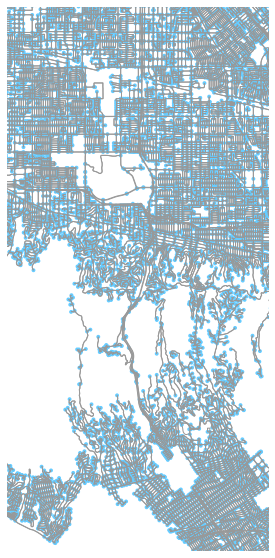

In [7]:
test.plot_map_extent()

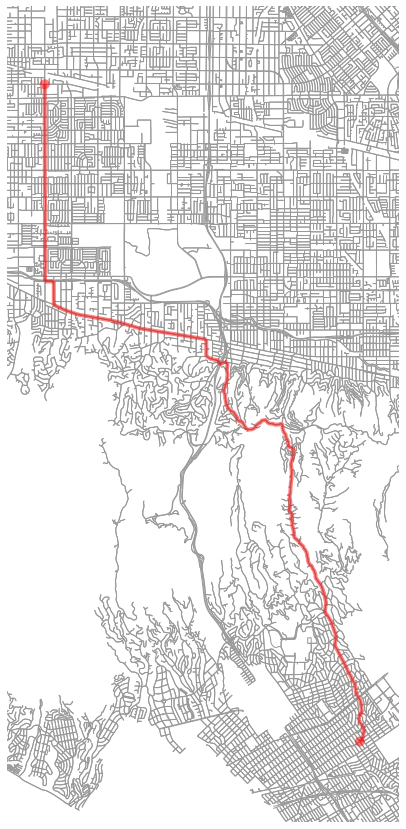

In [8]:
test.plot_shortest_route()

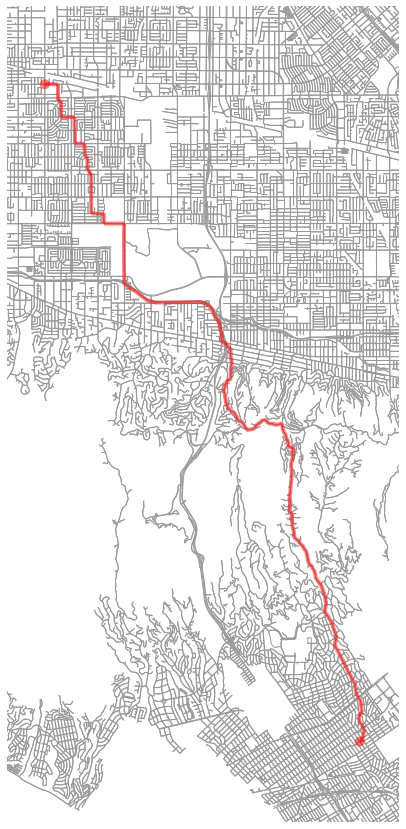

In [9]:
test.plot_safety_weighted_route()

In [ ]:
test.plot_shortest_route()

In [ ]:
test.plot_safety_weighted_route()

Shortest Path Length: 27245.89200000001
Safer Path Length: 27144.781000000003


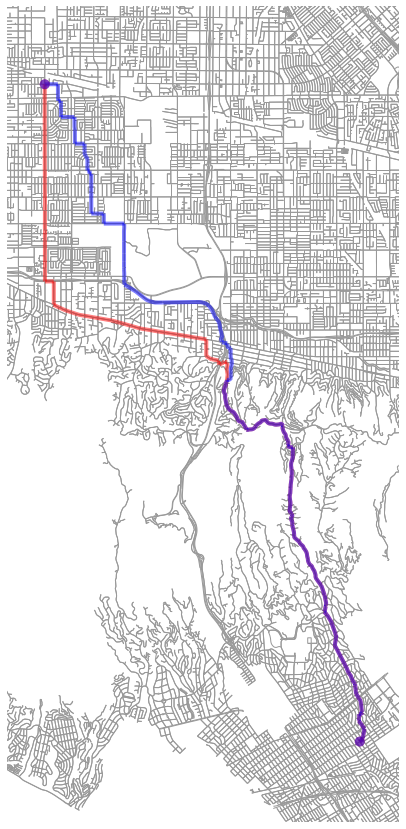

In [30]:
test.plot_two_routes()